## Imports

In [1]:
def print_dico(dico, left=1, right=2, K=[1, 2, 5, 10, 20]):
    for method in ["Cohere", "E5", "Laser2", "LaBSE", "SONAR"] :
        """
        print(f"{method} s2s")
        for key in dico[method]["s2s"] :
            v = dico[method]["s2s"][key]
            print(f"k = {key}, score = {round(v, left)}")
        print(f"{method} s2t")
        for key in dico[method]["s2t"] :
            v = dico[method]["s2t"][key]
            print(f"k = {key}, score = {round(v, left)}")
        """
        p1 = f"{method} s2s "
        p2 = f"{method} s2t "
        for k in K :
            try :
                v = dico[method]["s2s"][k]
                p1 += f"& {round(v, left)} "
                v = dico[method]["s2t"][k]
                p2 += f"& {round(v, left)} "
            except :
                pass
        print(p1)
        print(p2)
    print("Random")
    for key in dico["Random"]["s2s"] :
        d = dico["Random"]["s2s"][key]
        a = d["mean"]
        b = d["std"]
        print(f"k = {key}, score = {round(a, left)}, var = {round(b, right)}")

In [2]:
%cd experiments/ICL-MT/

[Errno 2] No such file or directory: 'experiments/ICL-MT/'
/home/azebazed/experiments/ICL-MT


In [3]:
import os
import json
from datasets import load_dataset
from utils import MAPPING_LANG_TO_KEY
import matplotlib.pyplot as plt
import numpy as np

In [4]:
from sacrebleu.metrics import BLEU, CHRF
bleu = BLEU(tokenize="flores200")
chrf = CHRF(word_order=2)

In [5]:
MP = {"eng" : "English", "fr" : "French", "wol" : "Wolof", "swh" : "Swahili", "deu": "German", "fra" : "French"}
ds_dict = {}
ds_dict["eng"] = load_dataset("facebook/flores", "eng_Latn")
ds_dict["fra"] = load_dataset("facebook/flores", "fra_Latn")
ds_dict["swh"] = load_dataset("facebook/flores", "swh_Latn")
ds_dict["wol"] = load_dataset("facebook/flores", "wol_Latn")
ds_dict["deu"] = load_dataset("facebook/flores", "deu_Latn")

In [6]:
import fasttext
from huggingface_hub import hf_hub_download
from transformers import AutoTokenizer
model_path = hf_hub_download(repo_id="facebook/fasttext-language-identification", filename="model.bin")
model = fasttext.load_model(model_path)
tokenizer = AutoTokenizer.from_pretrained("bigscience/bloom-7b1")

In [7]:
def get_metadata(
    direction: str, 
    data_dir="out",
    methods=["Laser", "Cohere", "E5", "LaBSE", "SONAR", "Random"],
    lid=False
):
    d_out = {}
    for method in methods:
        d_out[method] = {}
        d_out[method] = {}
        for filename in os.listdir(f"./{data_dir}/{method}/{direction}"):
            features = filename.split(".")[0].split("_")
            src = features[0]
            tgt = features[2]
            k = int(features[3])
            strategy = features[-1]
            seed = features[6]
            if tgt != MP[direction.split("_")[-1].lower()] :
                continue
            if strategy in d_out[method] :
                pass
            else :
                d_out[method][strategy] = {}
            
            avg_number_of_tokens = 0
            number_of_empty = 0
            number_of_elements = 0
            number_with_right_label = 0
            distribution = {}
            with open(os.path.join(f"./{data_dir}/{method}/{direction}", filename), "r") as fin :
                for i, line in enumerate(fin) : 
                    prediction = json.loads(line)["translation"]
                    number_of_empty += (len(prediction.strip()) == 0)
                    avg_number_of_tokens += len(tokenizer(prediction)["input_ids"])
                    number_of_elements += 1
                    if lid :
                        if len(prediction.strip()) != 0 :
                            label, probability = model.predict(prediction.split("\n")[0])
                            label = label[0]
                            number_with_right_label += (MAPPING_LANG_TO_KEY[tgt] in label)
                            if label in distribution :
                                distribution[label].append(i)
                            else :
                                distribution[label] = [i]
            avg_number_of_tokens /= number_of_elements
            score = number_with_right_label if lid else avg_number_of_tokens
            if method != "Random" :
                d_out[method][strategy][k] = score
            else :
                if k not in d_out[method][strategy] :
                    d_out[method][strategy][k] = {seed : score}
                else :
                    d_out[method][strategy][k][seed] = score
    try : 
        # Mean for Random outputs
        for key_1 in d_out["Random"] :
            for key_2 in d_out["Random"][key_1] :
                values = [v for v in d_out["Random"][key_1][key_2].values()]
                mean = np.mean(values)
                std = np.std(values)
                d_out["Random"][key_1][key_2] = {
                    "mean" : mean,
                    "std" : std
                }
    except :
        print(f"The method 'Random' is not part of {methods}.")
    return d_out

In [8]:
def get_full_metadata(
    direction: str, 
    data_dir="out",
    methods=["Laser", "Cohere", "E5", "LaBSE", "SONAR", "Random"],
):
    d_out = {}
    for method in methods:
        d_out[method] = {}
        d_out[method] = {}
        for filename in os.listdir(f"./{data_dir}/{method}/{direction}"):
            features = filename.split(".")[0].split("_")
            src = features[0]
            tgt = features[2]
            k = int(features[3])
            strategy = features[-1]
            seed = features[6]
            if tgt != MP[direction.split("_")[-1].lower()] :
                continue
            if strategy in d_out[method] :
                pass
            else :
                d_out[method][strategy] = {}
            
            number_of_empty = 0
            number_of_elements = 0
            number_with_right_label = 0
            distribution = {}
            with open(os.path.join(f"./{data_dir}/{method}/{direction}", filename), "r") as fin :
                for i, line in enumerate(fin) : 
                    number_of_elements += 1
                    prediction = json.loads(line)["translation"]
                    if len(prediction.strip()) == 0 :
                        number_of_empty += 1
                    else :
                        label, probability = model.predict(prediction.split("\n")[0])
                        label = label[0]
                        number_with_right_label += (MAPPING_LANG_TO_KEY[tgt] in label)
                        if label in distribution :
                            distribution[label].append(i)
                        else :
                            distribution[label] = [i]
            a, b, c = (number_of_elements - number_with_right_label - number_of_empty), number_with_right_label, number_of_empty
            if method != "Random" :
                d_out[method][strategy][k] = (a, b, c)
            else :
                if k not in d_out[method][strategy] :
                    d_out[method][strategy][k] = {seed : (a, b, c)}
                else :
                    d_out[method][strategy][k][seed] = (a, b, c)
    try :
        # Mean for Random outputs
        for key_1 in d_out["Random"] :
            for key_2 in d_out["Random"][key_1] :
                values = [v for v in d_out["Random"][key_1][key_2].values()]
                means = []
                stds = []
                for i in range(3):
                    mean = np.mean([v[i] for v in values])
                    std = np.std([v[i] for v in values])
                    means.append(mean)
                    stds.append(std)
                d_out["Random"][key_1][key_2] = {
                    "mean" : means,
                    "std" : stds
                }
    except :
        print(f"The method 'Random' is not part of {methods}.")
    return d_out

In [9]:
def get_scores(
    direction: str, 
    data_dir="out",
    methods=["Laser", "Cohere", "E5", "LaBSE", "SONAR", "Random"]
):
    d_bleu = {}
    d_chrf = {}
    for method in methods:
        d_bleu[method] = {}
        d_chrf[method] = {}
        for filename in os.listdir(f"./{data_dir}/{method}/{direction}"):
            features = filename.split(".")[0].split("_")
            src = features[0]
            tgt = features[2]
            k = int(features[3])
            strategy = features[-1]
            seed = features[6]
            if tgt != MP[direction.split("_")[-1].lower()] :
                continue
            # BLEU
            if strategy in d_bleu[method] :
                pass
            else :
                d_bleu[method][strategy] = {}
            # chRF
            if strategy in d_chrf[method] :
                pass
            else :
                d_chrf[method][strategy] = {}
            
            predictions = []
            with open(os.path.join(f"./{data_dir}/{method}/{direction}", filename), "r") as fin :
                for line in fin : 
                    predictions.append(json.loads(line)["translation"])
            targets = [
                example["sentence"] for example in ds_dict[direction.split("_")[-1].lower()]["devtest"]
            ]
            #assert len(predictions) == len(targets), "The number of predictions does not match the number of sentences."
            if len(predictions) != len(targets) :
                print(f"{filename} = {len(predictions)}")
            b = bleu.corpus_score(predictions, [targets]).score
            c = chrf.corpus_score(predictions, [targets]).score
            if method != "Random" :
                d_bleu[method][strategy][k] = b
                d_chrf[method][strategy][k] = c
            else :
                if k not in d_bleu[method][strategy] :
                    d_bleu[method][strategy][k] = {seed : b}
                else :
                    d_bleu[method][strategy][k][seed] = b
                if k not in d_chrf[method][strategy] :
                    d_chrf[method][strategy][k] = {seed : c}
                else :
                    d_chrf[method][strategy][k][seed] = c
    try : 
        # Mean for Random outputs
        # BLEU
        for key_1 in d_bleu["Random"] :
            for key_2 in d_bleu["Random"][key_1] :
                values = [v for v in d_bleu["Random"][key_1][key_2].values()]
                mean = np.mean(values)
                std = np.std(values)
                d_bleu["Random"][key_1][key_2] = {
                    "mean" : mean,
                    "std" : std
                }
        # chrF++
        for key_1 in d_chrf["Random"] : # key_1 in ["s2s", "s2t", "t2t"]
            for key_2 in d_chrf["Random"][key_1] : # key_2 in [1, 2, 5, 10, 20]
                values = [v for v in d_chrf["Random"][key_1][key_2].values()]
                mean = np.mean(values)
                std = np.std(values)
                d_chrf["Random"][key_1][key_2] = {
                    "mean" : mean,
                    "std" : std
                }
    except :
        print(f"The method 'Random' is not part of {methods}.")
    return d_bleu, d_chrf

In [10]:
def load_scores(
    direction: str,
    score = "COMET",
    data_dir = "./comet_scores",
    methods=["Laser", "Cohere", "E5", "LaBSE", "SONAR", "Random"]
):
    with open(f"{data_dir}/{direction}_scores.json", "r") as fin :
        for line in fin :
            d_score = json.loads(line)
            break
    if score == "COMET" :
        # Mean for Random outputs
        # COMET/BLEU/chrF++
        try :
            for key_1 in d_score["Random"] :
                for key_2 in d_score["Random"][key_1] :
                    values = [v for v in d_score["Random"][key_1][key_2].values()]
                    mean = np.mean(values)
                    std = np.std(values)
                    d_score["Random"][key_1][key_2] = {
                        "mean" : mean,
                        "std" : std
                    }
        except :
            pass
    for method in methods :
        for strat in ["s2s", "s2t", "t2t"] :
            if strat not in d_score[method] :
                continue
            for k in [0, 1, 2, 5, 10, 20] :
                if str(k) not in d_score[method][strat] :
                    continue
                d_score[method][strat][k] = d_score[method][strat][str(k)]
                del d_score[method][strat][str(k)]

    return d_score

In [11]:
def get_plot(
    direction, 
    dico, 
    method_of_interest="Cohere", 
    metric="BLEU", 
    K = [1, 2, 5, 10, 20],
    with_zero_shot = False
):
    source, _, target = direction.split("_")
    plt.figure(figsize=(5, 5))
    plt.xticks(
        ticks = K,
        labels = K
    )
    if with_zero_shot :
        try :
            zs_mean = dico["Random"]["s2s"][0]["mean"]
            zs_std = dico["Random"]["s2s"][0]["std"]
        except :
            zs_mean, zs_std = None, None
    else :
        zs_mean, zs_std = None, None    
    
    random_vec = [dico["Random"]["s2s"][v] for v in K]
    random_mean = [element["mean"] for element in random_vec]
    random_std = [element["std"] for element in random_vec]
    plt.errorbar(
        [0] + K if zs_mean is not None else K, 
        [zs_mean] + random_mean if zs_mean is not None else random_mean,
        [zs_std] + random_std if zs_std is not None else random_std,
        label=f"Random", 
        linestyle="--",
        linewidth=1.0,
        marker="o",
        markersize=3
    )
    
    for s in ["s2s", "s2t", "t2t"] :
        if s not in dico[method_of_interest] :
            continue
        plt.plot(
            [0] + K if zs_mean is not None else K, 
            [zs_mean] + [dico[method_of_interest][s][v] for v in K] if zs_mean is not None else [dico[method_of_interest][s][v] for v in K], 
            label=f"{method_of_interest} {s}", 
            linestyle="--", 
            linewidth=1.0, 
            marker="o", 
            markersize=3
        )
    plt.xlabel("Examplar Number")
    plt.ylabel(f"{metric}")
    plt.grid(color="grey", linestyle="--", linewidth=0.5)
    plt.title(f"{source} $\\rightarrow$ {target}")
    plt.legend()
    plt.show()

In [12]:
def get_plots(
    direction, 
    dico, 
    metric,
    K = [1, 2, 5, 10],
    methods = ["Laser", "LaBSE", "E5", "Cohere", "SONAR"]+["BLOOM_one", "BLOOM_middle", "BLOOM_last"],
    with_zero_shot = False
):
    f, ax = plt.subplots(1, 3, sharey=True, figsize=(15, 10))
    """
    for ax_ in ax.flatten():
        ax_.axhline(dico["Random"]["s2s"][0], color='red', linestyle='--', label='Common Line')
    """
    plt.xticks(
        ticks = K,
        labels = K
    )
    names = {
        "s2s" : "Source to source",
        "s2t" : "Source to target",
        "t2t" : "Target to target"
    }
    f.supxlabel("Examplar Number")
    f.supylabel(f"{metric}")
    if with_zero_shot :
        try :
            zs_mean = dico["Random"]["s2s"][0]["mean"]
            zs_std = dico["Random"]["s2s"][0]["std"]
        except :
            zs_mean, zs_std = None, None
    else :
        zs_mean, zs_std = None, None
        
    for i, strat in enumerate(["s2s", "s2t", "t2t"]):
        random_vec = [dico["Random"]["s2s"][v] for v in K]
        random_mean = [element["mean"] for element in random_vec]
        random_std = [element["std"] for element in random_vec]
        ax[i].errorbar(
            [0] + K if zs_mean is not None else K, 
            [zs_mean] + random_mean if zs_mean is not None else random_mean,
            [zs_std] + random_std if zs_std is not None else random_std,
            label=f"Random", 
            linestyle="--", 
            linewidth=1.0, 
            marker="^", 
            markersize=3
        )
        for method in methods :
            ax[i].plot(
                K, 
                [dico[method][strat][v] for v in K], 
                label=f"{method}", 
                linestyle="--", 
                linewidth=1.0, 
                marker="^", 
                markersize=3
            )

        ax[i].set_title(f"{names[strat]}")
        ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
        ax[i].legend(loc=4)
    source, _, target = direction.split("_")
    f.suptitle(f"{source} $\\rightarrow$ {target}", fontsize=15)
    plt.show()

In [13]:
def get_comparison_plots(
    direction, 
    dico,
    methods,
    metric="BLEU", 
    K = [1, 2, 5, 10, 20],
    with_zero_shot=False,
    family_1="pool"
):
    source, _, target = direction.split("_")
    plt.figure(figsize=(5, 5))
    plt.xticks(
        ticks = K,
        labels = K
    )
    key_random_1, key_random_2 = None, None
    for key in dico :
        if "Random" in key :
            if key.endswith(family_1) :
                key_random_1 = key
            else :
                key_random_2 = key

    if with_zero_shot :
        try :
            zs_mean_1 = dico[key_random_1]["s2s"][0]["mean"]
            zs_std_1 = dico[key_random_1]["s2s"][0]["std"]
            zs_mean_2 = dico[key_random_2]["s2s"][0]["mean"]
            zs_std_2 = dico[key_random_2]["s2s"][0]["std"]
        except :
            zs_mean_1, zs_std_1, zs_mean_2, zs_std_2 = None, None, None, None
    else :
        zs_mean_1, zs_std_1, zs_mean_2, zs_std_2 = None, None, None, None   
    
    for method in methods :
        if method.endswith(family_1) :
            key_random, zs_mean, zs_std = key_random_1, zs_mean_1, zs_std_1
            linestyle, marker = "dashed", "o"
        else :
            key_random, zs_mean, zs_std = key_random_2, zs_mean_2, zs_std_2
            linestyle, marker = "solid", "^"
        if "Random" in method :
            random_vec = [dico[key_random]["s2s"][v] for v in K]
            random_mean = [element["mean"] for element in random_vec]
            random_std = [element["std"] for element in random_vec]
            plt.errorbar(
                [0] + K if zs_mean is not None else K, 
                [zs_mean] + random_mean if zs_mean is not None else random_mean,
                [zs_std_1] + random_std if zs_std is not None else random_std,
                label=f"{key_random}", 
                linestyle=linestyle,
                linewidth=1.0,
                marker=marker,
                markersize=3
            )
        else :
            for s in ["s2s", "s2t", "t2t"] :
                plt.plot(
                    [0] + K if zs_mean is not None else K, 
                    [zs_mean] + [dico[method][s][v] for v in K] if zs_mean is not None else [dico[method][s][v] for v in K], 
                    label=f"{method} {s}", 
                    linestyle=linestyle, 
                    linewidth=1.0, 
                    marker=marker, 
                    markersize=3
                )

    plt.xlabel("Examplar Number")
    plt.ylabel(f"{metric}")
    plt.grid(color="grey", linestyle="--", linewidth=0.5)
    plt.title(f"{source} $\\rightarrow$ {target}")
    plt.legend()
    plt.show()

In [14]:
def get_analysis(
    direction: str,
    dico,
    rows, cols,
    strat = "s2s",
    colors = ["red", "green", "blue"],
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]+["BLOOM_one", "BLOOM_middle", "BLOOM_last"]+["BLOOM_one_avg", "BLOOM_middle_avg", "BLOOM_last_avg"],
    number_of_subdivisions = 3,
    with_zero_shot = False,
    K = [1, 2, 5, 10, 20],
    constraint = False
):
    assert rows*cols == len(methods), f"The product {rows} times {cols} is not equal to {len(methods)}"
    f, ax = plt.subplots(rows, cols, sharey=True, figsize=(8, 5))
    if rows == 1 :
        ax = [ax]
    plt.subplots_adjust(
        left=0.1,
        bottom=0.1, 
        right=0.9, 
        top=0.9, 
        wspace=0.4, 
        hspace=0.4
    )
    plt.xticks(
        ticks = K,
        labels = K
    )
    names = {
        "s2s" : "Source to source",
        "s2t" : "Source to target",
        "t2t" : "Target to target"
    }
    issues = {
        0 : "Wrong target language",
        1 : "Right target language",
        2 : "Empty sentence"
    }
    f.supxlabel("Examplar Number")
    f.supylabel("Number of sentences in the benchmark")
    if with_zero_shot :
        try :
            zs_mean = dico["Random"]["s2s"][0]["mean"]
            zs_std = dico["Random"]["s2s"][0]["std"]
        except :
            zs_mean, zs_std = None, None
    else :
        zs_mean, zs_std = None, None

    for i in range(rows):
        for j in range(cols):
            index = i*cols + j
            method = methods[index]
            if zs_mean is not None :
                bottom = 0
                for q in range(number_of_subdivisions):
                    ax[i][j].bar(
                        0,
                        zs_mean[q],
                        yerr=zs_std[q],
                        capsize=5,
                        color=colors[q],
                        bottom=bottom,
                        label=f"{issues[q]}"
                    )
                    bottom += zs_mean[q]
            if method == "Random" :
                random_vec = [dico["Random"]["s2s"][v] for v in K]
                random_mean = [element["mean"] for element in random_vec]
                random_std = [element["std"] for element in random_vec]
                
                subdivisions_mean = {
                    p : [element[p] for element in random_mean] for p in range(number_of_subdivisions)
                }
                subdivisions_std = {
                    p : [element[p] for element in random_std] for p in range(number_of_subdivisions)
                }
                
                for p in range(len(K)): # number of shots
                    bottom = 0
                    for q in range(number_of_subdivisions):
                        ax[i][j].bar(
                            K[p],
                            subdivisions_mean[q][p],
                            yerr=subdivisions_std[q][p],
                            capsize=5,
                            color=colors[q],
                            bottom=bottom
                        )
                        bottom += subdivisions_mean[q][p]
                
            else :
                vec = [dico[method][strat][v] for v in K]
                subdivisions = {
                    p : [element[p] for element in vec] for p in range(number_of_subdivisions)
                }

                for p in range(len(K)): # number of shots
                    bottom = 0
                    for q in range(number_of_subdivisions):
                        ax[i][j].bar(
                            K[p],
                            subdivisions[q][p],
                            capsize=5,
                            color=colors[q],
                            bottom=bottom,
                        )
                        bottom += subdivisions[q][p]

            ax[i][j].set_title(f"{method}", fontsize=10)
            ax[i][j].grid(color="grey", linestyle="--", linewidth=0.5)
            ax[i][j].legend(loc=4, fontsize=5)
    if constraint :
        plt.ylim([990, 1012])
    source, _, target = direction.split("_")
    f.suptitle(f"What happens under the hood with {names[strat]}?\n{source} $\\rightarrow$ {target}", fontsize=10)
    plt.show()

# ALL

In [15]:
NAMES = ["bloom", "gemma-2b", "gemma", "llama-2-7b", "llama-2-13b", "llama-2-70b", "olmo", "mistral-v0.1", "mixtral"]
names = ["BLOOM 7b1", "Gemma 2b", "Gemma 7b", "LLaMA 2 7b", "LLaMA 2 13b", "LLaMA 2 70b", "OLMo 7b", "Mistral 7b v0.1", "Mixtral 8x7b v0.1"]

In [16]:

direction = "Eng_to_Swh"

d_list = []
for name in NAMES :
    d_bleu = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = f"./generations/{name}/bleu_scores",
        #data_dir = f"./generations/{name}/comet_scores",
        #data_dir = f"./generations/{name}/comet_la_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    ngram_metrics = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = f"./generations/{name}/ngram/bleu_scores",
        #data_dir = f"./generations/{name}/ngram/comet_scores",
        #data_dir = f"./generations/{name}/ngram/comet_la_scores",
        methods=["bm25"]
    )
    d_bleu["bm25"] = ngram_metrics["bm25"]
    #"""
    merge = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = f"./generations/{name}/test/bleu_scores",
        #data_dir = f"./generations/{name}/test/comet_scores",
        #data_dir = f"./generations/{name}/test/comet_la_scores",
        methods=["SONAR+Bm25"]
    )
    #d_bleu["RBM25"] = merge["RBM25"]
    d_bleu["SONAR+Bm25"] = merge["SONAR+Bm25"]
    #d_bleu["RoBERTa"] = merge["RoBERTa"]
    #d_bleu["SONAR_2"] = merge["SONAR"]
    #d_bleu["SONAR_2"]["s2s"] = merge["SONAR"]["mix"]
    #"""
    for key in d_bleu["Random"]["s2s"] :
        if "mean" in d_bleu["Random"]["s2s"][key] :
            continue
        else :
            values = list(d_bleu["Random"]["s2s"][key].values())
            d_bleu["Random"]["s2s"][key] = {"mean" : np.mean(values), "std" : np.std(values)}
    d_list.append(d_bleu)

In [17]:
DP = {
    "Eng" : "English",
    "Fra" : "French",
    "Deu" : "German",
    "Swh" : "Swahili",
    "Wol" : "Wolof"
}

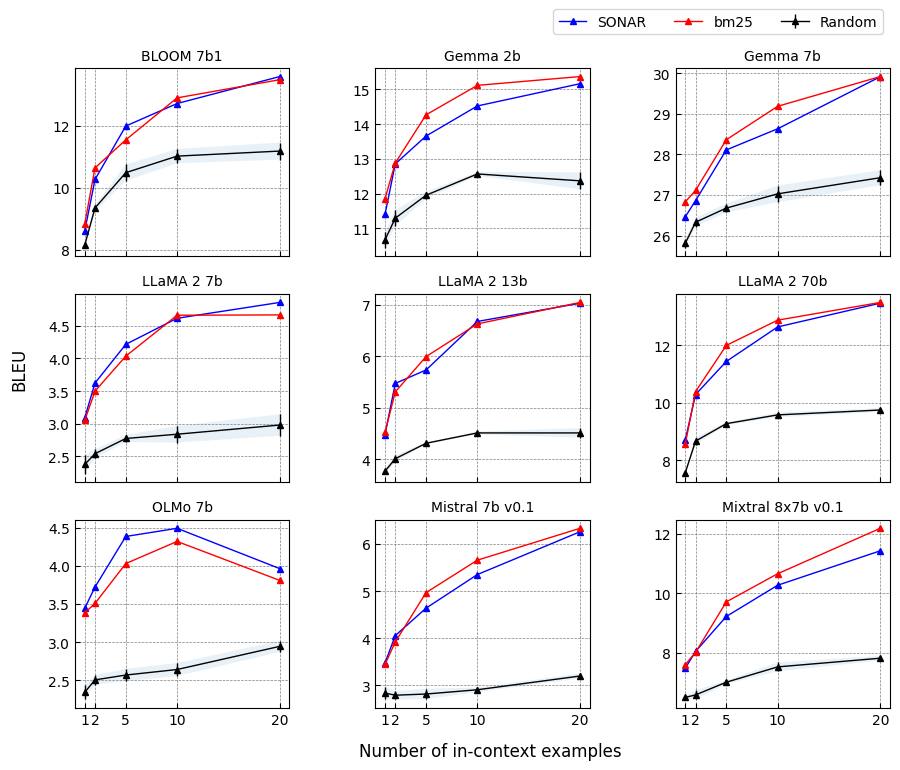

In [18]:
from matplotlib.ticker import FormatStrFormatter
metric = "BLEU"
#metric = "Language-Aware COMET"
strategy = "s2s"
source, _, target = direction.split("_")
method_of_interest = "SONAR"
K = [1, 2, 5, 10, 20]
#K = [1, 2, 5, 10]
colors = ["blue", "red", "green"]
if len(NAMES)%3 == 0 :
    rows = 3
elif len(NAMES)%4 == 0 :
    rows = 4
else :
    rows = 2
cols = len(NAMES)//rows

f, ax = plt.subplots(
    rows,
    cols,
    sharex=True,
#    sharey='row',
#    sharey=True,
#    figsize=(6, 10)
    figsize=(10, 8)
)
#"""
plt.subplots_adjust(
    left=0.085,
    bottom=0.075, 
    #right=0.9, 
    top=0.875, 
    wspace=0.4, 
    #hspace=0.4
)
#"""
plt.xticks(
    ticks = K,
    labels = K,
)
f.supxlabel("Number of in-context examples")
f.supylabel(f"{metric}")

for i in range(rows):
    for j in range(cols) :
        key = i*cols + j
        dico = d_list[key]
        random_vec = [dico["Random"]["s2s"][v] for v in K]
        random_mean = [element["mean"] for element in random_vec]
        random_std = [element["std"] for element in random_vec]
        #random_mean = [round(100*element, 1) for element in random_mean]
        #random_std = [round(100*element, 1) for element in random_std]
        ax[i][j].errorbar(
            K,
            random_mean,
            random_std,
            label=f"Random", 
            #linestyle="--",
            linewidth=1.0,
            marker="^",
            markersize=4,
            color="black"
        )
        ax[i][j].fill_between(
            K, 
            [a - b for (a, b) in zip(random_mean, random_std)], 
            [a + b for (a, b) in zip(random_mean, random_std)],
            linewidth=0.0,
            alpha=0.1,
        )
        #for method_of_interest in ["Laser2", "Cohere","LaBSE", "SONAR", "E5"] :
        for l, method_of_interest in enumerate([
            "SONAR",
            "bm25",
            #"RBM25"
            #"RoBERTa"
            #"SONAR_2",
            #"SONAR+Bm25"
        ]):
            #x = K[:-1] if NAMES[key] in ["bloom", "olmo"] else K
            x = K#[:-1]
            for v in x :
                try:
                    dico[method_of_interest][strategy][v] = dico[method_of_interest][strategy][str(v)]
                except:
                    pass
            
            strategy = "mix" if method_of_interest == "SONAR_2" else strategy
            ax[i][j].plot(
                x,
                [dico[method_of_interest][strategy][v] for v in x],
                #[round(100*element, 1) for element in [dico[method_of_interest][strategy][v] for v in x]],
                label=f"{method_of_interest}" if method_of_interest != "SONAR+Bm25" else "SONAR$\odot$bm25", 
                #linestyle="--", 
                linewidth=1.0, 
                marker="^", 
                markersize=4,
                color=colors[l],
                #color="blue"
            )
            strategy = "s2s"
        ax[i][j].set_title(f"{names[key]}", fontsize=10)
        ax[i][j].grid(color="grey", linestyle="--", linewidth=0.5)
        #ax[i][j].legend(loc=4)
        ax[i][j].tick_params(direction = "in")
        #ax[i][j].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
lines, labels = ax[0][0].get_legend_handles_labels()
plt.legend(handles=lines, labels=labels, bbox_to_anchor=[1.0, 3.75], ncol=4)

source, _, target = direction.split("_")
#f.suptitle(f"{DP[source]} $\\rightarrow$ {DP[target]}", fontsize=12)
#plt.savefig("bleu_fra.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [19]:
direction = "Eng_to_Wol"
M = ["SONAR+Bm25", "SONAR", "RBM25", "RoBERTa"]
for name in NAMES:
    try :
        d_bleu = load_scores(
            direction = direction,
            score = "BLEU",
            data_dir = f"./generations/{name}/test/bleu_scores",
            methods=M
        )
        d_chrf = load_scores(
            direction = direction,
            score = "chrF++",
            data_dir = f"./generations/{name}/test/chrf_scores",
            methods=M
        )
    except :
        os.makedirs(f"./generations/{name}/test/bleu_scores", exist_ok=True)
        os.makedirs(f"./generations/{name}/test/chrf_scores", exist_ok=True)
        d_bleu, d_chrf = get_scores(
            direction, 
            data_dir=f"./generations/{name}/test",
            methods=M
        )
        with open(f"./generations/{name}/test/bleu_scores/{direction}_scores.json", "w") as fout:
            json.dump(d_bleu, fout)
        with open(f"./generations/{name}/test/chrf_scores/{direction}_scores.json", "w") as fout:
            json.dump(d_chrf, fout)

In [20]:
def compare_strategies(
    directions,
    names = ["bloom", "gemma-2b", "gemma", "llama-2-7b"],
    method_of_interest="Cohere", 
    metric="BLEU", 
    K = [1, 2, 5, 10, 20]
):
    f, ax = plt.subplots(len(directions), len(names), figsize=(10, 10))
    plt.xticks(
        ticks = K,
        labels = K
    )
    plt.subplots_adjust(
        left=0.15,
        bottom=0.075, 
        right=0.9, 
        top=0.9, 
        wspace=0.4, 
        hspace=0.4
    )
    f.supxlabel("Number of in-context examples")
    f.supylabel(f"{metric}")
    for i, direction in enumerate(directions) :
        for j, name in enumerate(names) :
            dico = load_scores(
                direction = direction,
                score = metric,
                data_dir = f"./generations/{name}/{metric.lower()}_scores",
                methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
            )
            random_vec = [dico["Random"]["s2s"][v] for v in K]
            random_mean = [element["mean"] for element in random_vec]
            random_std = [element["std"] for element in random_vec]
            ax[i][j].errorbar(
                K, 
                random_mean,
                random_std, 
                label=f"Random", 
                linestyle="--", 
                linewidth=1.0, 
                marker="^", 
                markersize=4
            )
            ax[i][j].fill_between(
                K, 
                [a - b for (a, b) in zip(random_mean, random_std)], 
                [a + b for (a, b) in zip(random_mean, random_std)],
                linewidth=0.0,
                alpha=0.1,
            )
            for _, strat in enumerate(["s2s", "s2t"]) :
                ax[i][j].plot(
                    K, 
                    [dico[method_of_interest][strat][v] for v in K], 
                    label=f"{strat}",  
                    linewidth=1.0, 
                    marker="^", 
                    markersize=3
                )
            source, _, target = direction.split("_")
            ax[i][j].set_title(f"{source} $\\rightarrow$ {target}\n{name}", fontsize=8)
            ax[i][j].grid(color="grey", linestyle="--", linewidth=0.5)
            ax[i][j].legend(loc=4, prop = {"size" : 5})
            ax[i][j].set_xticks(K)
            ax[i][j].tick_params(direction = "in")
            
    f.suptitle(f"{method_of_interest}", fontsize=10)
    plt.subplots_adjust(hspace=0.4, wspace=0.2)
    plt.show()

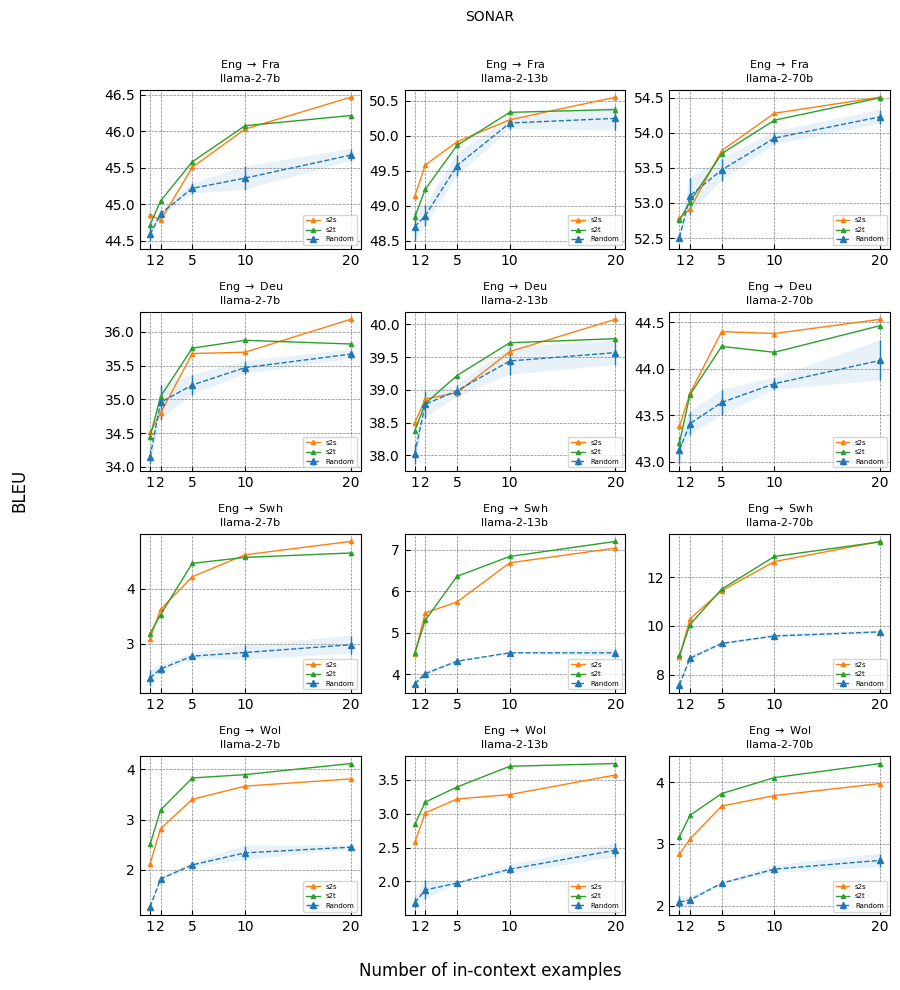

In [21]:
compare_strategies(
    directions = ["Eng_to_Fra", "Eng_to_Deu", "Eng_to_Swh", "Eng_to_Wol"],
    method_of_interest = "SONAR",
    metric = "BLEU",
    names = ["llama-2-7b", "llama-2-13b", "llama-2-70b"]
)

In [21]:
METHODS = ["Cohere", "E5", "LaBSE", "Laser2", "SONAR", "Random"]
METHODS = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"]
#METHODS = ["RBM25", "RoBERTa", "SONAR", "SONAR+Bm25"]
#METHODS = ["RBM25", "RoBERTa"]
#K = [1, 2, 5, 10, 20]
K = [1, 5, 10]
list_of_outputs = []
for name in NAMES :
#for name in ["bloom", "llama-2-7b"]:
    DIRECTIONS = ["Eng_to_Fra", "Eng_to_Deu", "Eng_to_Swh", "Eng_to_Wol"]
    #DIRECTIONS = ["Fra_to_Eng", "Deu_to_Eng", "Swh_to_Eng", "Wol_to_Eng"]
    print(f"Embedding model: {name}")
    outputs = {method : "" for method in METHODS}
    for i, data_dir in enumerate(["bleu_scores", "comet_scores", "comet_la_scores"]):
        prec = 1 if "bleu" in data_dir else 1
        scale = 1 if "bleu" in data_dir else 100
        for direction in DIRECTIONS :
            dic = load_scores(
                direction = direction,
                score = "BLEU" if "bleu" in data_dir else "COMET",
                data_dir = f"./generations/{name}/ngram/{data_dir}",
                #data_dir = f"./generations/{name}/{data_dir}",
                #data_dir = f"./generations/{name}/test/{data_dir}",
                methods = METHODS
            )
            if "Random" in dic :
                for key in dic["Random"]["s2s"] :
                    if "mean" in dic["Random"]["s2s"][key] :
                        continue
                    else :
                        values = list(dic["Random"]["s2s"][key].values())
                        dic["Random"]["s2s"][key] = {
                            "mean" : np.mean(values), 
                            "std" : np.std(values)
                        }
            for method in METHODS :
                prompt = outputs[method]
                for k in K :
                    if method != "Random" :
                        prompt += f"& {round(scale*dic[method]['s2s'][k], prec)} "
                    else :
                        prompt += f"& {round(scale*dic[method]['s2s'][k]['mean'], prec)} "
                prompt = prompt.strip()+" "
                outputs[method] = prompt
        for key in outputs :
            outputs[key] = outputs[key] + "\\\\" + "\n"
    list_of_outputs.append(outputs)

Embedding model: bloom
Embedding model: gemma-2b
Embedding model: gemma
Embedding model: llama-2-7b
Embedding model: llama-2-13b
Embedding model: llama-2-70b
Embedding model: olmo
Embedding model: mistral-v0.1
Embedding model: mixtral


In [22]:
outputs = list_of_outputs[5]
for key in outputs :
    print(outputs[key])

& 52.8 & 53.5 & 54.2 & 42.9 & 43.6 & 44.0 & 8.6 & 12.0 & 12.9 & 2.6 & 3.1 & 3.7 \\
& 87.8 & 88.0 & 88.2 & 87.0 & 87.6 & 87.8 & 54.7 & 60.4 & 61.9 & 44.7 & 47.9 & 49.7 \\
& 87.7 & 87.9 & 88.1 & 86.9 & 87.6 & 87.7 & 50.6 & 60.1 & 61.8 & 37.9 & 45.8 & 48.7 \\

& 52.5 & 53.8 & 54.0 & 42.8 & 43.7 & 44.1 & 8.5 & 11.4 & 11.9 & 2.5 & 3.0 & 3.4 \\
& 87.6 & 88.0 & 88.2 & 87.2 & 87.5 & 87.7 & 54.6 & 59.6 & 60.3 & 44.1 & 47.6 & 48.2 \\
& 87.2 & 88.0 & 88.1 & 87.2 & 87.4 & 87.6 & 50.7 & 59.4 & 60.1 & 38.7 & 45.8 & 46.5 \\

& 52.6 & 53.7 & 54.2 & 43.0 & 44.0 & 44.1 & 8.0 & 9.7 & 10.0 & 2.3 & 2.8 & 2.9 \\
& 87.9 & 88.0 & 88.2 & 87.3 & 87.6 & 87.8 & 54.3 & 57.5 & 57.9 & 43.4 & 46.0 & 46.1 \\
& 87.8 & 87.9 & 88.2 & 87.2 & 87.6 & 87.8 & 50.8 & 57.3 & 57.7 & 37.9 & 43.7 & 44.3 \\

& 52.2 & 53.5 & 53.5 & 43.3 & 43.8 & 43.9 & 8.3 & 10.3 & 11.0 & 2.2 & 2.8 & 3.1 \\
& 87.6 & 88.0 & 88.1 & 87.3 & 87.5 & 87.8 & 54.5 & 58.7 & 59.9 & 43.1 & 46.9 & 47.8 \\
& 87.4 & 88.0 & 88.1 & 87.2 & 87.5 & 87.6 & 50.4 & 58.4 &

In [55]:
great = {}
for direction in ["Eng_to_Fra", "Eng_to_Deu", "Eng_to_Swh", "Eng_to_Wol"]:
    L_m = []
    for name in NAMES :
        d_full = get_full_metadata(
            direction = direction,
            data_dir = f"./generations/{name}",
            methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
        )
        d_f = get_full_metadata(
            direction = direction,
            data_dir = f"./generations/{name}/ngram",
            methods = ["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
        )
        for key in d_f :
            if key not in d_full :
                d_full[key] = d_f[key]
        
        L_m.append(d_full)
    great[direction] = L_m

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].
The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].

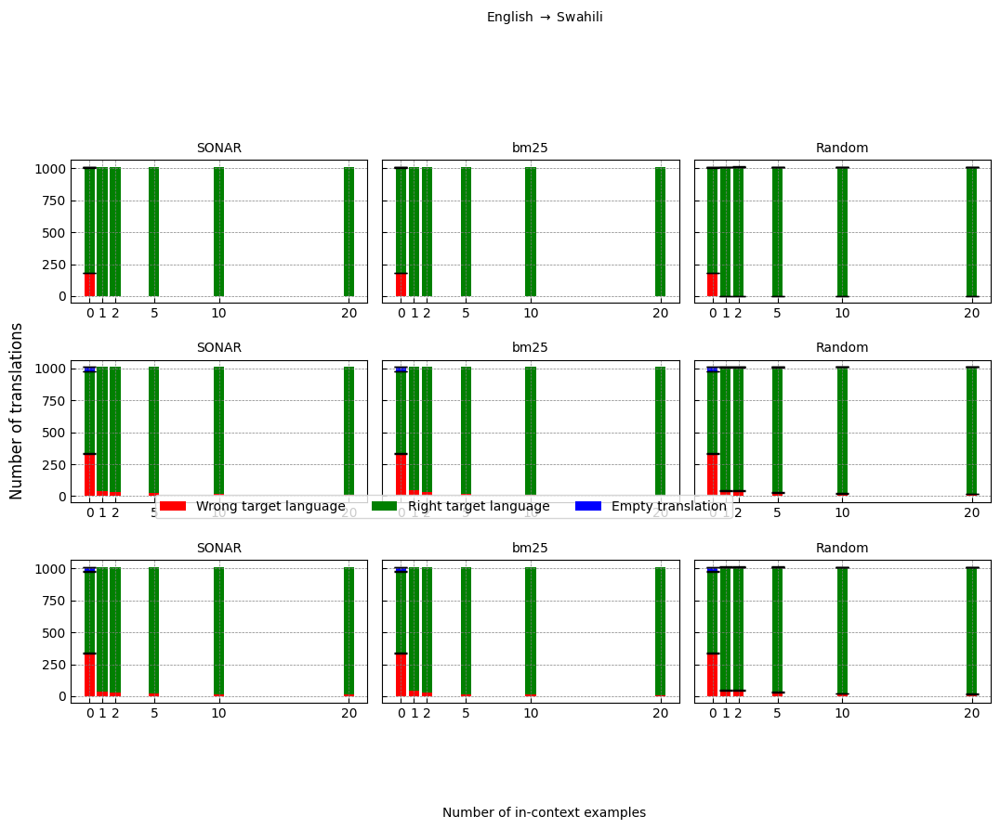

In [92]:
rows, cols = 3, 3
strat = "s2s"
colors = ["red", "green", "blue"]
methods = ["SONAR", "bm25", "Random"]
number_of_subdivisions = 3
colors = ["red", "green", "blue"]
K = [1, 2, 5, 10, 20]
constraint = False
with_zero_shot = True
direction = "Eng_to_Fra"

DP = {
    "Eng" : "English",
    "Fra" : "French",
    "Deu" : "German",
    "Swh" : "Swahili",
    "Wol" : "Wolof"
}

#assert rows*cols == len(methods), f"The product {rows} times {cols} is not equal to {len(methods)}"
f, ax = plt.subplots(rows, cols, sharey=True, figsize=(12, 3*rows))

if rows == 1 :
    ax = [ax]
plt.subplots_adjust(
    left=0.075,
    bottom=0.15, 
    right=0.9, 
    top=0.8, 
    wspace=0.05, 
    hspace=0.4
)
"""
plt.xticks(
    ticks = [0] + K if with_zero_shot else K,
    labels = [0] + K if with_zero_shot else K,
)
"""
names = {
    "s2s" : "Source to source",
    "s2t" : "Source to target",
    "t2t" : "Target to target"
}
issues = {
    0 : "Wrong target language",
    1 : "Right target language",
    2 : "Empty translation"
}
f.supxlabel("Number of in-context examples", fontsize=10)
f.supylabel("Number of translations")


for i in range(rows):
    if i == 0 :
        direction = "Eng_to_Fra"
    elif i == 1 :
        direction = "Eng_to_Swh"
    else :
        direction = "Eng_to_Swh"
    
    #direction = "Eng_to_Wol"
    dico = great[direction][-1] #L_m[i]
    if with_zero_shot :
        try :
            zs_mean = dico["Random"]["s2s"][0]["mean"]
            zs_std = dico["Random"]["s2s"][0]["std"]
        except :
            zs_mean, zs_std = None, None
    else :
        zs_mean, zs_std = None, None

    for j in range(cols):
        method = methods[j]
        if zs_mean is not None :
            bottom = 0
            for q in range(number_of_subdivisions):
                ax[i][j].bar(
                    0,
                    zs_mean[q],
                    yerr=zs_std[q],
                    capsize=5,
                    color=colors[q],
                    bottom=bottom,
                    label=f"{issues[q]}"
                )
                bottom += zs_mean[q]
        if method == "Random" :
            random_vec = [dico["Random"]["s2s"][v] for v in K]
            random_mean = [element["mean"] for element in random_vec]
            random_std = [element["std"] for element in random_vec]
            
            subdivisions_mean = {
                p : [element[p] for element in random_mean] for p in range(number_of_subdivisions)
            }
            subdivisions_std = {
                p : [element[p] for element in random_std] for p in range(number_of_subdivisions)
            }
            
            for p in range(len(K)): # number of shots
                bottom = 0
                for q in range(number_of_subdivisions):
                    ax[i][j].bar(
                        K[p],
                        subdivisions_mean[q][p],
                        yerr=subdivisions_std[q][p],
                        capsize=5,
                        color=colors[q],
                        bottom=bottom
                    )
                    bottom += subdivisions_mean[q][p]
            
        else :
            vec = [dico[method][strat][v] for v in K]
            subdivisions = {
                p : [element[p] for element in vec] for p in range(number_of_subdivisions)
            }

            for p in range(len(K)): # number of shots
                bottom = 0
                for q in range(number_of_subdivisions):
                    ax[i][j].bar(
                        K[p],
                        subdivisions[q][p],
                        capsize=5,
                        color=colors[q],
                        bottom=bottom,
                    )
                    bottom += subdivisions[q][p]

        ax[i][j].set_title(f"{method}", fontsize=10)
        ax[i][j].grid(color="grey", linestyle="--", linewidth=0.5)
        ax[i][j].tick_params(direction = "in")
        #ax[i][j].legend(loc=4, fontsize=5)
        ax[i][j].set_xticks(
            ticks = [0] + K if with_zero_shot else K,
            labels = [0] + K if with_zero_shot else K,
        )
lines, labels = ax[0][0].get_legend_handles_labels()
plt.legend(handles=lines, labels=labels, bbox_to_anchor=[0.15, 1.5], ncol=3)
if constraint :
    plt.ylim([990, 1012])
source, _, target = direction.split("_")
#f.suptitle(f"What happens under the hood with {names[strat]}?\n{source} $\\rightarrow$ {target}", fontsize=10)

f.suptitle(f"{DP[source]} $\\rightarrow$ {DP[target]}", fontsize=10)
#plt.savefig(f"{direction}.pdf", format="pdf", bbox_inches="tight")
#f.tight_layout()
plt.show()

# Llama 2 70B

## English to French

### Regular

In [17]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-70b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-70b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/llama-2-70b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [ ]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-70b/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [17]:
d_out_1 = get_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"],
    lid = True
)

In [18]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

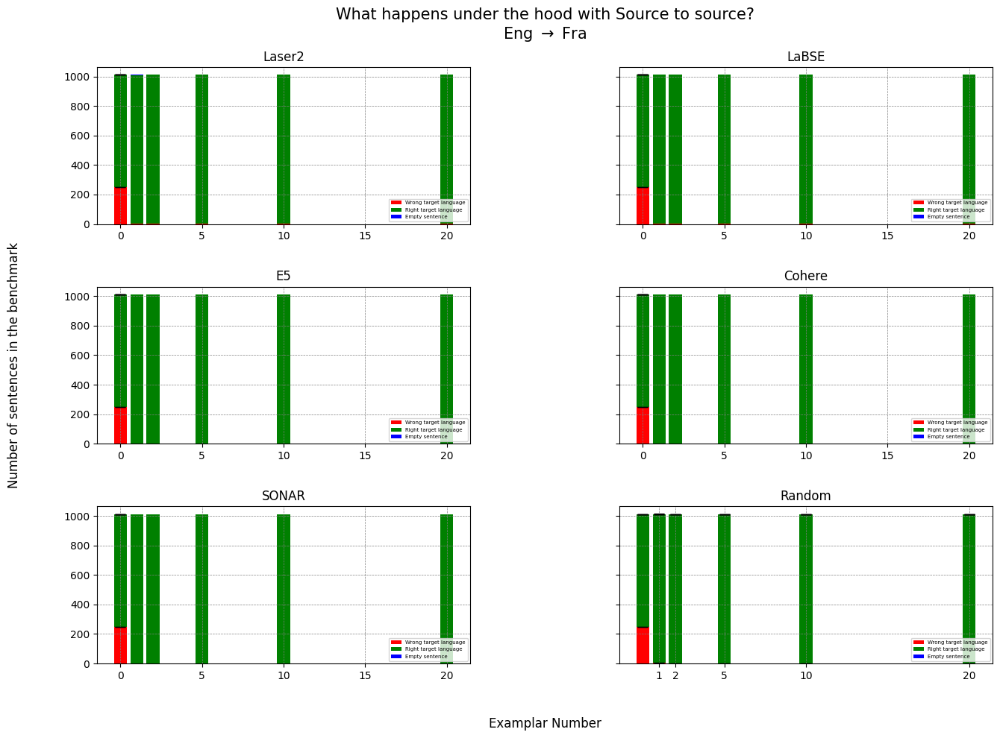

In [19]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

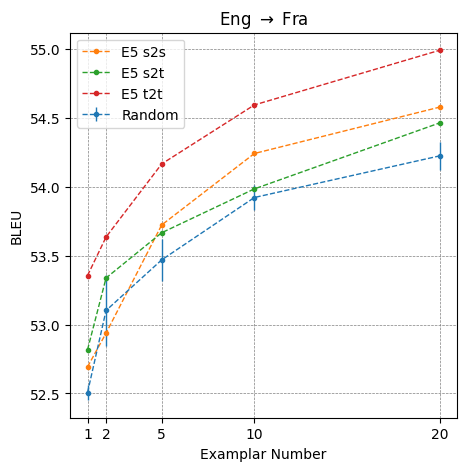

In [20]:
get_plot(
    direction,
    d_bleu_1,
    method_of_interest="E5",
    metric="BLEU"
)

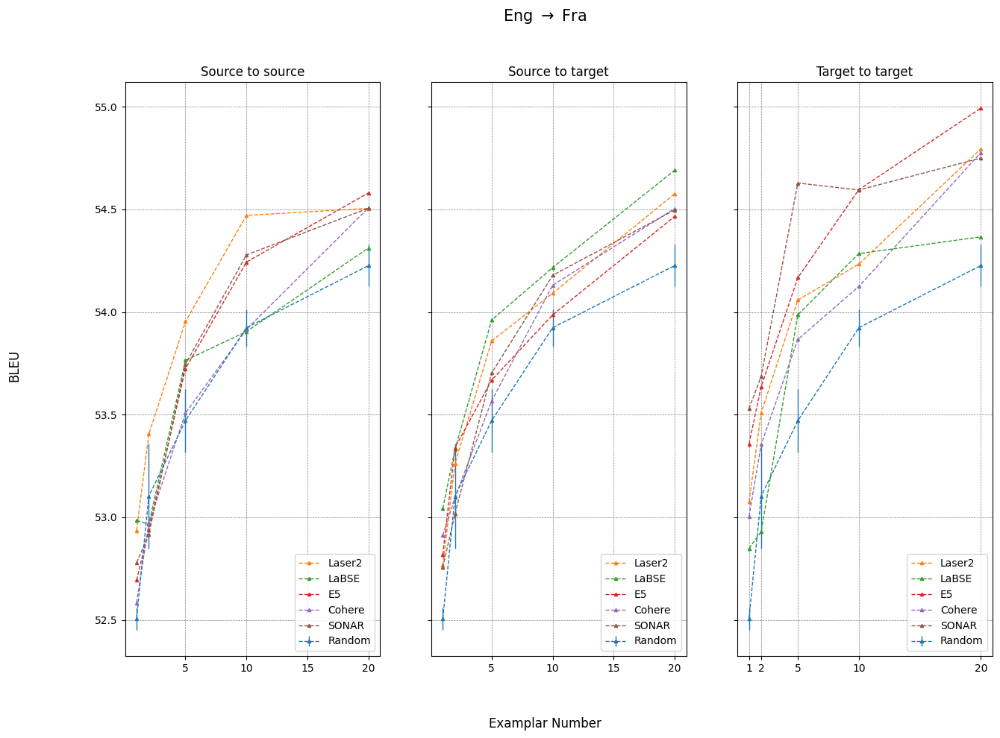

In [21]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"]
)

In [ ]:
get_plots(
    direction,
    d_comet_1,
    "COMET",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = False
)

### Miscellaneous

In [ ]:
get_plots(
    direction, 
    d_out_1,
    "Number of translation in the right target language",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
d_bleu_pool_1, d_chrf_pool_1 = get_scores(
    direction = direction,
    data_dir = "./ablations/scaling/nllb",
    methods = ["E5", "LaBSE", "Random"]
)

In [ ]:
d_1 = {}
for key in d_bleu_pool_1 :
    if key not in d_bleu_1 :
        continue
    d_1[f"{key}_pool"] = d_bleu_pool_1[key]
    d_1[key] = d_bleu_1[key]

In [ ]:
get_comparison_plots(
    direction = "Eng_to_Fr",
    dico = d_1,
    methods = [element for element in list(d_1.keys()) if element.startswith("LaBSE") or element.startswith("Random")],
    metric = "BLEU",
    K = [1, 2, 5, 10, 20],
    with_zero_shot = False,
    family_1 = "pool"
)

### Ngram

In [18]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-70b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-70b/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-70b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-70b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/llama-2-70b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [19]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [52.7705376165687, 53.19151789079704, 53.510275016383815, 54.231906768369974, 54.521862826147284]
BLEU: [52.4976652919353, 53.03536623673629, 53.80054174855298, 54.0379139507046, 54.204412638198384]
BLEU_pos: [52.60156985714096, 53.223962506472176, 53.67637748079414, 54.18352140339904, 54.34073387756272]
Rouge: [52.16882101002728, 53.05225476573776, 53.511961150334685, 53.524991277457815, 54.19132269389631]
Pos: [52.48112948891415, 53.12052550803365, 53.74386208999072, 54.11075898290195, 54.62876869586149]
Grakel: [52.646343752924984, 53.62387034469658, 54.088840400021326, 54.418519244742676, 54.74845046889373]
SONAR: [52.77916637068584, 52.91675261850387, 53.745263065004465, 54.278011699317254, 54.50608236342215]


## English to German

### Regular

In [20]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction, 
        data_dir="./generations/llama-2-70b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-70b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/llama-2-70b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-70b/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [23]:
d_out_2 = get_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"],
    lid = True
)

In [24]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

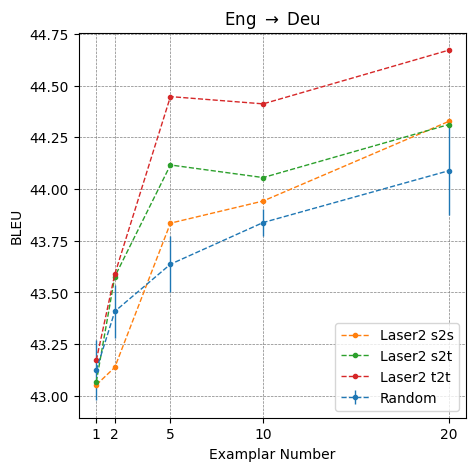

In [25]:
get_plot(
    direction, 
    d_bleu_2, 
    method_of_interest="Laser2", 
    metric="BLEU"
)

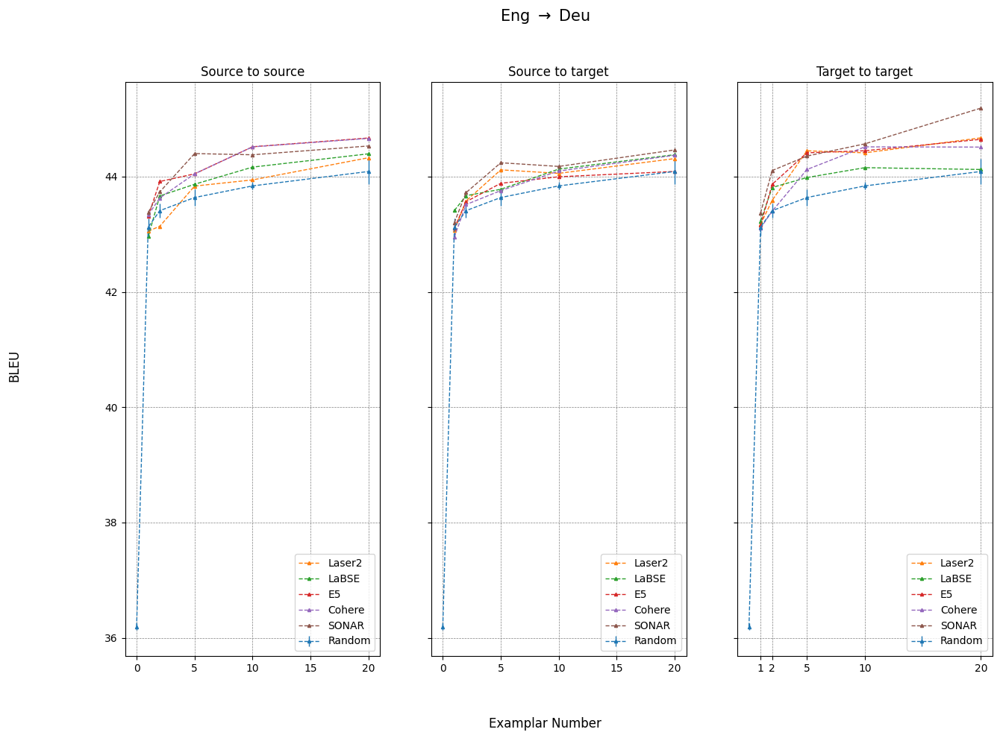

In [27]:
get_plots(
    direction, 
    d_bleu_2, 
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2, 
    "COMET", 
    [1, 2, 5, 10, 20],
    methods=["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

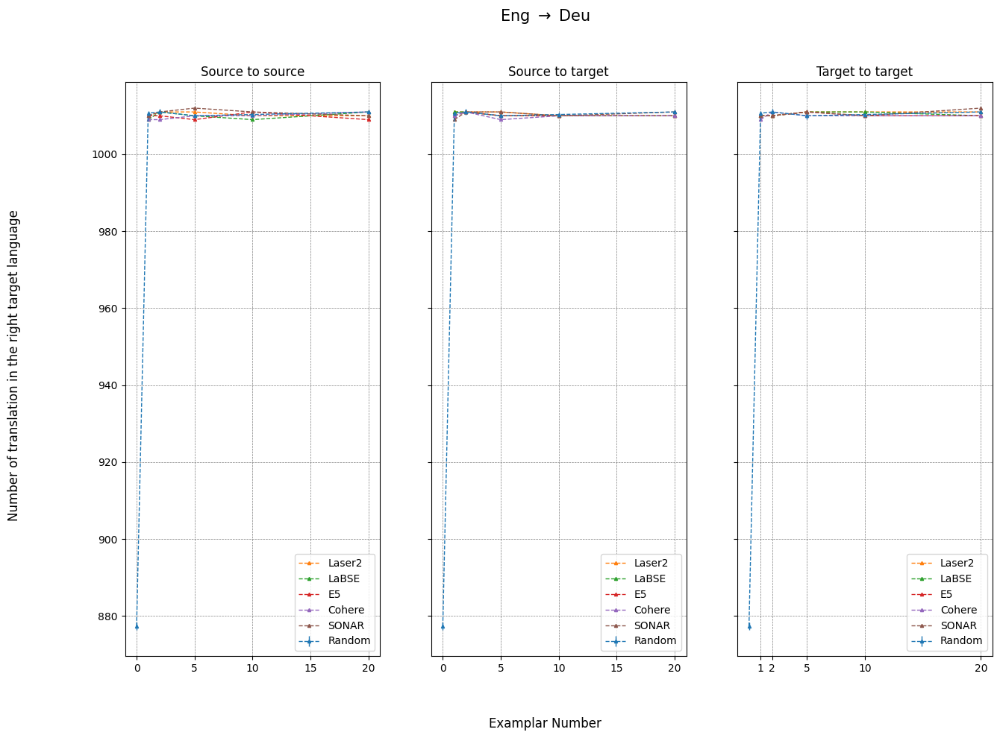

In [28]:
get_plots(
    direction, 
    d_out_2, 
    "Number of translation in the right target language", 
    [1, 2, 5, 10, 20], 
    methods=["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

### Ngram

In [21]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-70b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-70b/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-70b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-70b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/llama-2-70b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [22]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [42.944217766002545, 43.55891938689677, 43.63567555956181, 44.011232720425795, 44.175657942111606]
BLEU: [42.836119898575696, 43.39702304168327, 43.7378458760153, 44.1248877638587, 43.93681637180061]
BLEU_pos: [43.046135509039125, 43.490886247670105, 43.95979022902189, 44.05598612684031, 44.32732510691666]
Rouge: [43.34087021229236, 43.12446222150429, 43.78281599679668, 43.92820308273161, 43.85389740889472]
Pos: [43.11823870890252, 43.41574767818325, 43.65912561036785, 43.98892243260361, 44.19137384870469]
Grakel: [43.15071490782393, 43.86519054062441, 43.468003282402634, 43.648121839096575, 44.001821546411065]
SONAR: [43.37851869317532, 43.73397241839155, 44.398449891952495, 44.377710558827516, 44.53044556736642]


## English to Swahili

### Regular

In [48]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction, 
        data_dir="./generations/llama-2-70b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-70b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/llama-2-70b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [ ]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-70b/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_out_3 = get_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"],
    lid = True
)

In [30]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

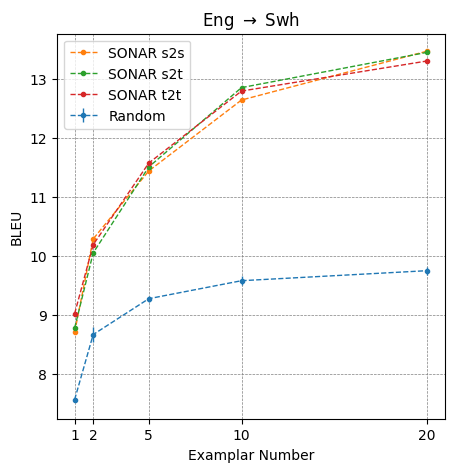

In [31]:
get_plot(
    direction, 
    d_bleu_3, 
    method_of_interest="SONAR", 
    metric="BLEU"
)

In [ ]:
get_plot(
    direction,
    d_comet_3, 
    method_of_interest="SONAR", 
    metric="COMET"
)

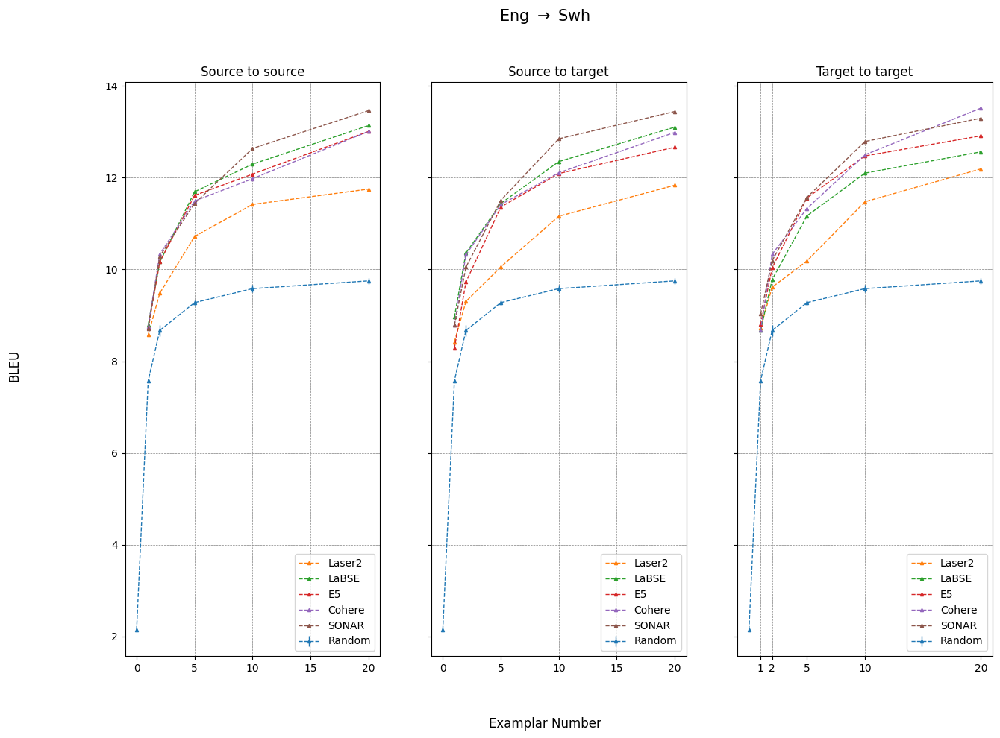

In [32]:
get_plots(
    direction,
    d_bleu_3,
    "BLEU",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction,
    d_comet_3,
    "COMET",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_out_3, 
    "Number of translation in the right target language", 
    [1, 2, 5, 10, 20], 
    methods=["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

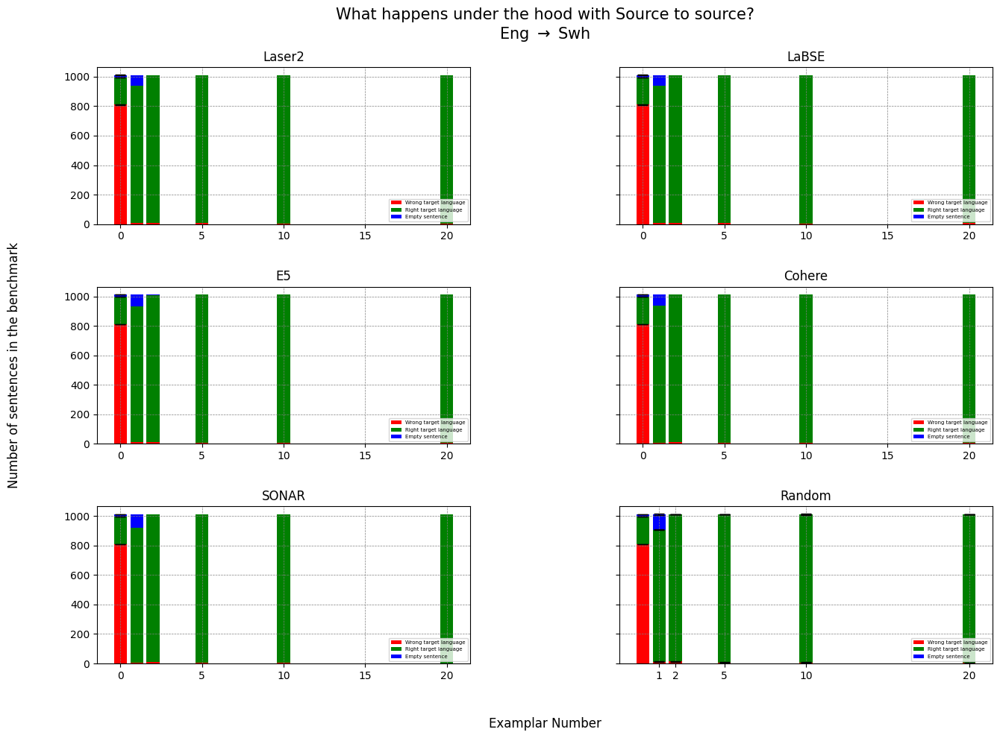

In [33]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

### Miscellaneous

In [ ]:
d_bleu_pool_3, d_chrf_pool_3 = get_scores(
    direction = direction,
    data_dir = "./ablations/scaling/nllb_en_to_sw",
    methods = ["E5", "LaBSE", "Random"]
)

In [ ]:
d_3 = {}
for key in d_bleu_pool_3 :
    if key not in d_bleu_3 :
        continue
    d_3[f"{key}_pool"] = d_bleu_pool_3[key]
    d_3[key] = d_bleu_3[key]

In [ ]:
get_comparison_plots(
    direction = direction,
    dico = d_3,
    methods = [element for element in list(d_3.keys()) if element.startswith("LaBSE") or element.startswith("Random")],
    metric = "BLEU",
    K = [1, 2, 5, 10, 20],
    with_zero_shot = False,
    family_1 = "pool"
)

### Ngram

In [49]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-70b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-70b/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-70b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-70b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/llama-2-70b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [50]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [8.56909388656253, 10.389501948760206, 11.99478472741735, 12.871328530613841, 13.486833918355542]
BLEU: [8.463689123469154, 10.117971693549281, 11.446298013732529, 11.866351885176652, 12.574642106972334]
BLEU_pos: [8.037854117395508, 8.943113671537967, 9.665632800766529, 9.968180609773366, 10.550925045769691]
Rouge: [8.303672361771497, 9.16523178153165, 10.29501730304527, 10.988894345201246, 11.716755942146278]
Pos: [8.188245159212453, 8.584833421860726, 9.573754939880342, 10.088673178450406, 10.47632326764275]
Grakel: [8.010299071587143, 8.528616666962067, 9.448798723346716, 9.711124923472573, 10.193169045433265]
SONAR: [8.710495104238706, 10.28781074156357, 11.437684025831544, 12.636105913653166, 13.461156020121813]


## English to Wolof

### Regular

In [29]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction, 
        data_dir="./generations/llama-2-70b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-70b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/llama-2-70b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    score = "COMET",
    data_dir = "./generations/llama-2-70b/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_out_4 = get_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"],
    lid = True
)

In [36]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-70b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

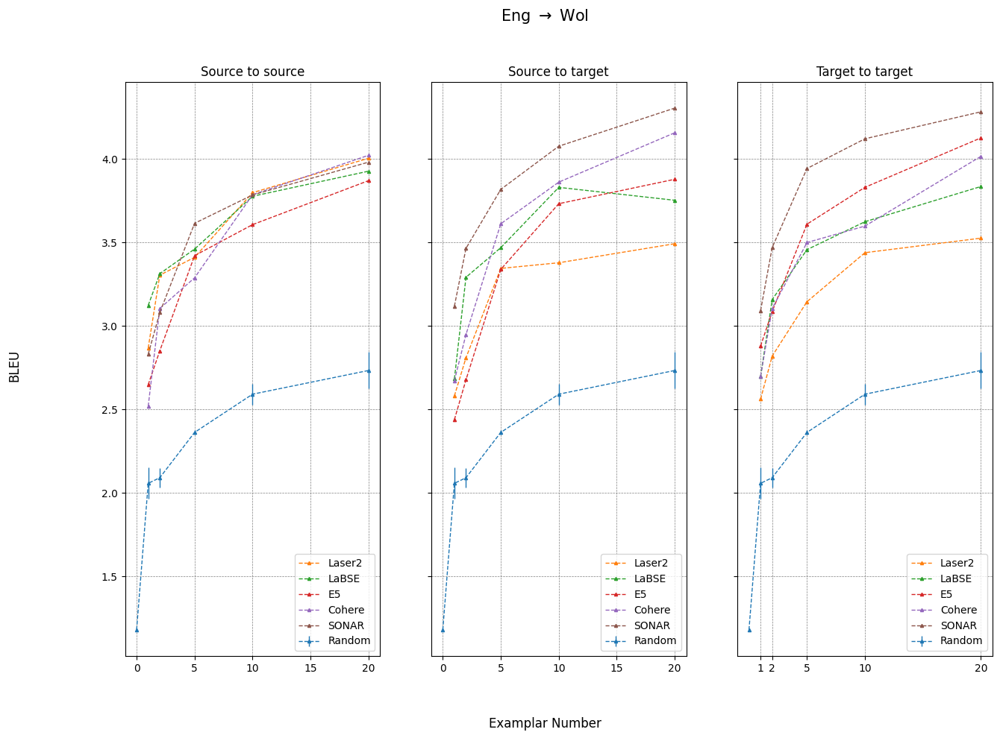

In [37]:
get_plots(
    direction, 
    d_bleu_4, 
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_comet_4, 
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_out_4, 
    "Number of translation in the right target language", 
    [1, 2, 5, 10, 20], 
    methods=["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot = True
)

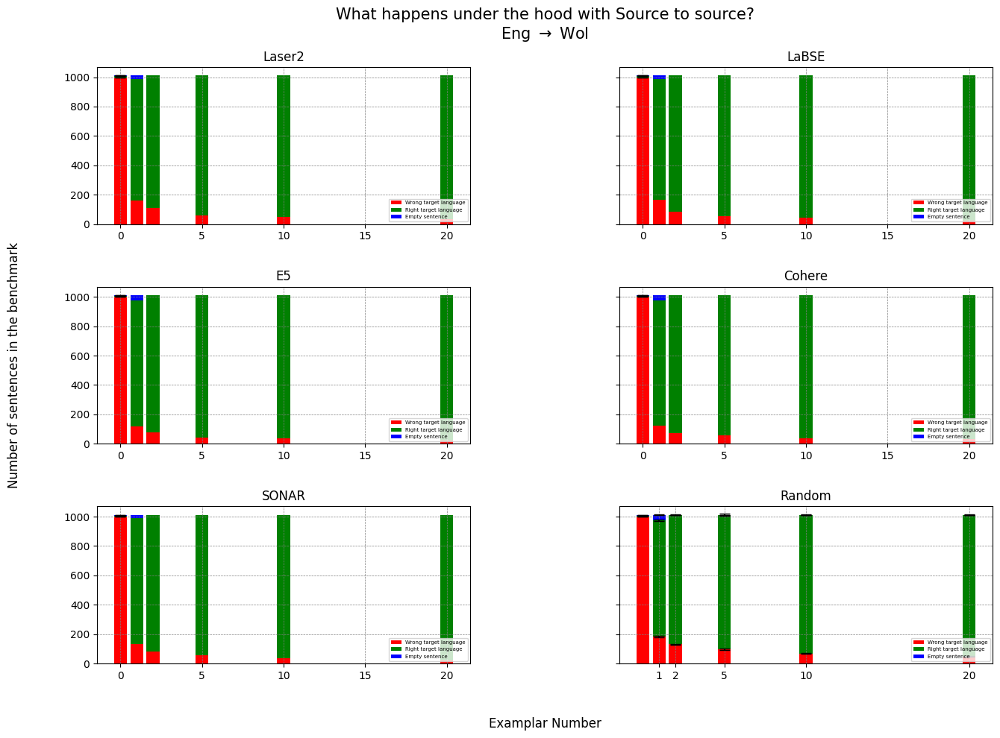

In [38]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

### Ngram

In [27]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-70b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-70b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-70b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-70b/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-70b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-70b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/llama-2-70b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [30]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [2.5854933851101625, 2.8394717275082053, 3.1131573342480325, 3.6786192754334675, 3.753434433517056]
BLEU: [2.529658495693457, 2.8236889107861334, 3.0299027799094103, 3.3920369797423056, 3.5889954550199956]
BLEU_pos: [2.277632606456734, 2.566091621633765, 2.8337371901428376, 2.936169468966606, 2.989355109243438]
Rouge: [2.2204770194995587, 2.3769601300407857, 2.820964249462992, 3.1291318871672225, 3.443709311597961]
Pos: [2.3582205061695056, 2.6883804988529874, 2.795502942370916, 2.9596709800425605, 3.1867168786631637]
Grakel: [2.034243969693732, 2.157045198279748, 2.3523033602797576, 2.539003606224443, 2.781913726630102]
SONAR: [2.83100794722752, 3.0809715007801226, 3.61543145940292, 3.7854694216093727, 3.9818860701826972]


## BLEU Ranking (Win - rate)

In [66]:
dico = {}
dir2dico = {
    "Eng_to_Fr" : d_bleu_1,
    "Eng_to_Deu" : d_bleu_2,
    "Eng_to_Swh" : d_bleu_3,
    "Eng_to_Wol" : d_bleu_4,
}
methods = [
    "Laser2",
    "LaBSE",
    "SONAR",
    "Cohere",
    "E5",
    "Random"
]
strategies = ["s2s", "s2t"]
directions = list(dir2dico.keys())
for method in methods:
    if "Random" not in method :
        for strategy in strategies:
            key = f"{method}_{strategy}"
            dico[key] = {direction : [] for direction in directions}
            for direction in directions:
                for k in [1, 2, 5, 10, 20] :
                    dico[key][direction].append(
                        (
                            k,
                            dir2dico[direction][method][strategy][k]
                        )
                    )
    else :
        key = f"{method}_s2s"
        dico[key] = {direction : [] for direction in directions}
        for direction in directions:
            for k in [1, 2, 5, 10, 20] :
                dico[key][direction].append(
                    (
                        k,
                        dir2dico[direction][method]["s2s"][k]["mean"]
                    )
                )

In [67]:
mean_scores = {}
directions_to_ignore = []
for method in dico :
    mean_scores[method] = {}
    for direction in dico[method] :
        if direction in directions_to_ignore :
            continue
        L = [v for (k, v) in dico[method][direction] if k != 0]  
        mean_scores[method][direction] = np.mean(L)

In [68]:
dico_win_rate = {key : [] for key in mean_scores}
for direction in mean_scores["SONAR_s2s"] :
    R = []
    for method in mean_scores:
        R.append((method, mean_scores[method][direction]))
    R = sorted(R, key = lambda x : x[1])
    for i, element in enumerate(R):
        number_of_wins = i
        name = element[0]
        dico_win_rate[name].append(i/((len(R) - 1)))

In [69]:
from scipy.stats import gmean
for k in dico_win_rate :
    #dico_win_rate[k] = gmean(dico_win_rate[k])
    dico_win_rate[k] = np.mean(dico_win_rate[k])

results = sorted([(k, v) for (k, v) in dico_win_rate.items()], key = lambda x : x[1])
for i, result in enumerate(results[::-1]):
    print(f"{i+1}. {result[0]} -> {result[1]}")

1. SONAR_s2s -> 0.7749999999999999
2. SONAR_s2t -> 0.75
3. LaBSE_s2t -> 0.7
4. LaBSE_s2s -> 0.55
5. E5_s2s -> 0.5499999999999999
6. Laser2_s2s -> 0.525
7. Cohere_s2t -> 0.5
8. Cohere_s2s -> 0.42500000000000004
9. Laser2_s2t -> 0.37500000000000006
10. E5_s2t -> 0.35
11. Random_s2s -> 0.0


## COMET Ranking (Win - rate)

In [ ]:
dico = {}
dir2dico = {
    "Eng_to_Fr" : d_comet_1,
    "Eng_to_Deu" : d_comet_2,
    "Eng_to_Swh" : d_comet_3,
    "Eng_to_Wol" : d_comet_4,
}
methods = [
    "Laser2",
    "LaBSE",
    "SONAR",
    "Cohere",
    "E5",
    "Random"
]
strategies = ["s2s", "s2t", "t2t"]
directions = list(dir2dico.keys())
for method in methods:
    if "Random" not in method :
        for strategy in strategies:
            key = f"{method}_{strategy}"
            dico[key] = {direction : [] for direction in directions}
            for direction in directions:
                for k in [1, 2, 5, 10, 20] :
                    dico[key][direction].append(
                        (
                            k,
                            dir2dico[direction][method][strategy][k]
                        )
                    )
    else :
        key = f"{method}_s2s"
        dico[key] = {direction : [] for direction in directions}
        for direction in directions:
            for k in [1, 2, 5, 10, 20] :
                dico[key][direction].append(
                    (
                        k,
                        dir2dico[direction][method]["s2s"][k]["mean"]
                    )
                )

In [ ]:
mean_scores = {}
directions_to_ignore = []
for method in dico :
    mean_scores[method] = {}
    for direction in dico[method] :
        if direction in directions_to_ignore :
            continue
        L = [v for (k, v) in dico[method][direction] if k != 0]  
        mean_scores[method][direction] = np.mean(L)

In [ ]:
dico_win_rate = {key : [] for key in mean_scores}
for direction in mean_scores["SONAR_s2s"] :
    R = []
    for method in mean_scores:
        R.append((method, mean_scores[method][direction]))
    R = sorted(R, key = lambda x : x[1])
    for i, element in enumerate(R):
        number_of_wins = i
        name = element[0]
        dico_win_rate[name].append(i/((len(R) - 1)))

In [ ]:
for k in dico_win_rate :
    #dico_win_rate[k] = gmean(dico_win_rate[k])
    dico_win_rate[k] = np.mean(dico_win_rate[k])

results = sorted([(k, v) for (k, v) in dico_win_rate.items()], key = lambda x : x[1])
for i, result in enumerate(results[::-1]):
    print(f"{i+1}. {result[0]} -> {result[1]}")

### Miscellaneous

In [ ]:
"""
import matplotlib.pyplot as plt
# Number of categories
categories = list(dico_new["SONAR_s2s"].keys())
num_categories = len(categories)
# Set the angle for each category
angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()
angles += angles[:1]

# Create a single set of axes
fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(8, 8))
ax.set_yticks(np.arange(0, 50, 2), np.arange(0, 50, 2), color="black", size=10)
for i, key in  enumerate(dico_new) :
    if not key.endswith("s2s") or key.startswith("BLOOM"):
        continue
    # Repeat the first category to close the circle
    values = list(dico_new[key].values())
    values += values[:1]
    # Plot the radar chart
    #fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'{key}')

    # Set labels for each category
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)
    # Set the title of the plot
    ax.set_title("BLEU", size=20, color="b", y=1.1)

    # Add a legend
    ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

plt.show()
"""

# Mixtral

## English to French

### Regular

In [20]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [ ]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [16]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

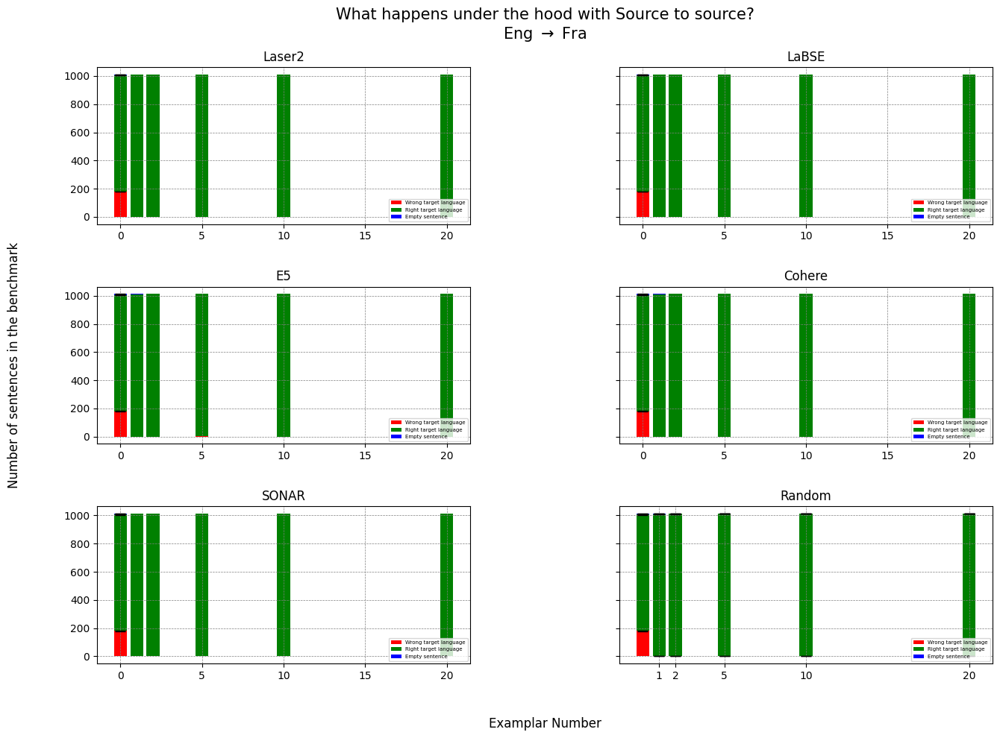

In [17]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

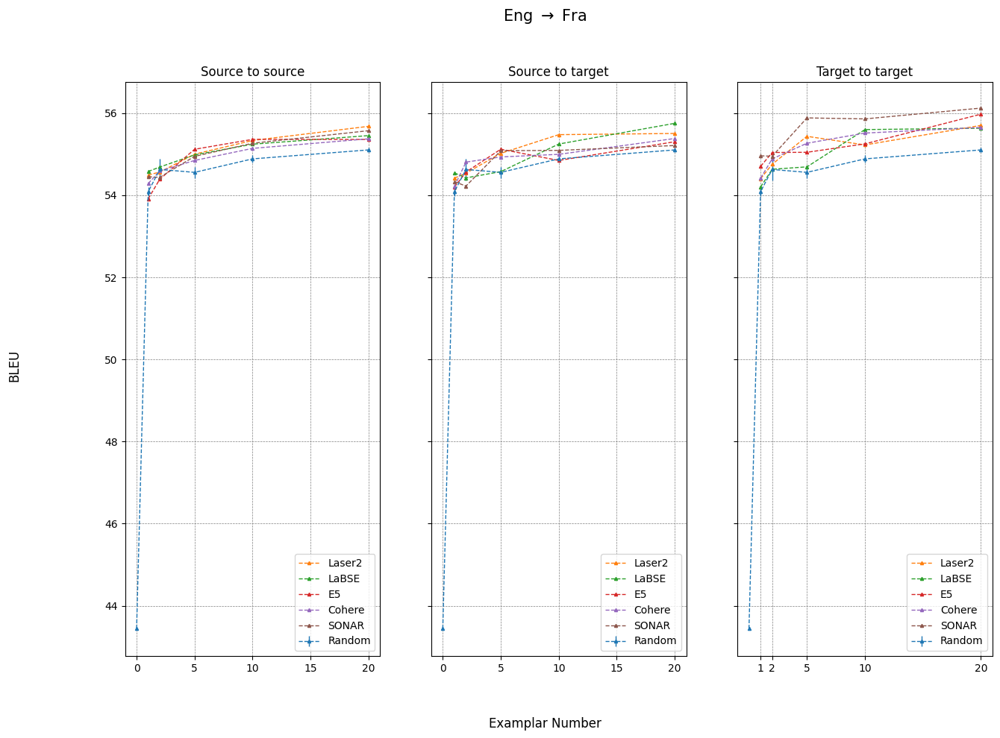

In [18]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [21]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mixtral/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mixtral/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/mixtral/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mixtral/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/mixtral/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [22]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [53.893015357900005, 54.40799486543398, 54.57814260262925, 54.597339020637044, 55.05871296181805]
BLEU: [53.71399412729755, 54.3618254487206, 54.943640687631515, 54.82476501054994, 54.9682225739698]
BLEU_pos: [54.2166769696467, 54.438395142139, 54.637343043885245, 55.12379342035485, 55.228599929867066]
Rouge: [53.718430635446204, 54.304944301942385, 54.56278973464328, 54.57032119939751, 54.84455767524207]
Pos: [54.14926919602242, 54.59228263367988, 54.689677358269044, 55.1067216095077, 55.262324491308014]
Grakel: [54.21517346314368, 54.96671492278085, 55.275012455054686, 55.26927296068578, 55.80478377661425]
SONAR: [54.45031531360178, 54.43792283525705, 54.948411564222496, 55.2682212809707, 55.57369830124697]


## English to German

### Regular

In [23]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [20]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

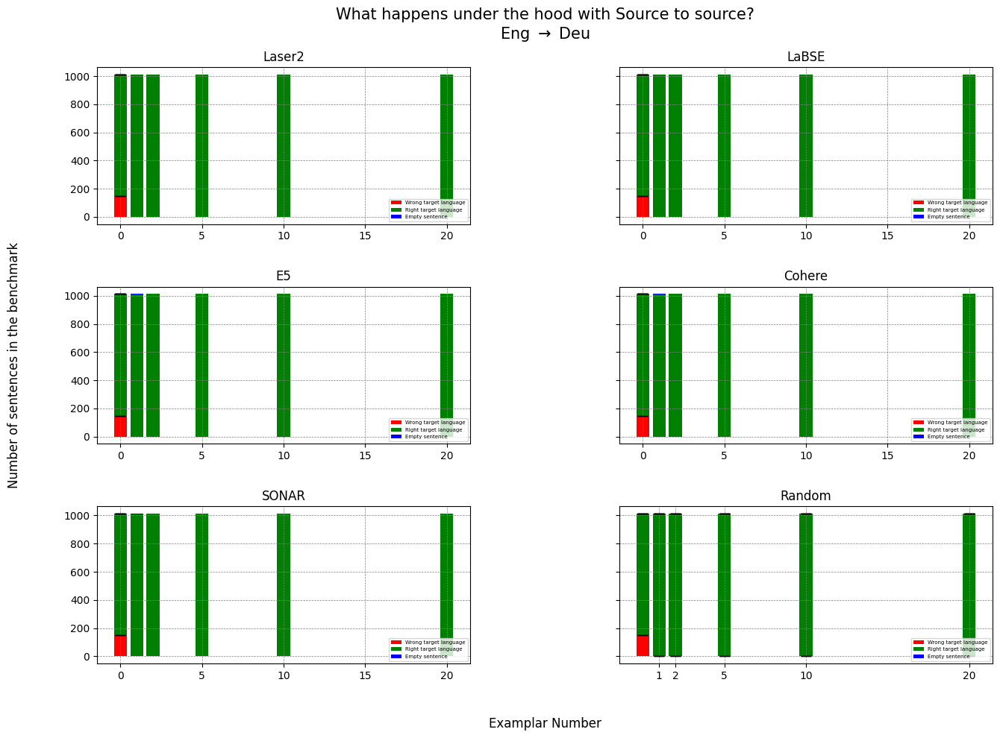

In [21]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

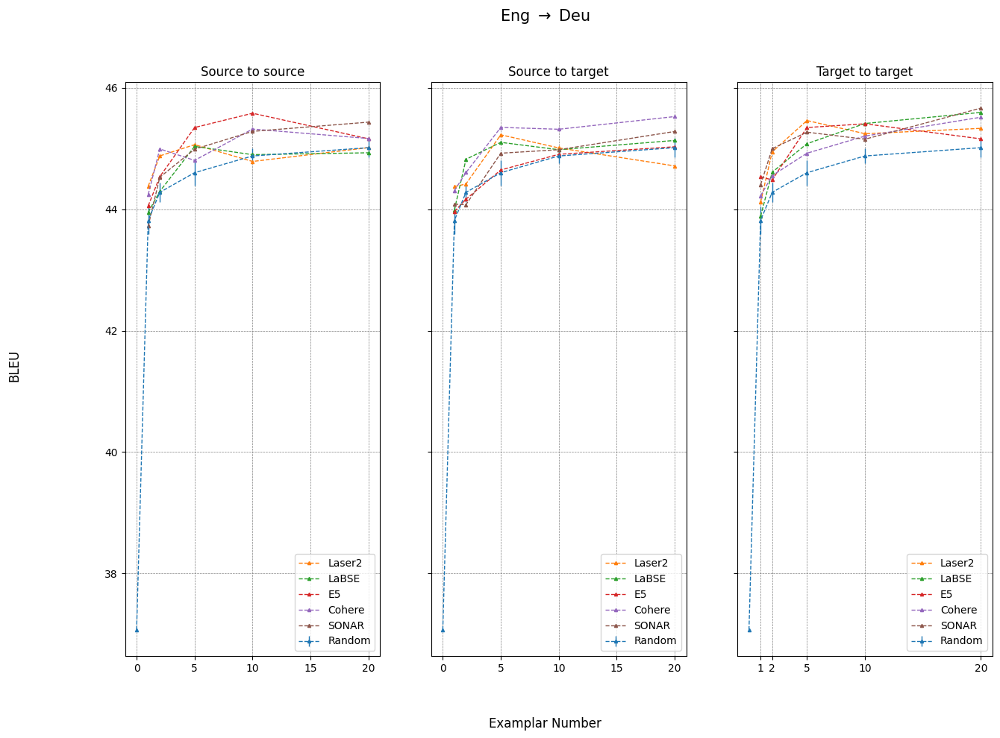

In [22]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [24]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mixtral/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mixtral/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/mixtral/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mixtral/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/mixtral/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [25]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [43.98425575664902, 44.17063134303566, 44.65313455334849, 44.93990341564592, 45.24763166408094]
BLEU: [43.9864539040493, 44.25039045661091, 44.62150378390183, 44.45008165279736, 45.04553180230682]
BLEU_pos: [43.912661357470164, 44.67009554377551, 44.66786099022698, 45.06251990567498, 45.11381029401694]
Rouge: [44.049502877380554, 44.79544542876366, 45.231014054436436, 44.96418929008728, 44.819959586267785]
Pos: [44.09397404061835, 44.44044865491724, 44.7169011278636, 44.97918665712288, 45.16253600419051]
Grakel: [43.89974039982005, 44.40533294898268, 44.992703688258956, 44.8943547114653, 45.20400661813202]
SONAR: [43.7222602098528, 44.527520304159246, 44.989311709591014, 45.28310603144157, 45.43542928838637]


## English to Swahili

### Regular

In [21]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [22]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [23]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

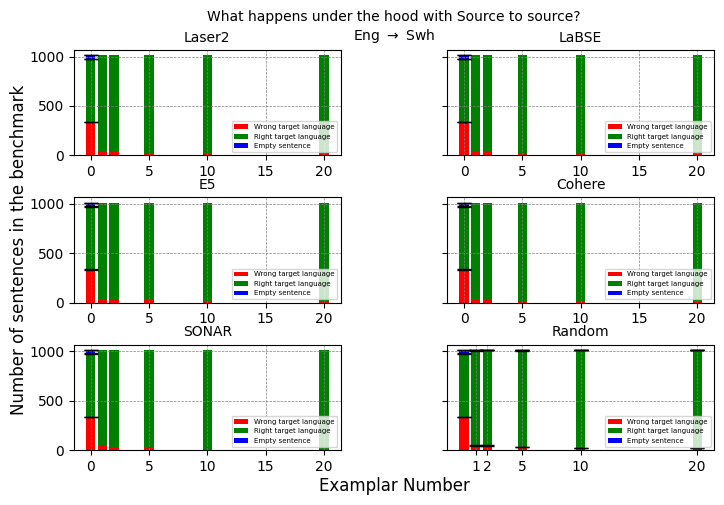

In [24]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

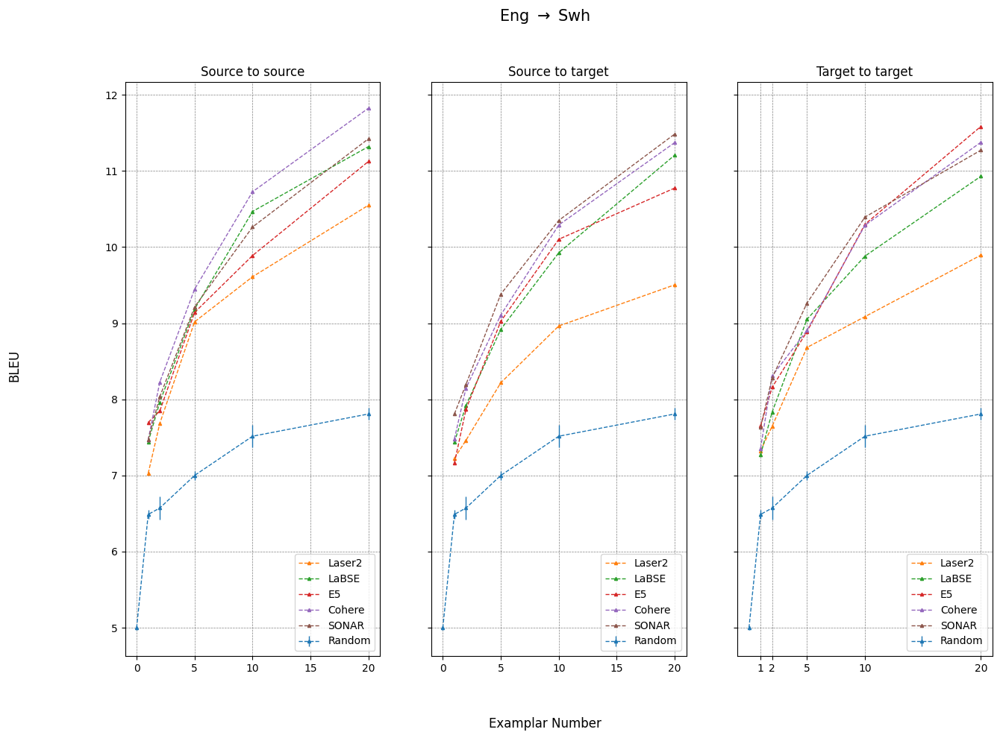

In [27]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [26]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mixtral/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mixtral/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/mixtral/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mixtral/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/mixtral/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [29]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [7.593653746167767, 8.004333993854505, 9.70475145501596, 10.650964442098006, 12.1797897351325]
BLEU: [7.391677467022823, 7.854586636509523, 9.209576781062522, 9.883426269844064, 10.755208880820206]
BLEU_pos: [6.816440809621559, 7.227303216150258, 7.647355987062925, 8.010182354662929, 8.655380712547737]
Rouge: [6.987544543409595, 7.504055636914021, 8.436878663406041, 8.958169497888658, 9.839997923561782]
Pos: [6.7472988372907405, 7.1098230608313795, 7.545738093137331, 8.142898906041086, 8.755648835575501]
Grakel: [6.306194926445654, 6.509393670171796, 7.407355458157853, 8.031437656454289, 8.14576962673286]
SONAR: [7.470911653383855, 8.034550174729803, 9.213860003669861, 10.26356745141744, 11.422648756486494]


## English to Wolof

### Regular

In [17]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [18]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [19]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

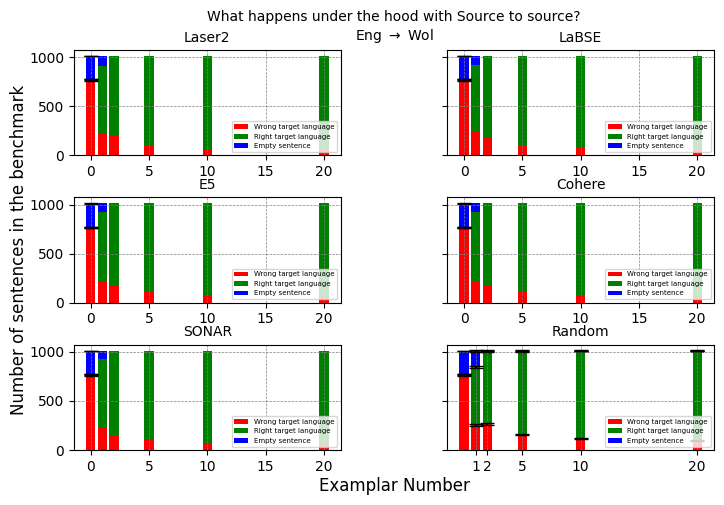

In [20]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

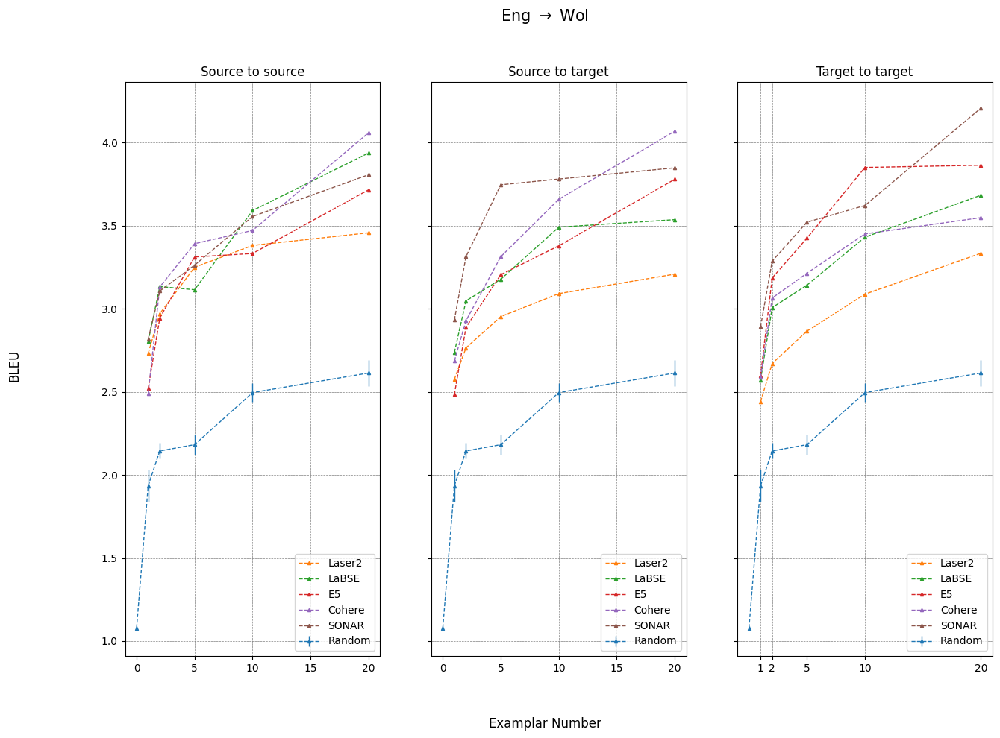

In [31]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [30]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mixtral/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mixtral/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/mixtral/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mixtral/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/mixtral/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [32]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [2.2861211189546387, 2.8079629582767938, 3.168748587365912, 3.3593835651641415, 3.766103377611571]
BLEU: [2.2265476020114376, 2.79207191301387, 2.8899223278424864, 3.2665179556168593, 3.4368183648133326]
BLEU_pos: [2.177730282637345, 2.3564725886393587, 2.610090835749024, 2.9220523898957658, 3.058838034397306]
Rouge: [2.089043514047195, 2.5185095846996384, 2.953276467375596, 3.1574521431480904, 3.4910277290294043]
Pos: [2.34570791420741, 2.3426713610578185, 2.7226348006523806, 2.895057719487039, 3.206567915352699]
Grakel: [2.0490528510479136, 2.1018901612384338, 2.332034485104754, 2.6440193293267833, 2.7421232294542075]
SONAR: [2.8178563671835186, 3.1068275333970425, 3.2627932420763632, 3.555937200228047, 3.80712279376476]


In [ ]:
d_f_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral/ngram",
    methods = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"]
)

## French to English

In [ ]:
direction = "Fr_to_Eng"
try :
    d_bleu_5 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]#+["BLOOM_one", "BLOOM_middle", "BLOOM_last"]+["BLOOM_one_avg", "BLOOM_middle_avg", "BLOOM_last_avg"]
    )
    d_chrf_5 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]#+["BLOOM_one", "BLOOM_middle", "BLOOM_last"]+["BLOOM_one_avg", "BLOOM_middle_avg", "BLOOM_last_avg"]
    )
except :
    d_bleu_5, d_chrf_5 = get_scores(
        direction,
        data_dir="Mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_5, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_5, fout)

In [ ]:
d_comet_5 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores_la/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_5 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_5,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_5,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_5,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## German to English

In [ ]:
direction = "Deu_to_Eng"
try :
    d_bleu_6 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_6 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_6, d_chrf_6 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_6, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_6, fout)

In [ ]:
d_comet_6 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_6 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_6,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_6,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_6,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Swahili to English

In [ ]:
direction = "Swh_to_Eng"
try :
    d_bleu_7 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_7 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_7, d_chrf_7 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_7, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_7, fout)

In [ ]:
d_comet_7 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_7 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_7,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_7,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_7,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Wolof to English

In [ ]:
direction = "Wol_to_Eng"
try :
    d_bleu_8 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mixtral/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_8 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mixtral/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_8, d_chrf_8 = get_scores(
        direction,
        data_dir="./generations/mixtral",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mixtral/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_8, fout)
    with open(f"./generations/mixtral/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_8, fout)

In [ ]:
d_comet_8 = load_scores(
    direction = direction,
    data_dir = "./generations/mixtral/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_8 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mixtral",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_8,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_8,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_8,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Ranking

In [ ]:
dico = {}
dir2dico = {
    "Eng_to_Fr" : d_bleu_1,
    "Eng_to_Deu" : d_bleu_2,
    "Eng_to_Swh" : d_bleu_3,
    "Eng_to_Wol" : d_bleu_4,
    "Fr_to_Eng" : d_bleu_5,
    "Deu_to_Eng" : d_bleu_6,
    "Swh_to_Eng" : d_bleu_7,
    "Wol_to_Eng" : d_bleu_8
}
methods = [
    "Laser2",
    "LaBSE",
    "SONAR",
    "Cohere",
    "E5",
    "Random",
    #"BLOOM_one",
    #"BLOOM_middle",
    #"BLOOM_last",
    #"BLOOM_one_avg",
    #"BLOOM_middle_avg",
    #"BLOOM_last_avg"
]
strategies = ["s2s", "s2t", "t2t"]
directions = list(dir2dico.keys())
for method in methods:
    if "Random" not in method :
        for strategy in strategies:
            key = f"{method}_{strategy}"
            dico[key] = {direction : [] for direction in directions}
            for direction in directions:
                for k in [1, 2, 5, 10, 20] :
                    dico[key][direction].append(
                        (
                            k,
                            dir2dico[direction][method][strategy][k]
                        )
                    )
    else :
        key = f"{method}_s2s"
        dico[key] = {direction : [] for direction in directions}
        for direction in directions:
            for k in [1, 2, 5, 10, 20] :
                dico[key][direction].append(
                    (
                        k,
                        dir2dico[direction][method]["s2s"][k]["mean"]
                    )
                )

In [ ]:
mean_scores = {}
#directions_to_ignore = []
#directions_to_ignore = ["Eng_to_Deu", "Deu_to_Eng"]
#directions_to_ignore = ["Deu_to_Eng", "Fr_to_Eng", "Wol_to_Eng", "Swh_to_Eng"]
directions_to_ignore = [ "Eng_to_Deu", "Eng_to_Fr", "Eng_to_Wol", "Eng_to_Swh"]
for method in dico :
    mean_scores[method] = {}
    for direction in dico[method] :
        if direction in directions_to_ignore :
            continue
        L = [v for (k, v) in dico[method][direction] if k != 0]  
        mean_scores[method][direction] = np.mean(L)

In [ ]:
dico_win_rate = {key : [] for key in mean_scores}
for direction in mean_scores["SONAR_s2s"] :
    R = []
    for method in mean_scores:
        R.append((method, mean_scores[method][direction]))
    R = sorted(R, key = lambda x : x[1])
    for i, element in enumerate(R):
        number_of_wins = i
        name = element[0]
        dico_win_rate[name].append(i/((len(R) - 1)))

In [ ]:
from scipy.stats import gmean
for k in dico_win_rate :
    #dico_win_rate[k] = gmean(dico_win_rate[k])
    dico_win_rate[k] = np.mean(dico_win_rate[k])

results = sorted([(k, v) for (k, v) in dico_win_rate.items()], key = lambda x : x[1])
for i, result in enumerate(results[::-1]):
    print(f"{i+1}. {result[0]} -> {result[1]}")

# BLOOM

In [14]:
ABLATIONS = ["BLOOM_one", "BLOOM_one_avg", "BLOOM_middle", "BLOOM_middle_avg", "BLOOM_last", "BLOOM_last_avg"]

## English to French

### Regular

In [61]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

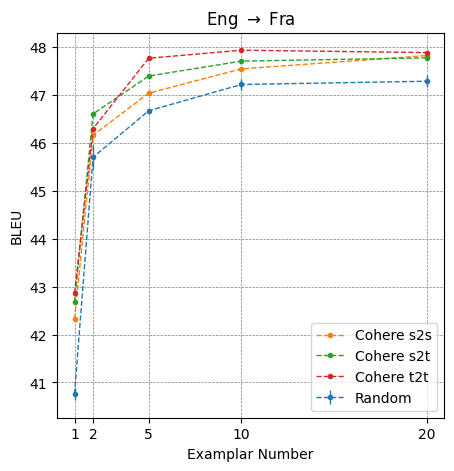

In [16]:
get_plot(
    direction,
    d_bleu_1,
    method_of_interest="Cohere",
    metric="BLEU"
)

In [18]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
d_bleu_1["Random"]

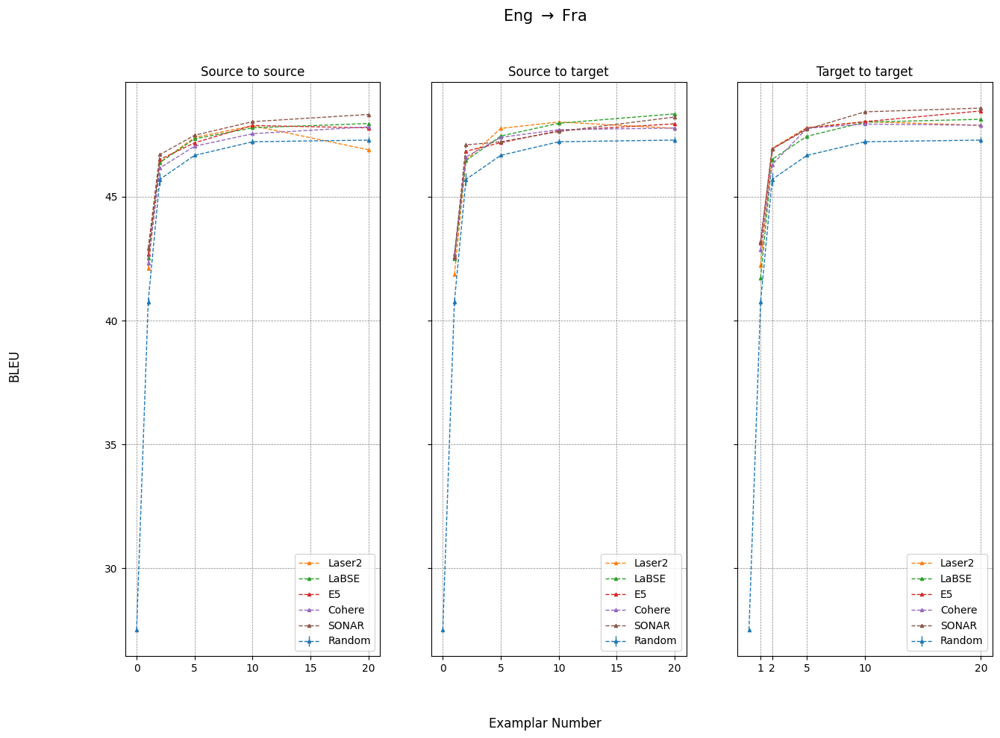

In [19]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

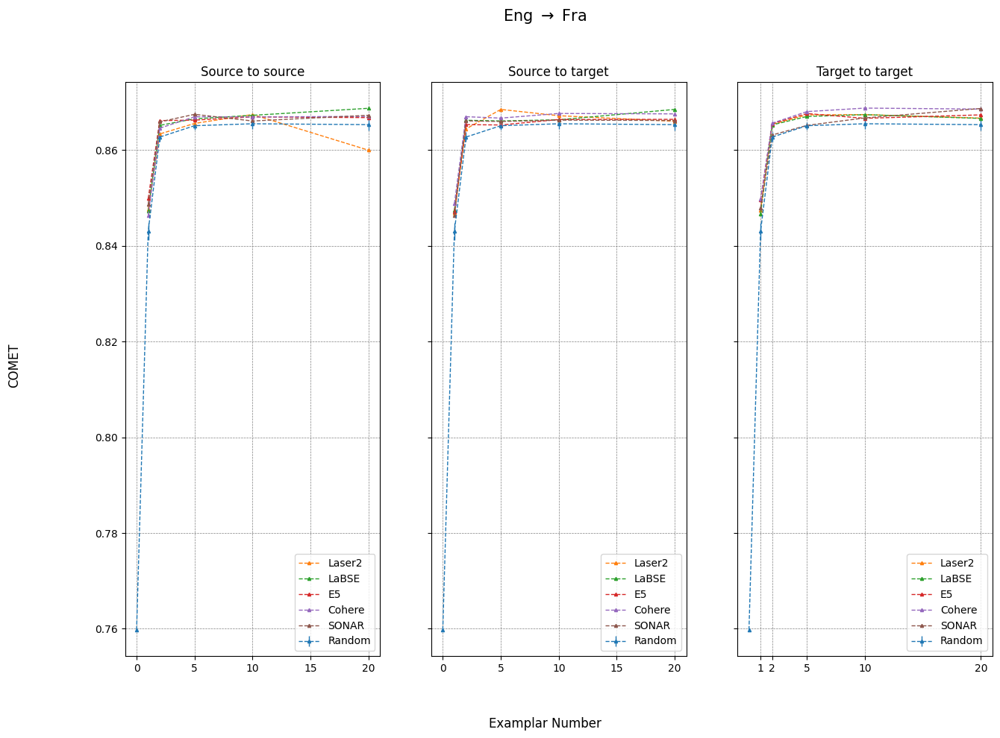

In [20]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [ ]:
direction = "Eng_to_Fra"
try :
    d_b_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_1, d_c_1 = get_scores(
        direction,
        data_dir="./generations/bloom/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/bloom/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_1, fout)
    with open(f"./generations/bloom/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_1, fout)

In [ ]:
d_b_1["Random"] = d_bleu_1["Random"]
d_c_1["Random"] = d_chrf_1["Random"]

In [ ]:
d_f_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_1["Random"] = d_full_1["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_1,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
d_b_1["Random"]

In [ ]:
get_plots(
    direction, 
    d_b_1,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_1, **d_bleu_1},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### ngram

In [19]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/bloom/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/bloom/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/bloom/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/bloom/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/bloom/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

In [22]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [41.14541450531695, 46.1006987587303, 47.71611210741387, 48.0841564688825, 48.43080010312129]
BLEU: [41.54997048646051, 46.673022154983116, 47.374881751471975, 47.6399957344371, 47.91145759662476]
BLEU_pos: [42.04093536605925, 46.13690639535193, 47.28521252862081, 47.69754858551425, 47.863199453152674]
Rouge: [42.015014068447094, 45.710910729380416, 46.70982671461803, 47.40224416474116, 47.61438467644889]
Pos: [41.62292417986917, 46.47555769598407, 47.468291643395276, 47.68540384747404, 44.06221118280178]
Grakel: [38.89091091793801, 46.33468676455937, 47.360943494860415, 47.757862717421574, 0.6344823452578913]
SONAR: [42.92159224727848, 46.70051596490276, 47.48513417991249, 48.03486956502029, 48.325608041347415]


### Scaling

In [62]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [63]:
direction = "Eng_to_Fra"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/bloom/scaling/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [64]:
L2 = []
for size in S :
    d = load_scores(
        direction = direction,
        score = "COMET",
        data_dir=f"./generations/bloom/scaling/{size}/comet_la_scores",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L2.append(d)

In [65]:
K = [1, 5, 10]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
full2 = {k : {} for k in K}
for k in K :
    for i, d in enumerate(L) :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
                full2[k][method].append(L2[i][method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]
                full2[k][method] = [L2[i][method]["s2s"][k]]

In [66]:
dico, metric = full2, "COMET"
#dico, metric = full, "BLEU"

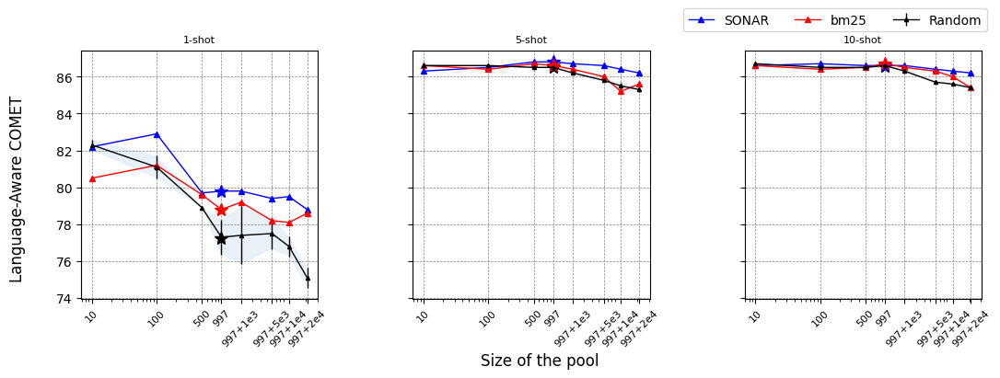

In [68]:
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["blue", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    #sharex=True,
    figsize=(12, 4)
)


plt.subplots_adjust(
    left=0.085,
    bottom=0.2, 
    #right=0.9, 
    top=0.875, 
    wspace=0.4, 
    #hspace=0.4
)

#f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supxlabel("Size of the pool")
#f.supylabel(f"{metric}")
f.supylabel(f"Language-Aware COMET")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    random_mean = [round(100*v, 1) for v in random_mean]
    random_std = [round(100*v, 2) for v in random_std]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        #[dico[k]["Random"][3]['mean']],
        [round(100*dico[k]["Random"][3]['mean'], 2)],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            #dico[k][method_of_interest],
            [round(100*v, 1) for v in dico[k][method_of_interest]],
            linewidth=1.0, 
            marker="^",
            label=method_of_interest,
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            #[dico[k][method_of_interest][3]],
            [round(100*dico[k][method_of_interest][3], 1)],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"{k}-shot", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    #ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    """
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        fontsize=8
        #rotation = 90
    )
    """
    ax[i].set_xticks(S)
    ax[i].set_xticklabels(
        [10, 100, 500, 997, "997+1e3", "997+5e3", "997+1e4", "997+2e4"],
        fontsize=8,
        rotation=45
    )

lines, labels = ax[0].get_legend_handles_labels()
plt.legend(handles=lines, labels=labels, bbox_to_anchor=[1.05, 1.195], ncol=len(K))

#f.suptitle(f"Robustness of $ES3$\n{source} $\\rightarrow$ {target}", fontsize=10)
#f.suptitle(f"English $\\rightarrow$ French", fontsize=10)
plt.savefig("robustness_lacomet_fra.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [40]:
random_mean

[0.8665021578627927,
 0.8654225423578689,
 0.8648674472656017,
 0.8655267483278698,
 0.8629042417380335,
 0.8571004473232469,
 0.8564599521546495,
 0.8538741830721674]

## English to German

### Regular

In [23]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
print_dico(d_bleu_2)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [ ]:
direction = "Eng_to_Deu"
try :
    d_b_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_2, d_c_2 = get_scores(
        direction,
        data_dir="./generations/bloom/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/bloom/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_2, fout)
    with open(f"./generations/bloom/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_2, fout)

In [ ]:
d_b_2["Random"] = d_bleu_2["Random"]
d_c_2["Random"] = d_chrf_2["Random"]

In [ ]:
d_f_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_2["Random"] = d_full_2["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_2,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_b_2,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_2, **d_bleu_2},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### ngram

In [24]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/bloom/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/bloom/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/bloom/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/bloom/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/bloom/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

In [25]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_2['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [12.58811324621288, 14.15085403257554, 15.102174465514128, 15.246818550351643, 15.832873426703067]
BLEU: [12.365060931160922, 14.135179797570494, 14.834458922797362, 15.34638538021966, 14.939573243631896]
BLEU_pos: [12.443412594752951, 13.695732113928548, 14.370383130050604, 14.63628849956046, 12.519023432259525]
Rouge: [12.398432714410493, 13.901675609132118, 14.321407595794666, 14.853650506247735, 14.900990632149732]
Pos: [12.588119474434725, 13.73546647870797, 14.555333556032092, 14.505135037903974, 3.7867478685850005]
Grakel: [12.161888843440247, 13.837259793058298, 14.160560674978747, 14.404664458943714, 1.6281205746219635e-37]
SONAR: [12.56108621227749, 14.325054312414718, 14.856875398975568, 15.167527565696721, 15.30806297074694]
Random: [12.269580029471527, 13.499676630667373, 13.932365599031732, 13.978900338107943, 14.268781469586388]


## English to Swahili

### Regular

In [69]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

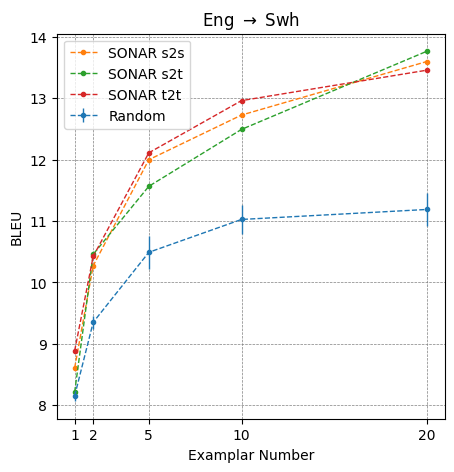

In [106]:
get_plot(
    direction,
    d_bleu_3,
    method_of_interest="SONAR",
    metric="BLEU"
)

In [107]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [108]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

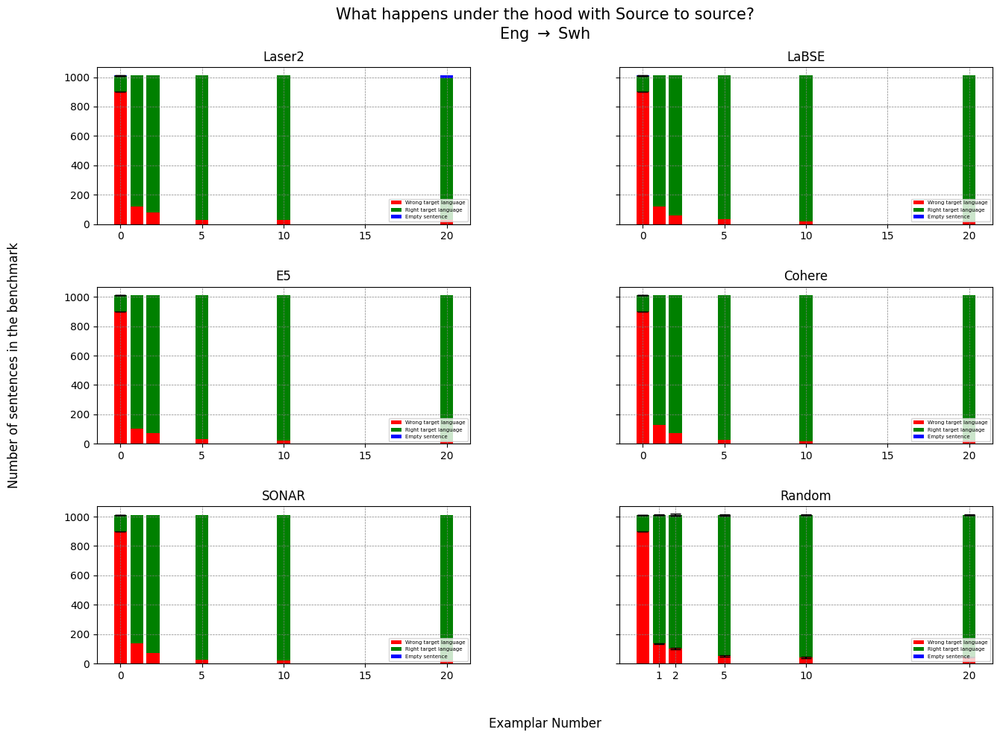

In [81]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

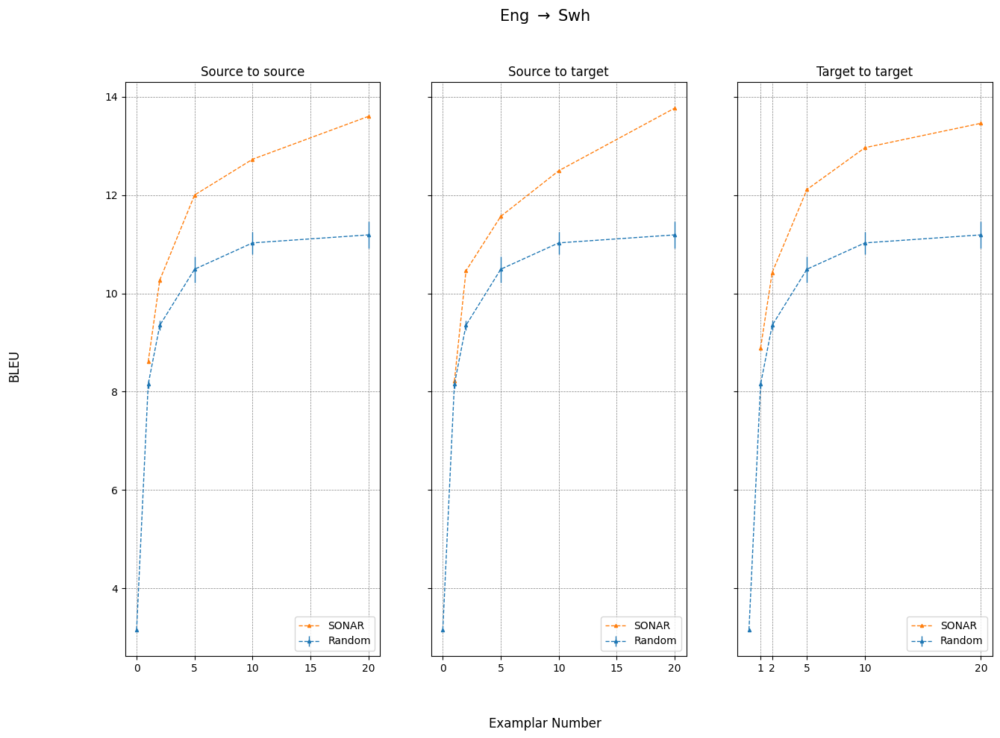

In [30]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

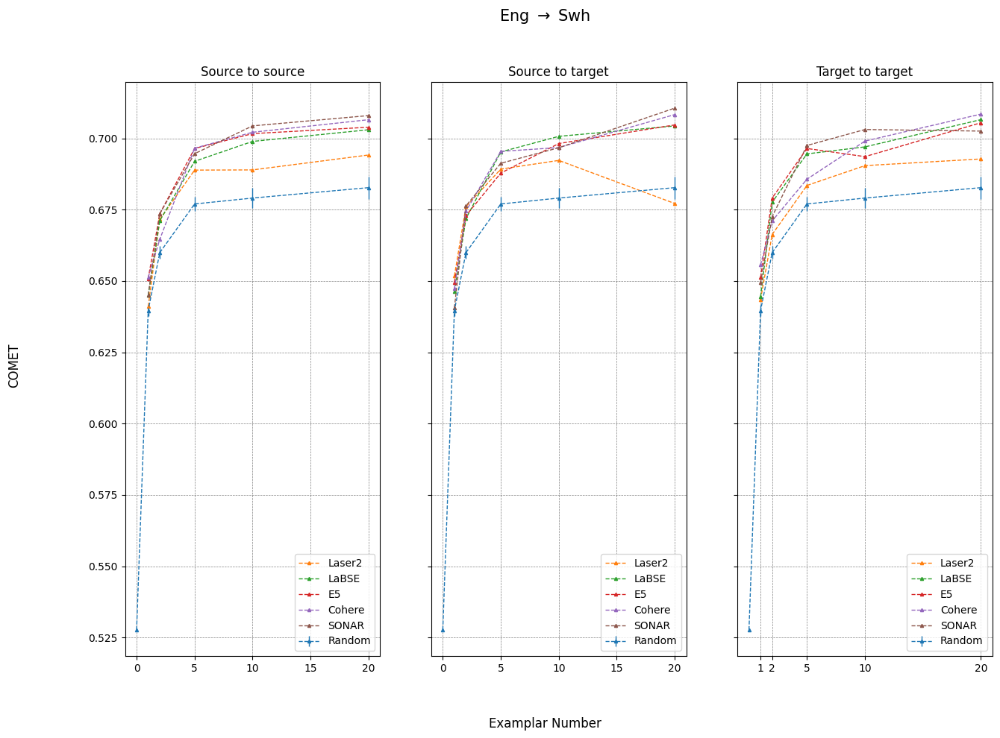

In [27]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

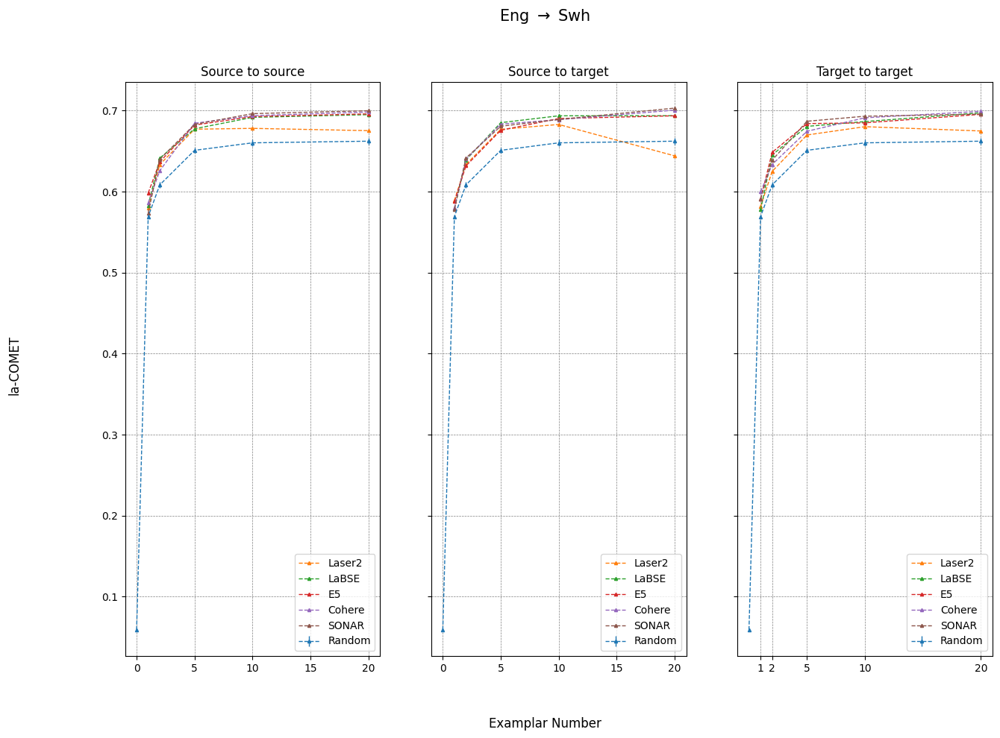

In [28]:
get_plots(
    direction, 
    d_lacomet_3,
    "la-COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [116]:
direction = "Eng_to_Swh"
try :
    d_b_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_3, d_c_3 = get_scores(
        direction,
        data_dir="./generations/bloom/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/bloom/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_3, fout)
    with open(f"./generations/bloom/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_3, fout)

In [118]:
d_b_3["Random"] = d_bleu_3["Random"]
d_c_3["Random"] = d_chrf_3["Random"]

In [ ]:
d_f_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_3["Random"] = d_full_3["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_3,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

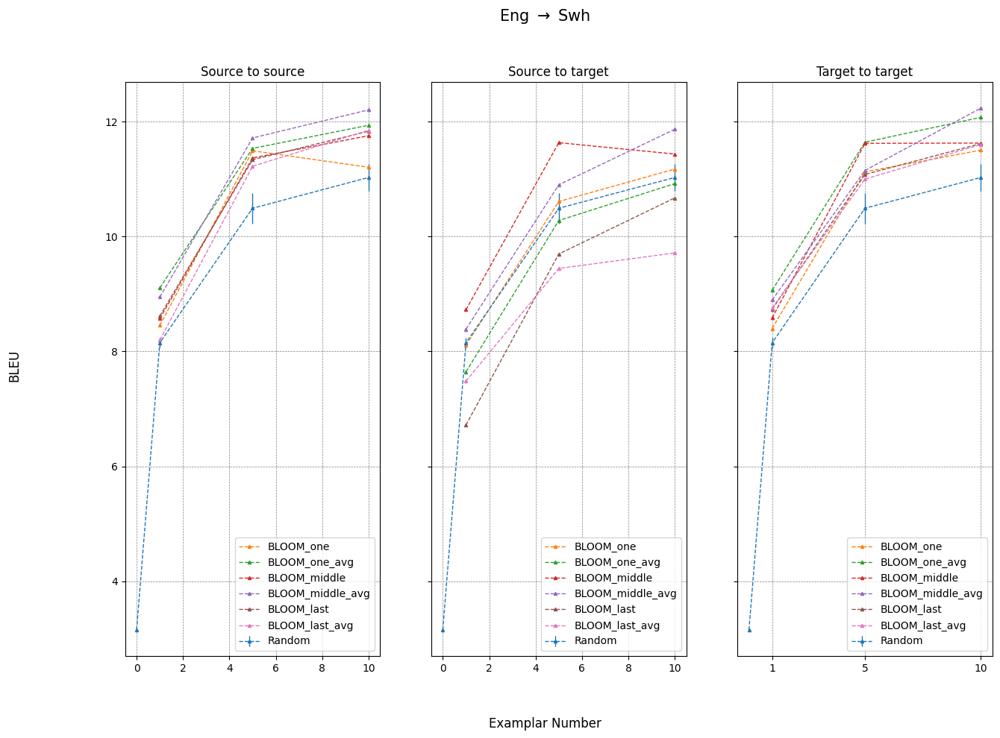

In [119]:
get_plots(
    direction, 
    d_b_3,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_3, **d_bleu_3},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### ngram

In [91]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/bloom/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/bloom/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/bloom/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/bloom/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/bloom/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [92]:
for key in ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_3['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [8.840013259479324, 10.644906684591316, 11.552834959086873, 12.910840722001257, 13.498141530445494]
BLEU: [8.860715397892154, 10.954036920293756, 11.421097602250281, 12.180852830852363, 13.167082801835042]
BLEU_pos: [8.818505895134404, 9.713048183400312, 10.553907230897966, 11.250613810768575, 11.572968304112504]
Rouge: [8.70642198607754, 9.79596687012522, 11.46357473827704, 11.738346432182754, 13.11144208492567]
Pos: [8.850048773883538, 10.154339338738163, 10.657190931592497, 11.31146964128554, 11.320342910571267]
Grakel: [8.797550673191404, 10.122766460459196, 10.466783748069039, 10.859593089290643, 0.01861811130997837]
SONAR: [8.607556864842321, 10.27140577708788, 11.99978436591125, 12.727488958643391, 13.60008581659442]
Random: [8.150743627128602, 9.350100025300009, 10.491014882702908, 11.026369929016488, 11.189282923517851]


In [93]:
d_f_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom/ngram",
    methods = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"]
)

The method 'Random' is not part of ['bm25', 'BLEU', 'BLEU_pos', 'Rouge', 'Pos', 'Grakel'].


In [ ]:
plt.figure(figsize=(2, 3))
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["SONAR", "bm25", "Random"],
    rows = 1, cols = 3,
    with_zero_shot = True
)

### Scaling

In [70]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [71]:
direction = "Eng_to_Swh"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/bloom/scaling/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [72]:
L2 = []
for size in S :
    d = load_scores(
        direction = direction,
        score = "COMET",
        data_dir=f"./generations/bloom/scaling/{size}/comet_la_scores",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L2.append(d)

In [73]:
K = [1, 5, 10]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
full2 = {k : {} for k in K}
for k in K :
    for i, d in enumerate(L) :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
                full2[k][method].append(L2[i][method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]
                full2[k][method] = [L2[i][method]["s2s"][k]]

In [74]:
dico, metric = full2, "COMET"
#dico, metric = full, "BLEU"

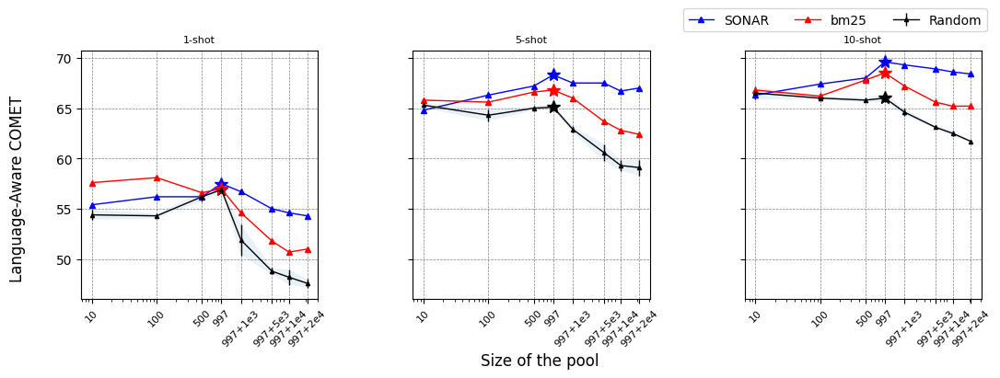

In [75]:
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["blue", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    #sharex=True,
    figsize=(12, 4)
)


plt.subplots_adjust(
    left=0.085,
    bottom=0.2, 
    #right=0.9, 
    top=0.875, 
    wspace=0.4, 
    #hspace=0.4
)

#f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supxlabel("Size of the pool")
#f.supylabel(f"{metric}")
f.supylabel(f"Language-Aware COMET")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    random_mean = [round(100*v, 1) for v in random_mean]
    random_std = [round(100*v, 2) for v in random_std]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        #[dico[k]["Random"][3]['mean']],
        [round(100*dico[k]["Random"][3]['mean'], 2)],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            #dico[k][method_of_interest],
            [round(100*v, 1) for v in dico[k][method_of_interest]],
            linewidth=1.0, 
            marker="^",
            label=method_of_interest,
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            #[dico[k][method_of_interest][3]],
            [round(100*dico[k][method_of_interest][3], 1)],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"{k}-shot", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    #ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    """
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        fontsize=8
        #rotation = 90
    )
    """
    ax[i].set_xticks(S)
    ax[i].set_xticklabels(
        [10, 100, 500, 997, "997+1e3", "997+5e3", "997+1e4", "997+2e4"],
        fontsize=8,
        rotation=45
    )

lines, labels = ax[0].get_legend_handles_labels()
plt.legend(handles=lines, labels=labels, bbox_to_anchor=[1.05, 1.195], ncol=len(K))

#f.suptitle(f"Robustness of $ES3$\n{source} $\\rightarrow$ {target}", fontsize=10)
#f.suptitle(f"English $\\rightarrow$ Swahili", fontsize=10)
plt.savefig("robustness_lacomet.pdf", format="pdf", bbox_inches="tight")
plt.show()

## English to Wolof

### Regular

In [28]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
print_dico(d_bleu_4)

In [55]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [62]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

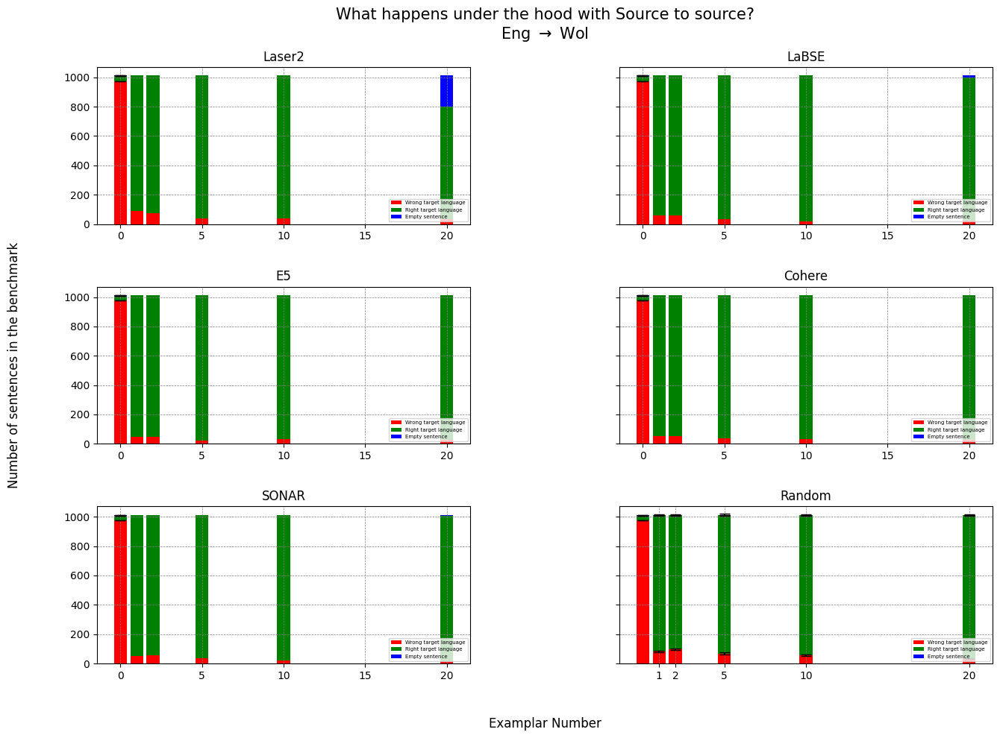

In [63]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

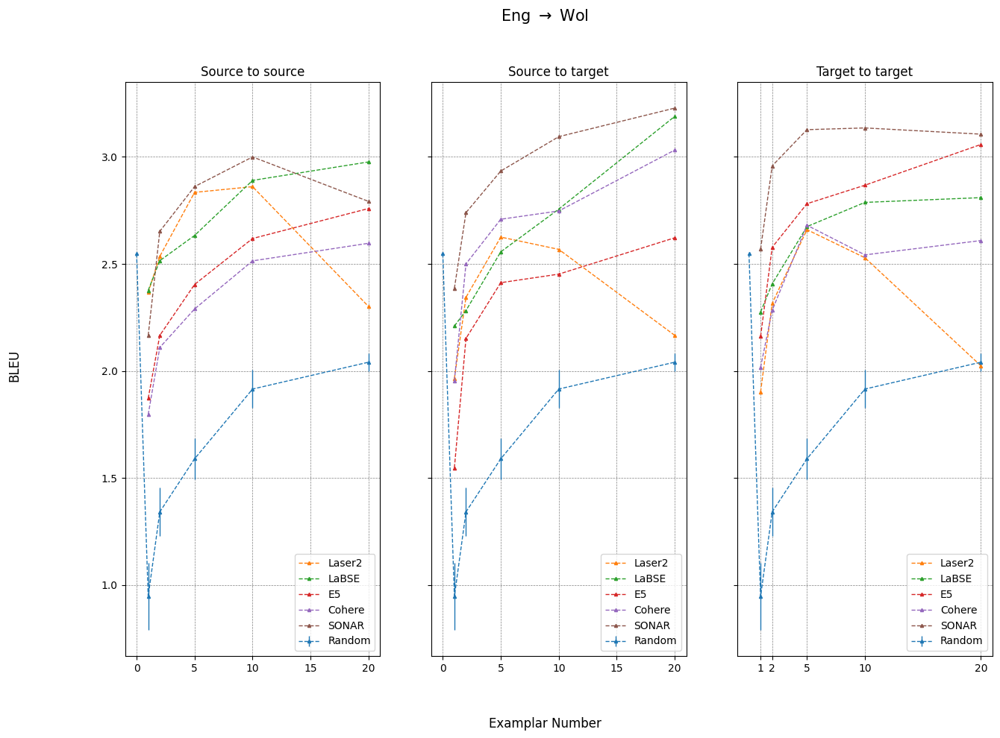

In [61]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

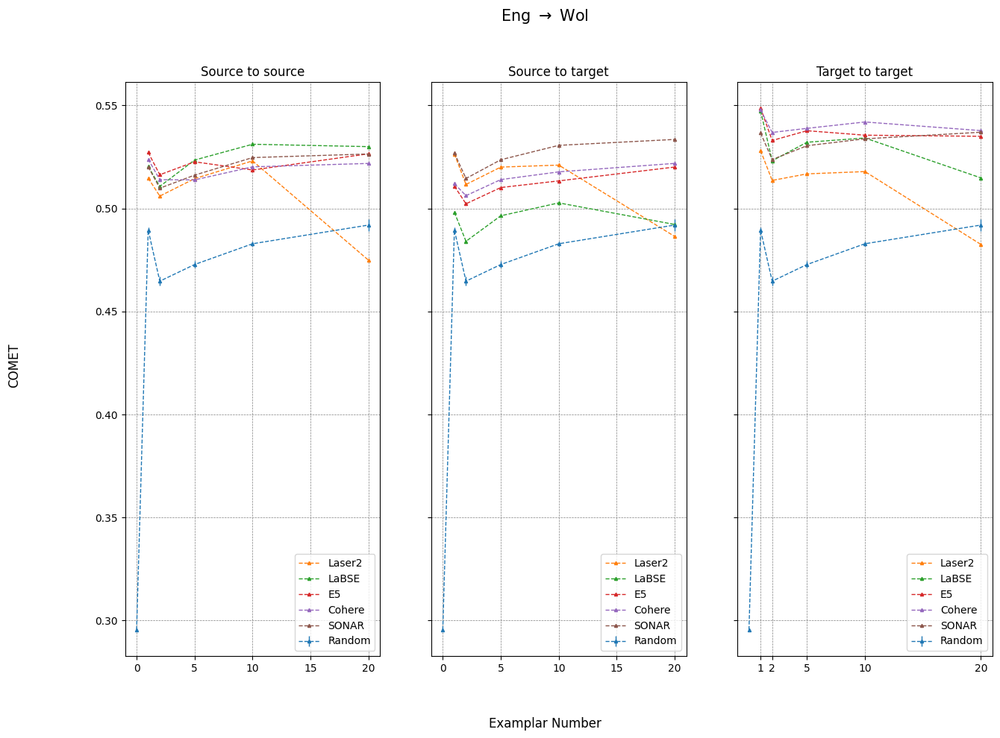

In [57]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

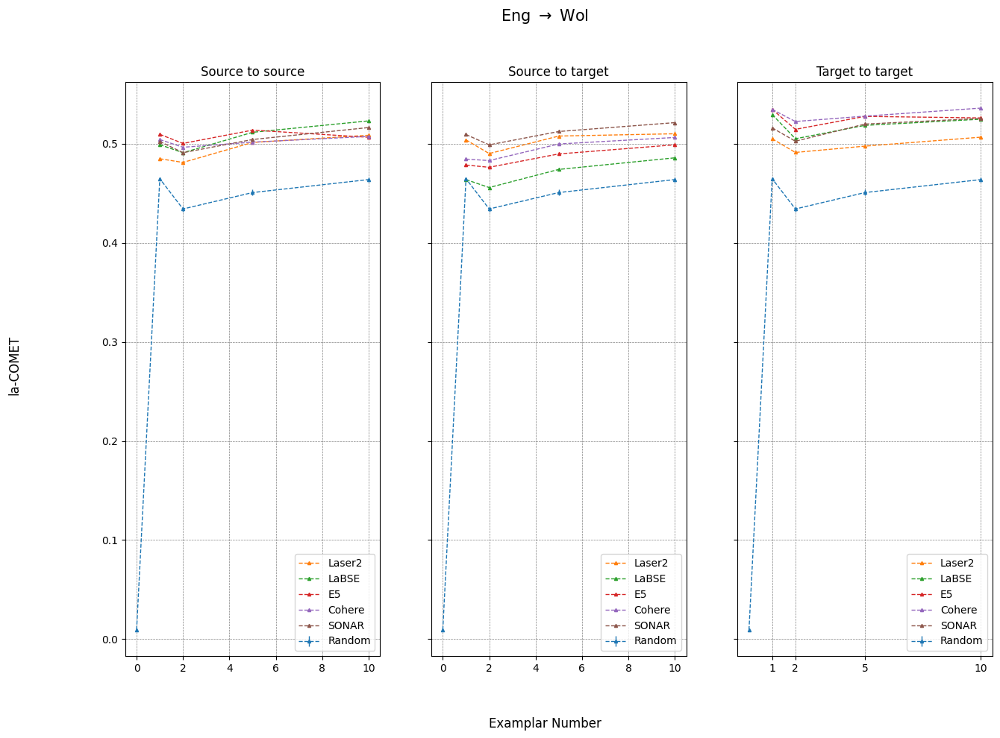

In [59]:
get_plots(
    direction, 
    d_lacomet_4,
    "la-COMET", 
    [1, 2, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [ ]:
direction = "Eng_to_Wol"
try :
    d_b_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_4, d_c_4 = get_scores(
        direction,
        data_dir="./generations/bloom/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/bloom/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_4, fout)
    with open(f"./generations/bloom/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_4, fout)

In [ ]:
d_b_4["Random"] = d_bleu_4["Random"]
d_c_4["Random"] = d_chrf_4["Random"]

In [ ]:
d_f_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_4["Random"] = d_full_4["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_4,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_b_4,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    #with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_4, **d_bleu_4},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    #with_zero_shot=True
)

### ngram

In [27]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/bloom/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/bloom/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/bloom/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/bloom/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/bloom/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [29]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_4['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [1.772155336032858, 2.0769071864944766, 2.2787698750185563, 2.7714142840756515, 2.929181171840667]
BLEU: [1.5359803425395082, 2.14478967161684, 2.5170377447626167, 2.759227194140836, 2.6494012577429342]
BLEU_pos: [1.6716712187986147, 2.1016659404563054, 2.384259696459347, 2.580320636937366, 2.643034222076419]
Rouge: [1.385940544307687, 1.8403967500988256, 2.1399734854060135, 2.5817226667134827, 2.611177435129023]
Pos: [1.6759884613313785, 2.0576965123890427, 2.237438153489232, 2.2853950761244506, 1.2980490499245056]
Grakel: [0.9221160567193257, 1.578010580534335, 1.8169452359884235, 1.9214248350000307, 1.0840656203346473e-48]
SONAR: [2.1652754599828765, 2.6521212285824842, 2.8612053028275186, 2.9997907682920704, 2.7919147252889935]
Random: [0.9461703581888896, 1.3412250791464002, 1.589422282186116, 1.9152591919352517, 2.040734305760886]


## French to English

In [15]:
direction = "Fra_to_Eng"
try :
    d_bleu_5 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_5 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_5, d_chrf_5 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_5, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_5, fout)

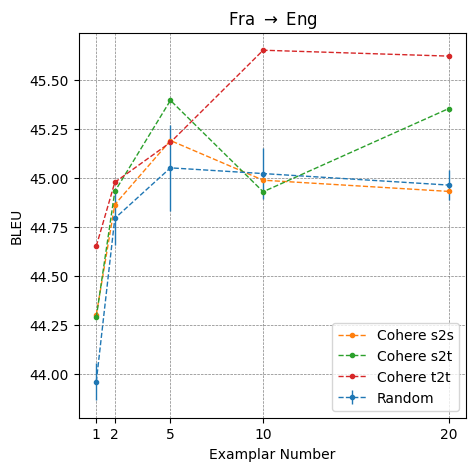

In [16]:
get_plot(
    direction,
    d_bleu_5,
    method_of_interest="Cohere",
    metric="BLEU"
)

In [17]:
d_comet_5 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_5 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [18]:
d_full_5 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

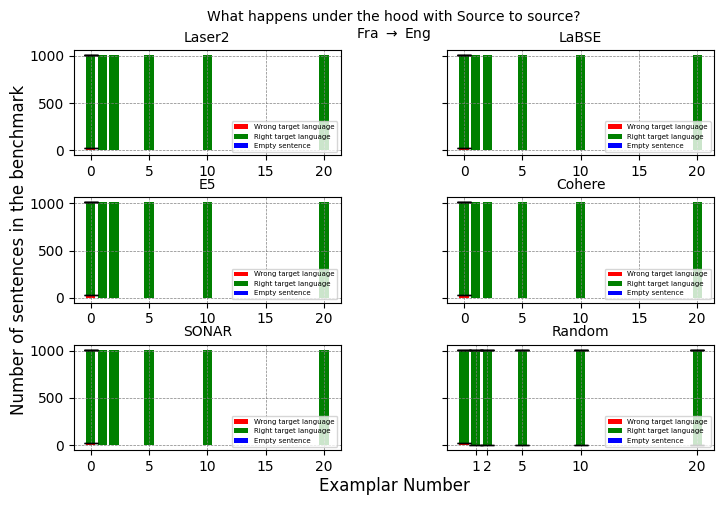

In [19]:
get_analysis(
    direction = direction,
    dico = d_full_5,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

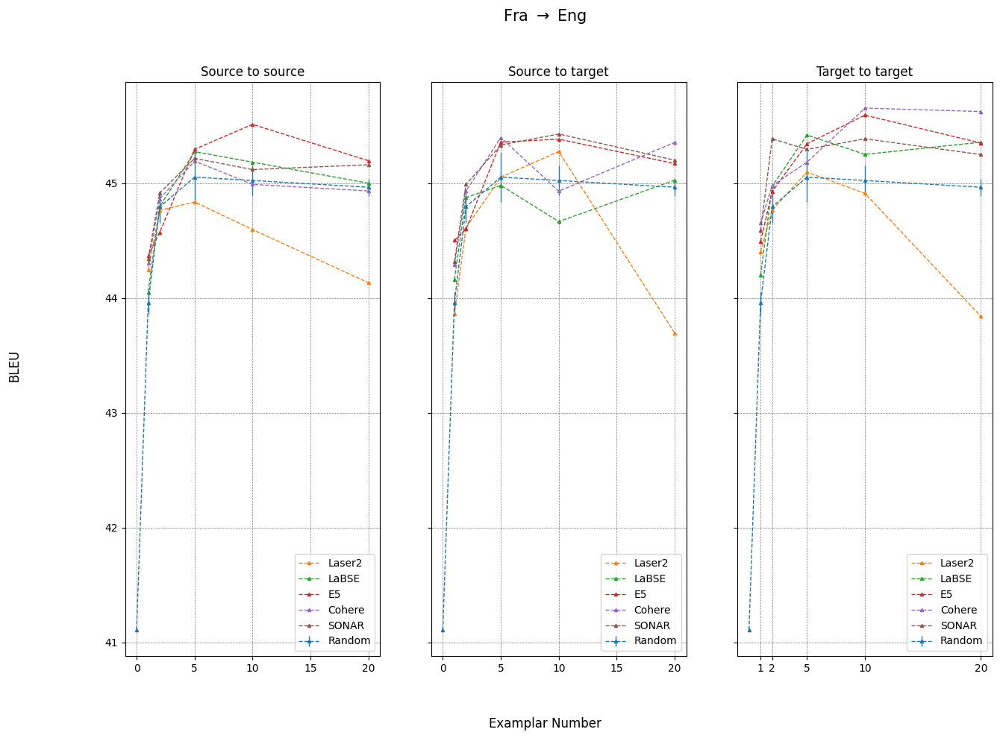

In [20]:
get_plots(
    direction, 
    d_bleu_5,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

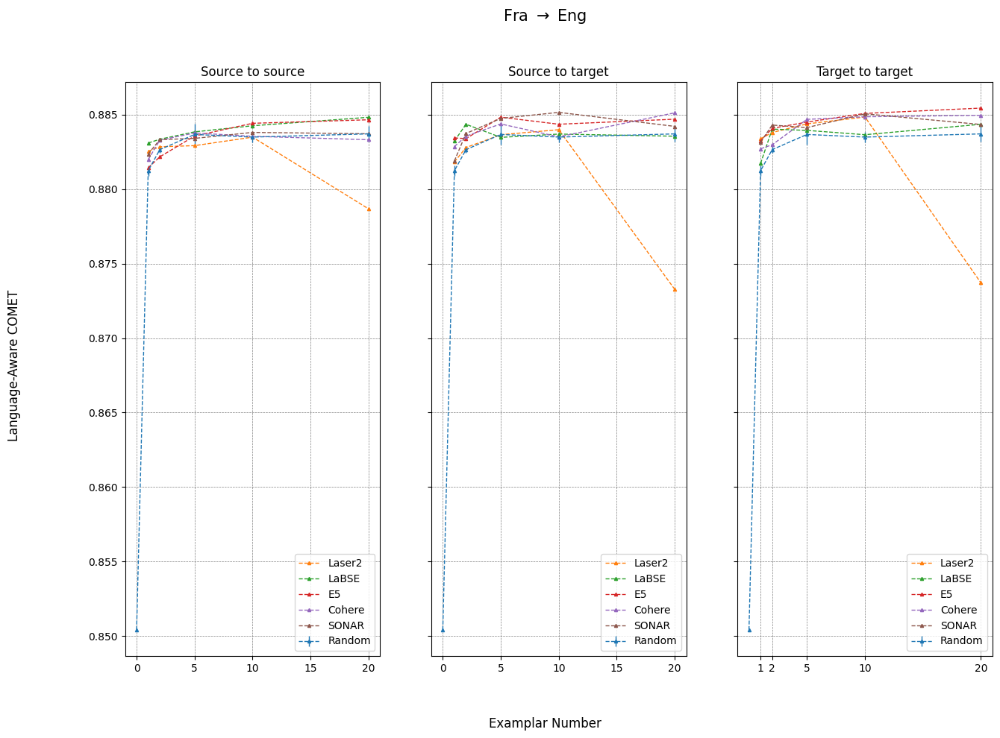

In [21]:
get_plots(
    direction, 
    d_lacomet_5,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## German to English

In [22]:
direction = "Deu_to_Eng"
try :
    d_bleu_6 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_6 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_6, d_chrf_6 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_6, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_6, fout)

In [23]:
d_comet_6 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_6 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [24]:
d_full_6 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

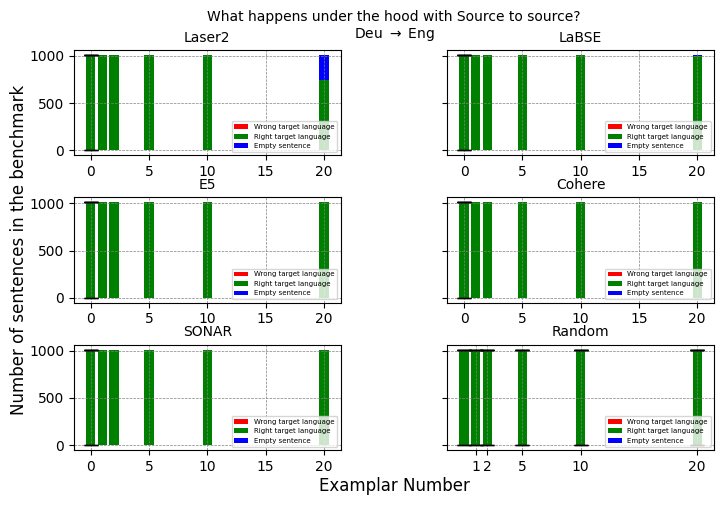

In [25]:
get_analysis(
    direction = direction,
    dico = d_full_6,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

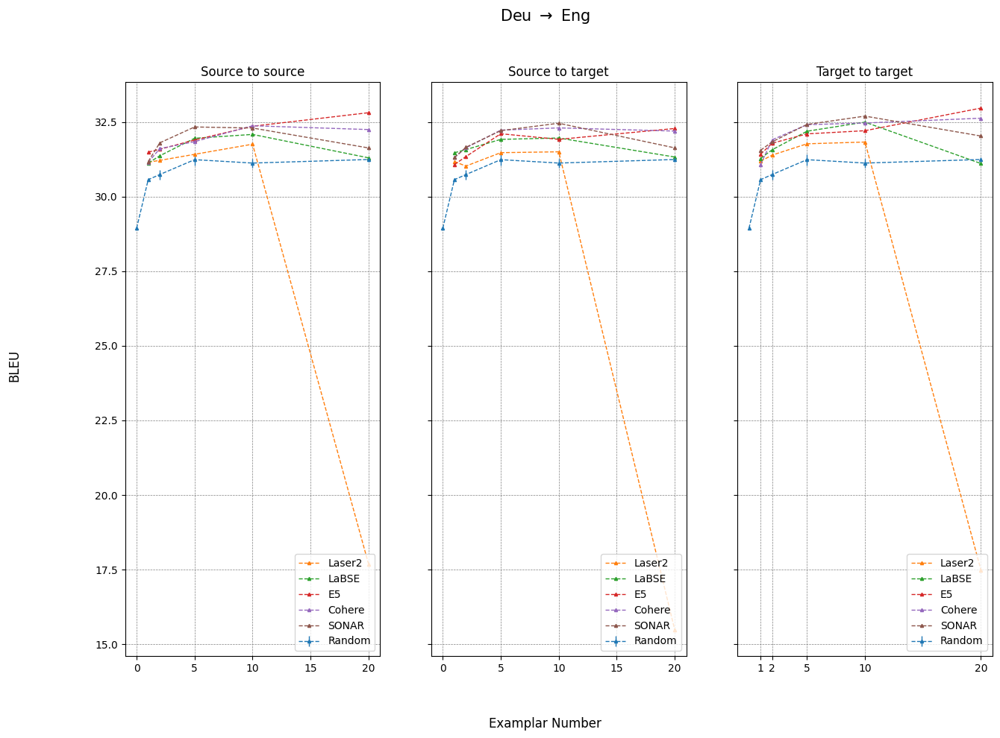

In [26]:
get_plots(
    direction, 
    d_bleu_6,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

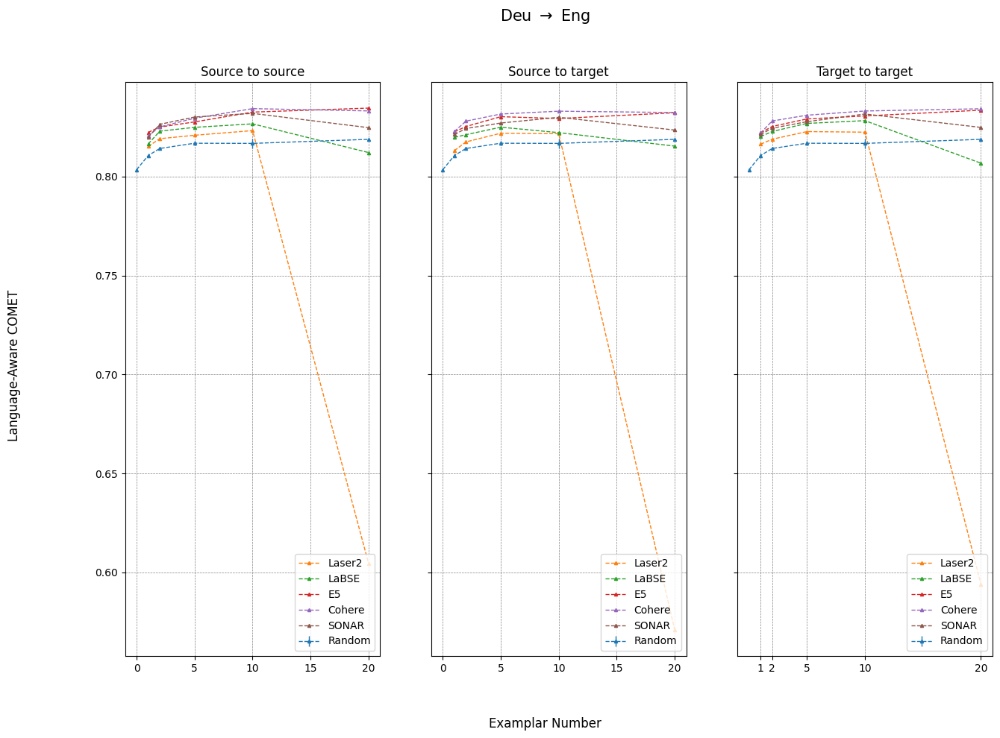

In [27]:
get_plots(
    direction, 
    d_lacomet_6,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Swahili to English

In [28]:
direction = "Swh_to_Eng"
try :
    d_bleu_7 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_7 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_7, d_chrf_7 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_7, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_7, fout)

In [29]:
d_comet_7 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_7 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [30]:
d_full_7 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

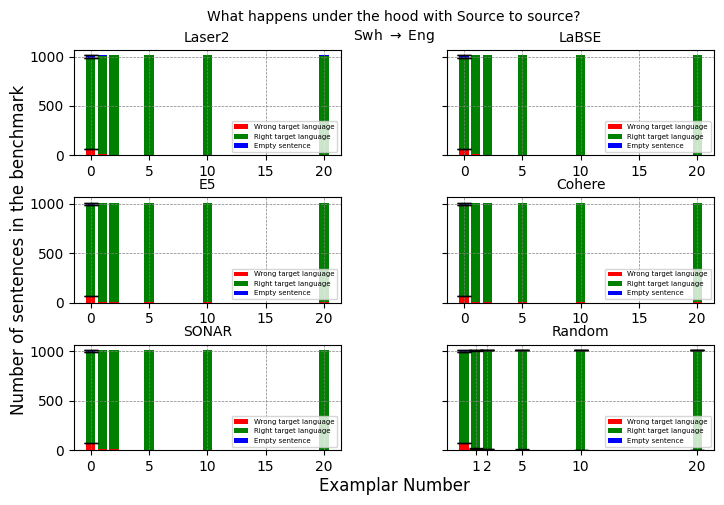

In [31]:
get_analysis(
    direction = direction,
    dico = d_full_7,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

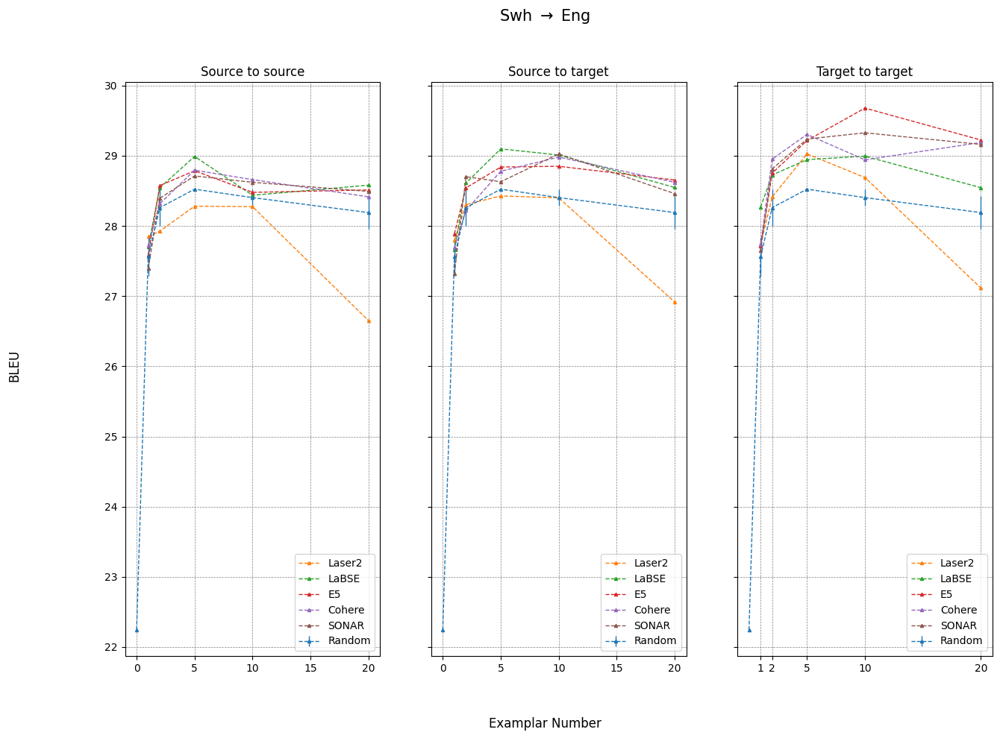

In [32]:
get_plots(
    direction, 
    d_bleu_7,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

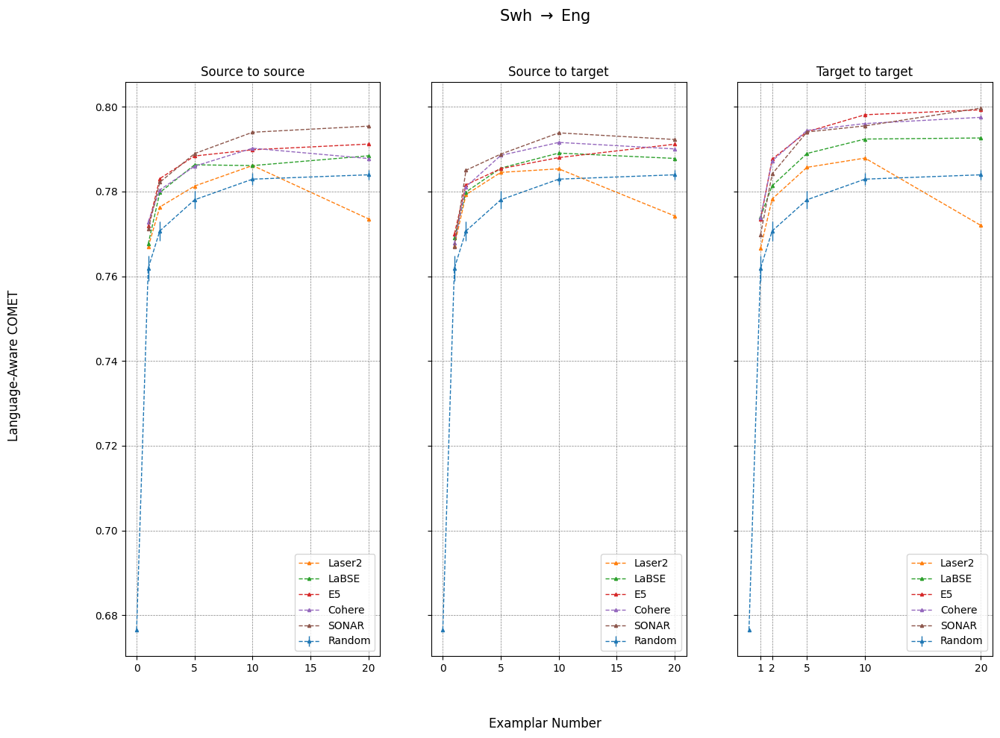

In [33]:
get_plots(
    direction, 
    d_lacomet_7,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Wolof to English

In [34]:
direction = "Wol_to_Eng"
try :
    d_bleu_8 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/bloom/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_8 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/bloom/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_8, d_chrf_8 = get_scores(
        direction,
        data_dir="./generations/bloom",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/bloom/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_8, fout)
    with open(f"./generations/bloom/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_8, fout)

In [35]:
d_comet_8 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_8 = load_scores(
    direction = direction,
    data_dir = "./generations/bloom/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [36]:
d_full_8 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/bloom",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

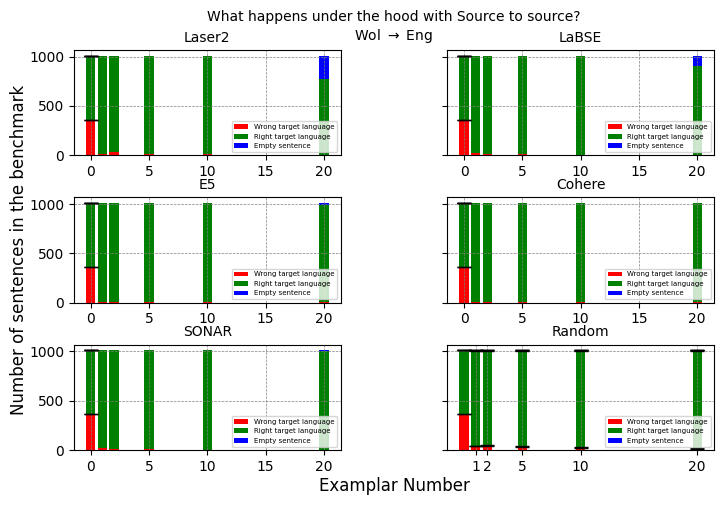

In [37]:
get_analysis(
    direction = direction,
    dico = d_full_8,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

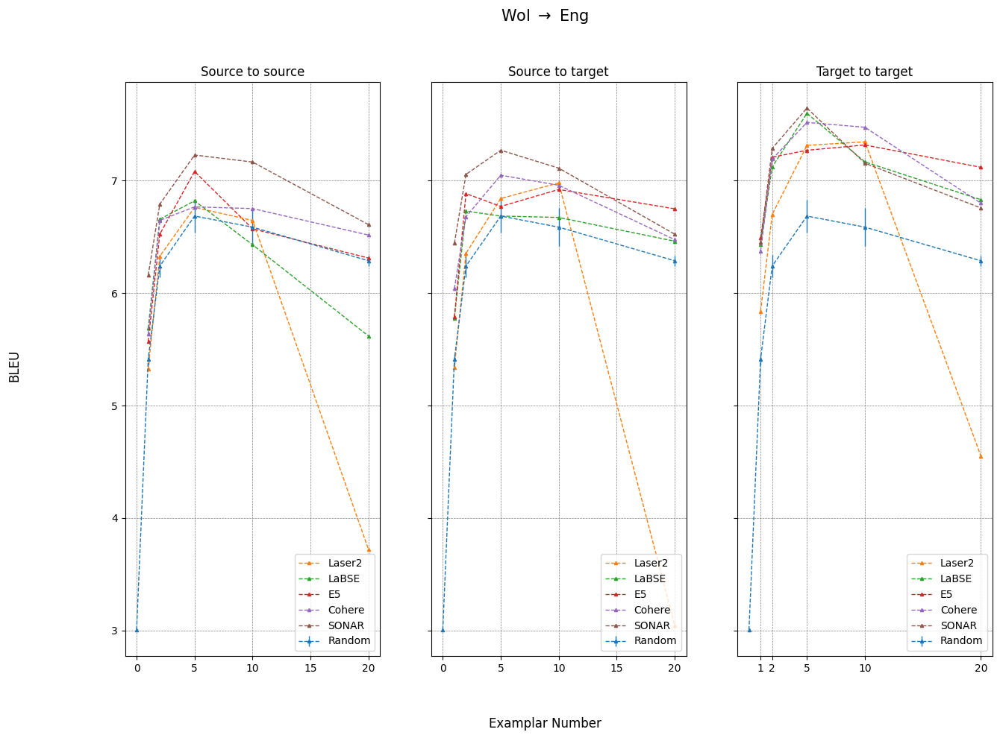

In [38]:
get_plots(
    direction, 
    d_bleu_8,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Ranking

In [33]:
dico = {}
dir2dico = {
    "Eng_to_Fra" : d_bleu_1,
    "Eng_to_Deu" : d_bleu_2,
    "Eng_to_Swh" : d_bleu_3,
    "Eng_to_Wol" : d_bleu_4,
    #"Fr_to_Eng" : d_bleu_5,
    #"Deu_to_Eng" : d_bleu_6,
    #"Swh_to_Eng" : d_bleu_7,
    #"Wol_to_Eng" : d_bleu_8
}
methods = [
    "Laser2",
    "LaBSE",
    "SONAR",
    "Cohere",
    "E5",
    "Random",
]
# strategies = ["s2s", "s2t", "t2t"]
strategies = ["s2s", "s2t"]
directions = list(dir2dico.keys())
for method in methods:
    if "Random" not in method :
        for strategy in strategies:
            key = f"{method}_{strategy}"
            dico[key] = {direction : [] for direction in directions}
            for direction in directions:
                for k in [1, 2, 5, 10, 20] :
                    dico[key][direction].append(
                        (
                            k,
                            dir2dico[direction][method][strategy][k]
                        )
                    )
    else :
        key = f"{method}_s2s"
        dico[key] = {direction : [] for direction in directions}
        for direction in directions:
            for k in [1, 2, 5, 10, 20] :
                dico[key][direction].append(
                    (
                        k,
                        dir2dico[direction][method]["s2s"][k]["mean"]
                    )
                )

In [34]:
mean_scores = {}
directions_to_ignore = ["Eng_to_Wol"]
for method in dico :
    mean_scores[method] = {}
    for direction in dico[method] :
        if direction in directions_to_ignore :
            continue
        L = [v for (k, v) in dico[method][direction] if k != 0]  
        mean_scores[method][direction] = np.mean(L)

In [35]:
dico_win_rate = {key : [] for key in mean_scores}
for direction in mean_scores["SONAR_s2s"] :
    R = []
    for method in mean_scores:
        R.append((method, mean_scores[method][direction]))
    R = sorted(R, key = lambda x : x[1])
    for i, element in enumerate(R):
        number_of_wins = i
        name = element[0]
        dico_win_rate[name].append(i/((len(R) - 1)))

In [36]:
from scipy.stats import gmean
for k in dico_win_rate :
    #dico_win_rate[k] = gmean(dico_win_rate[k])
    dico_win_rate[k] = np.mean(dico_win_rate[k])

results = sorted([(k, v) for (k, v) in dico_win_rate.items()], key = lambda x : x[1])
for i, result in enumerate(results[::-1]):
    print(f"{i+1}. {result[0]} -> {result[1]}")

1. Cohere_s2t -> 0.7333333333333334
2. Cohere_s2s -> 0.7333333333333334
3. SONAR_s2s -> 0.6666666666666666
4. Laser2_s2s -> 0.6333333333333333
5. E5_s2s -> 0.5666666666666667
6. LaBSE_s2t -> 0.5333333333333333
7. LaBSE_s2s -> 0.5333333333333333
8. Laser2_s2t -> 0.46666666666666673
9. SONAR_s2t -> 0.43333333333333335
10. E5_s2t -> 0.20000000000000004
11. Random_s2s -> 0.0


# Mistral 7b

## English to French

### Regular

In [143]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mistral-v0.1/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/mistral-v0.1/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [ ]:
print_dico(d_bleu_1)

In [ ]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/mistral-v0.1/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mistral-v0.1",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
d_bleu_1["Random"]

In [ ]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [144]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mistral-v0.1/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mistral-v0.1/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mistral-v0.1/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/mistral-v0.1/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [145]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [47.66233726748512, 47.97407317322313, 48.602277745386694, 49.0302096814337, 49.172838815248475]
BLEU: [47.88605639546533, 48.13473152329896, 48.540622722488074, 48.962020810082045, 49.157806073783654]
BLEU_pos: [47.3623922415838, 47.508180669655204, 48.4116204804305, 48.94070269672157, 49.0887525071988]
Rouge: [47.43196952664944, 47.64708146516687, 48.36566138129074, 48.54672471711568, 49.04545169166142]
Pos: [47.343699895799936, 48.11255525010701, 48.5271999713661, 49.00256120604342, 49.013904049543804]
Grakel: [47.91329294859716, 48.32728090355612, 48.66354735130397, 49.077041593805134, 49.146290405991124]
SONAR: [47.3836103466144, 47.813811161081624, 48.99568159955742, 49.176646067216105, 49.48930513078605]


## English to German

### Regular

In [146]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mistral-v0.1/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/mistral-v0.1/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/mistral-v0.1/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mistral-v0.1",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [147]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mistral-v0.1/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mistral-v0.1/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mistral-v0.1/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/mistral-v0.1/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [148]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [36.54155764847424, 37.32595223603974, 37.90305120311604, 38.13361846716026, 38.529279403191865]
BLEU: [36.807980040086065, 37.390516980342404, 37.63845017899941, 37.75938938561773, 38.21782167861113]
BLEU_pos: [36.08650073262074, 37.45623359653474, 37.55202440673701, 37.58264810588604, 37.68700919906927]
Rouge: [36.71615330358476, 37.502078520113315, 37.586327389815054, 37.9761539151294, 38.172252667058665]
Pos: [36.05816374245841, 36.979360133948575, 37.27805939215898, 37.451279704505374, 37.783680263951666]
Grakel: [36.39748226085631, 36.63022477525888, 37.125245842951486, 37.5660305533129, 37.48069960694726]
SONAR: [36.61278368289235, 37.16274795980539, 38.10624909584408, 38.16807863451542, 38.16276408673579]


## English to Swahili

### Regular

In [149]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mistral-v0.1/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/mistral-v0.1/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [ ]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/mistral-v0.1/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mistral-v0.1",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [150]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mistral-v0.1/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mistral-v0.1/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mistral-v0.1/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/mistral-v0.1/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [151]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [3.440803758693434, 3.9201000076402894, 4.967754448931391, 5.657476910949986, 6.3338056670372875]
BLEU: [3.4570485680985477, 3.620611501646094, 4.463210439197196, 4.776590748043292, 5.534443219617898]
BLEU_pos: [2.801777718699442, 2.942729618502578, 3.1755846395578318, 3.58824654685276, 3.8549304726797144]
Rouge: [3.1904204017368443, 3.3745763740358328, 3.794568118214575, 4.134468692508132, 4.677699076224604]
Pos: [2.9350238791060557, 2.938572967944188, 2.9476345108276223, 3.596868064354716, 3.917762771737599]
Grakel: [2.6250282461682106, 2.656990968462529, 2.989863590598812, 2.922519010060447, 3.2832458599486065]
SONAR: [3.474042629165022, 4.05465118665501, 4.638061705669931, 5.351511223405822, 6.260394137214562]


## English to Wolof

### Regular

In [152]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/mistral-v0.1/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/mistral-v0.1/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/mistral-v0.1/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/mistral-v0.1",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [153]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/mistral-v0.1/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/mistral-v0.1/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/mistral-v0.1/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/mistral-v0.1/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/mistral-v0.1/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/mistral-v0.1/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/mistral-v0.1/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [154]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [2.795025265969096, 2.9548501231249125, 3.2724998437351713, 3.4236205908424413, 3.7470698832053384]
BLEU: [2.605078156796594, 2.7179897818036705, 2.8558191090480167, 3.196281286927129, 3.5509431189985285]
BLEU_pos: [2.7834032575203396, 2.470984596595482, 2.737509475400975, 3.0024946224980953, 3.143211789317082]
Rouge: [2.446794355970184, 2.637499418698569, 2.8533796965694904, 3.182292721702858, 3.4521881546719557]
Pos: [2.761162467099026, 2.7967643715848354, 2.911339395257857, 2.999596717383904, 3.0704125353019336]
Grakel: [2.4210378325711712, 2.143015371910703, 2.3414758927908, 2.5214622194411027, 2.7637446439630127]
SONAR: [3.1922726733869897, 3.341514082294818, 3.4044098500980295, 3.6723601694452204, 3.859589288828817]


## French to English

# Llama 2 7b

In [156]:
ABLATIONS = ["BLEU", "BLEU_pos", "bm25", "Grakel", "Pos", "Rouge"]

## English to French

### Regular

In [66]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [83]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [84]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

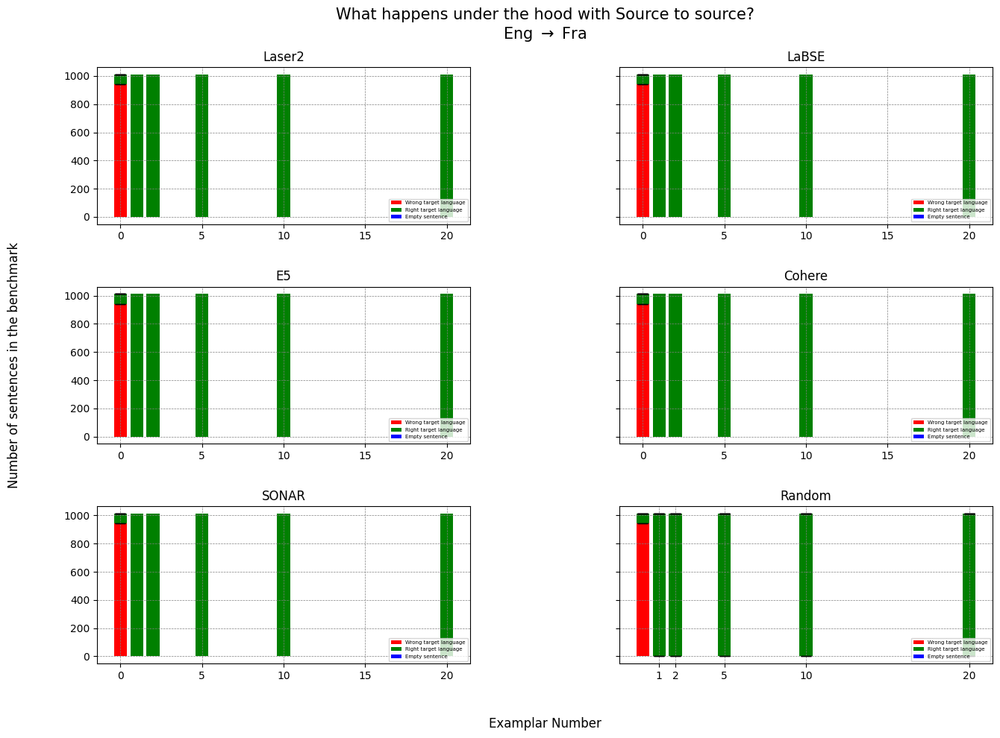

In [85]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

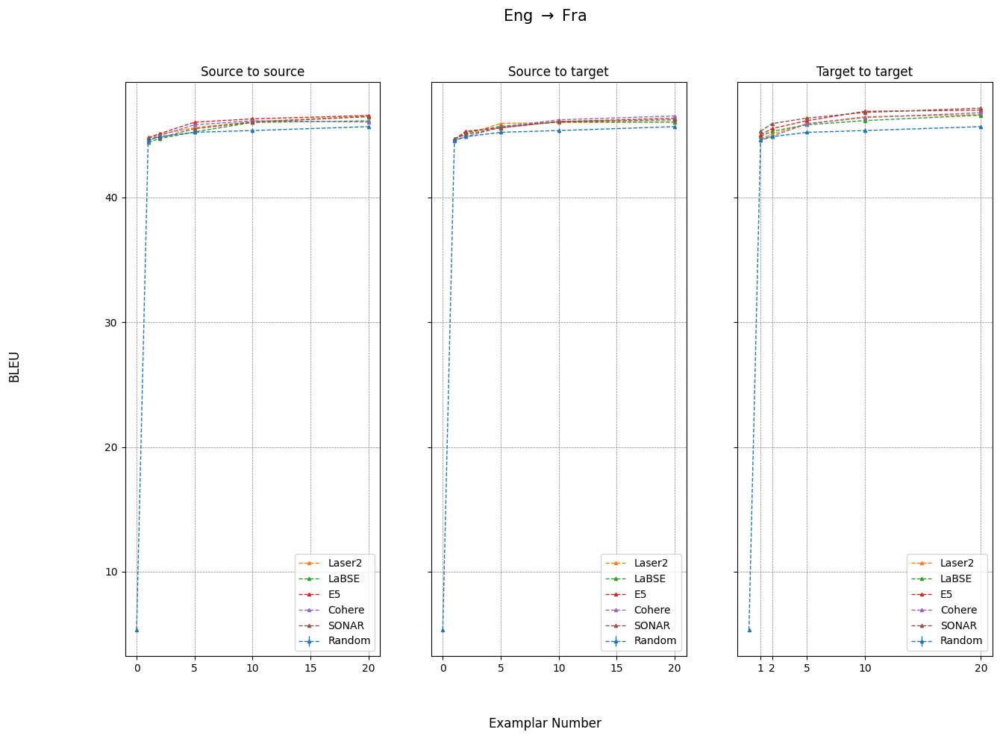

In [86]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

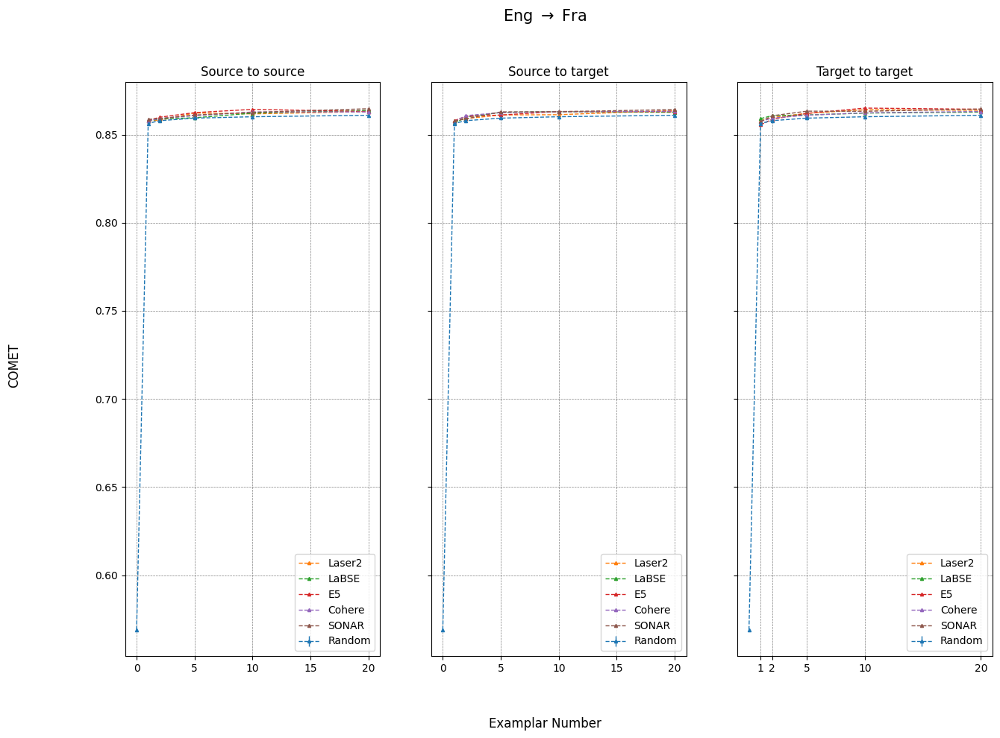

In [87]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [159]:
direction = "Eng_to_Fra"
try :
    d_b_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_1, d_c_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/llama-2-7b/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_1, fout)
    with open(f"./generations/llama-2-7b/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_1, fout)

In [160]:
d_b_1["Random"] = d_bleu_1["Random"]
d_c_1["Random"] = d_chrf_1["Random"]

In [90]:
d_f_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b/ablations",
    methods = ABLATIONS
)

The method 'Random' is not part of ['BLEU', 'BLEU_pos', 'bm25', 'Grakel', 'Pos', 'Rouge'].


In [91]:
d_f_1["Random"] = d_full_1["Random"]

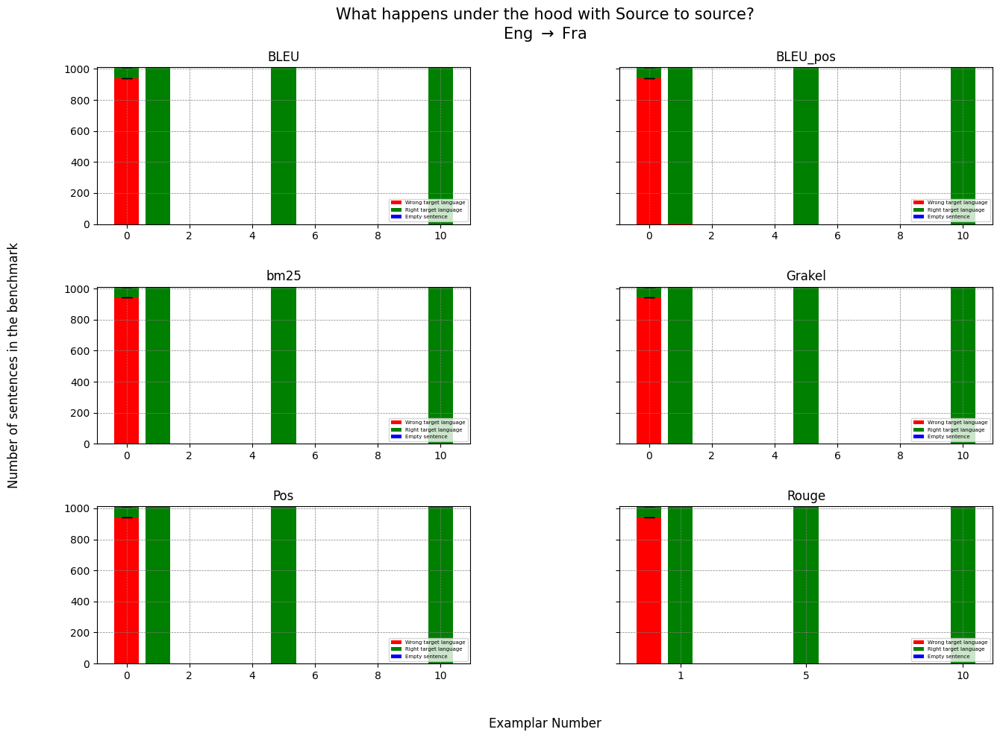

In [92]:
get_analysis(
    direction = direction,
    dico = d_f_1,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

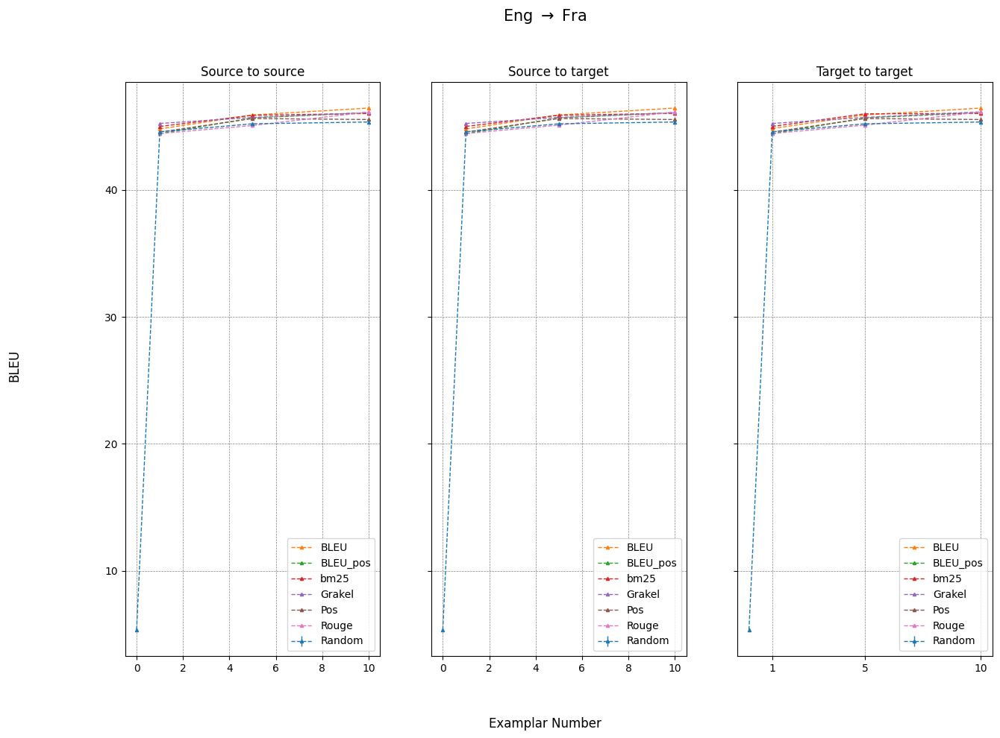

In [93]:
get_plots(
    direction, 
    d_b_1,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

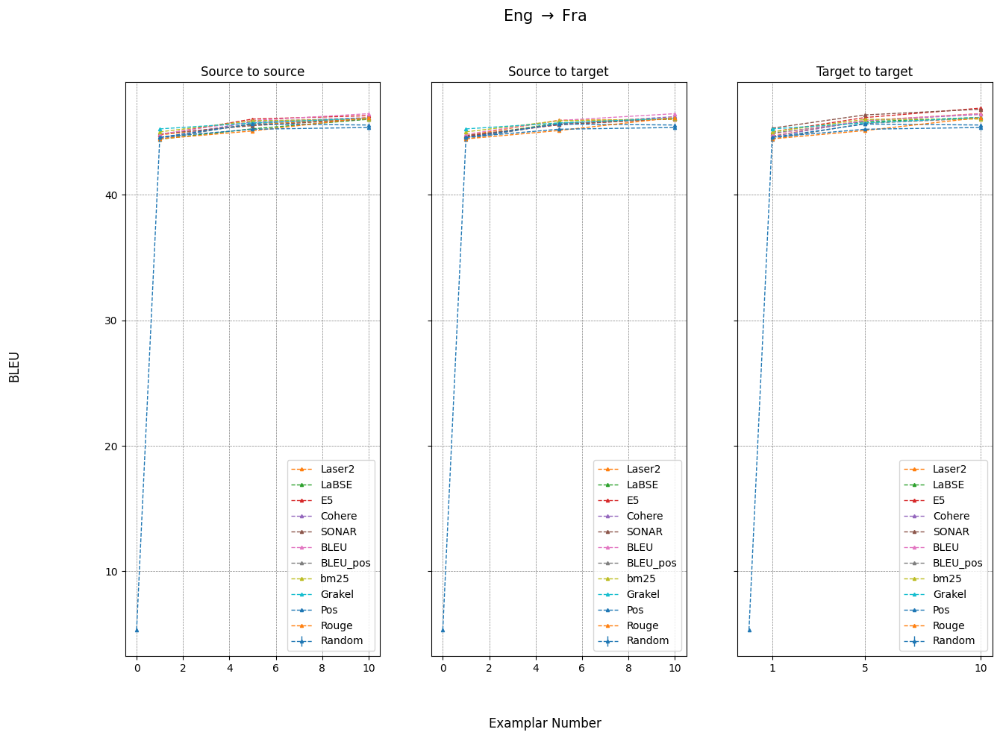

In [94]:
get_plots(
    direction, 
    {**d_b_1, **d_bleu_1},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### Ngram

In [67]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-7b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-7b/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-7b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/llama-2-7b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [68]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_1['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [44.96856511589544, 45.55325314248313, 45.92355141714693, 46.08953243781524, 46.38735147667463]
BLEU: [44.82742773338407, 45.515735063111215, 45.962089284856745, 46.44567171683526, 46.497058011821146]
BLEU_pos: [44.48404577006562, 44.92342711016763, 45.78916662211294, 46.050949266894705, 46.32938900935673]
Rouge: [44.47246907953275, 44.879423488417025, 45.09021285358328, 46.12156000117169, 46.24188971580254]
Pos: [44.56634010536533, 45.08619804186748, 45.62734456849133, 45.63289508941947, 45.936600497522754]
Grakel: [45.23107624201299, 45.17608859516889, 45.64336056617911, 46.14851056338251, 46.015742270156274]
SONAR: [44.85588002405294, 44.78091029839899, 45.505658556627786, 46.031540365014436, 46.46893523427846]
Random: [44.58585396370311, 44.86929262817142, 45.218408999476594, 45.35863994707545, 45.67411681942939]


## English to German

### Regular

In [71]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [ ]:
direction = "Eng_to_Deu"
try :
    d_b_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_2, d_c_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/llama-2-7b/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_2, fout)
    with open(f"./generations/llama-2-7b/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_2, fout)

In [ ]:
d_b_2["Random"] = d_bleu_2["Random"]
d_c_2["Random"] = d_chrf_2["Random"]

In [ ]:
d_f_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_2["Random"] = d_full_2["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_2,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_b_2,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_2, **d_bleu_2},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### Ngram

In [69]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-7b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-7b/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-7b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/llama-2-7b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [72]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_2['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [34.388807192560236, 35.33368043100595, 35.75169430196006, 36.05996281842386, 36.217967613859386]
BLEU: [34.60641493155695, 35.187669292440894, 35.61167280672018, 35.70957225791405, 36.47844002504196]
BLEU_pos: [34.228153876604615, 34.90273890673739, 35.18162538679886, 35.814010025801274, 35.67994656950344]
Rouge: [34.47748602650472, 35.05711940132099, 35.813497382220945, 35.911814847150026, 35.91134503661085]
Pos: [34.64509556895815, 35.10741450545619, 35.61383328246095, 35.812105639005445, 35.9165249776431]
Grakel: [34.56742186196575, 34.984471503029276, 35.34650997936634, 35.45233201106816, 35.9055447375849]
SONAR: [34.510824487266625, 34.79800925993252, 35.679400793868616, 35.698759256221706, 36.18570498033545]
Random: [34.14907938136057, 34.95523578832245, 35.213920324517396, 35.47080059874707, 35.67078496766272]


## English to Swahili

### Regular

In [42]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [49]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [48]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

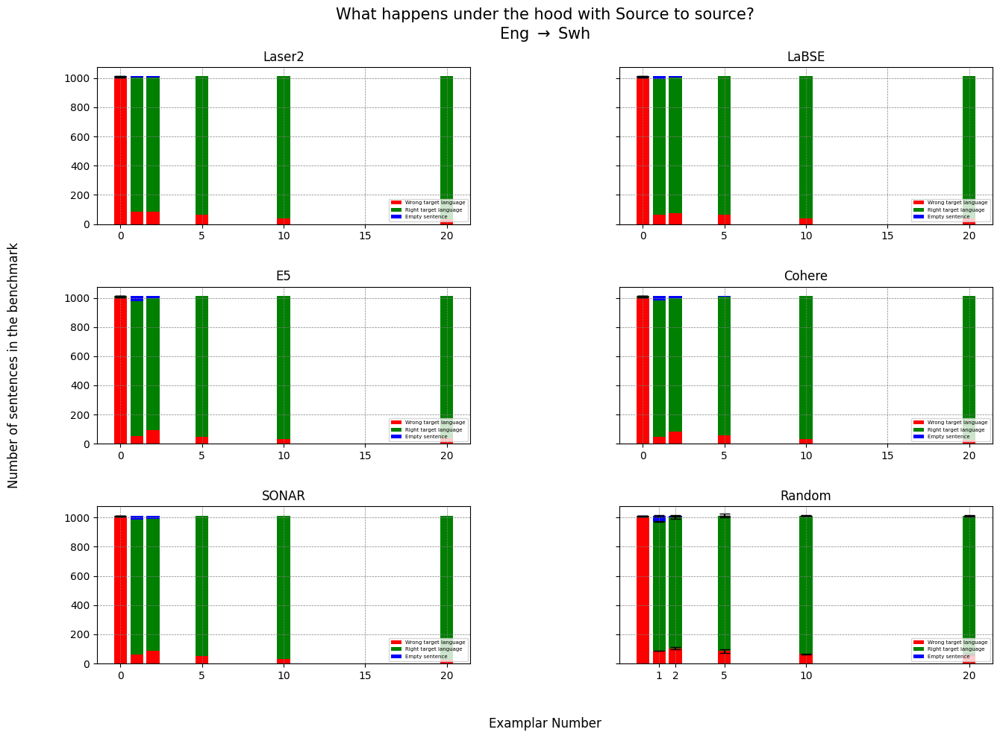

In [50]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

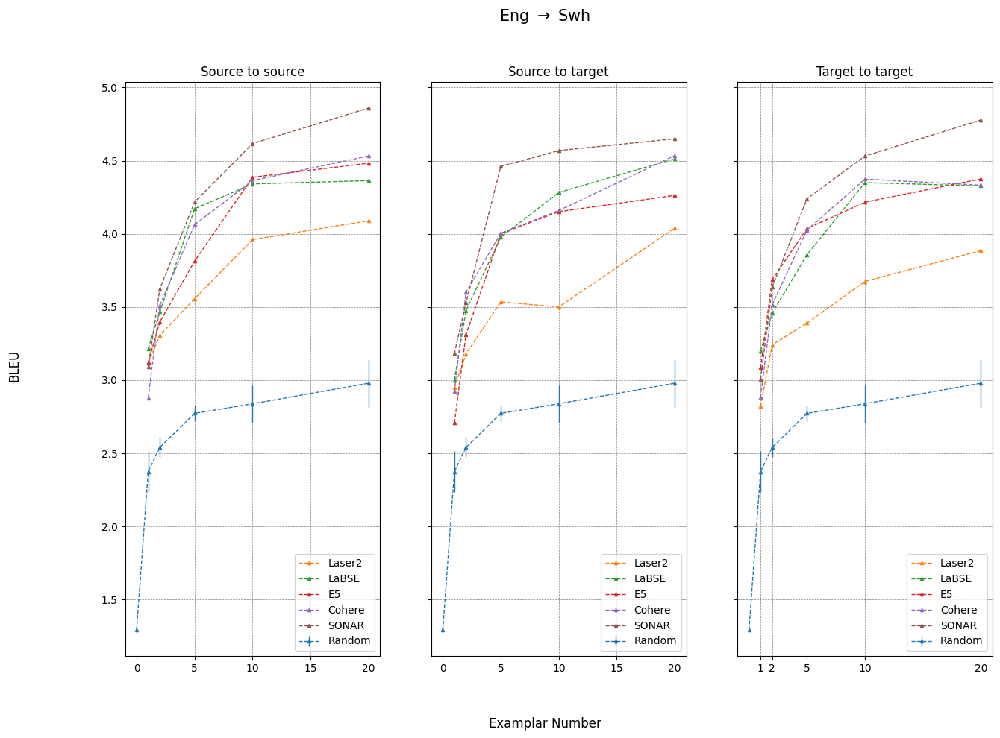

In [51]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

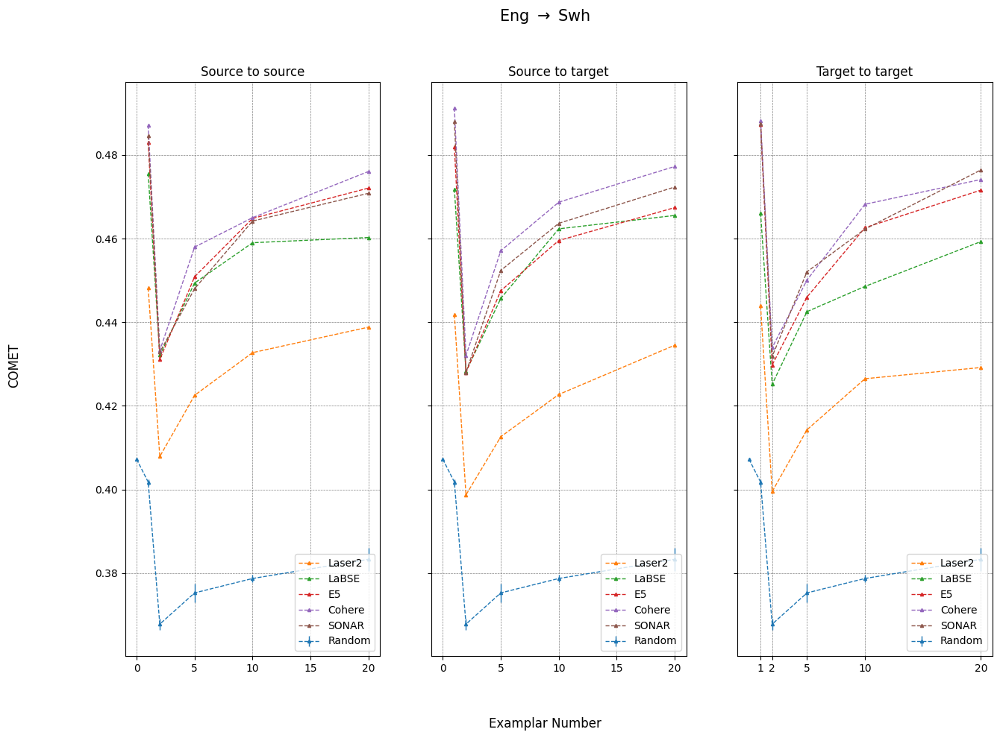

In [52]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [162]:
direction = "Eng_to_Swh"
try :
    d_b_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_3, d_c_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/llama-2-7b/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_3, fout)
    with open(f"./generations/llama-2-7b/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_3, fout)

In [163]:
d_b_3["Random"] = d_bleu_3["Random"]
d_c_3["Random"] = d_chrf_3["Random"]

In [58]:
d_f_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b/ablations",
    methods = ABLATIONS
)

The method 'Random' is not part of ['BLEU', 'BLEU_pos', 'bm25', 'Grakel', 'Pos', 'Rouge'].


In [59]:
d_f_3["Random"] = d_full_3["Random"]

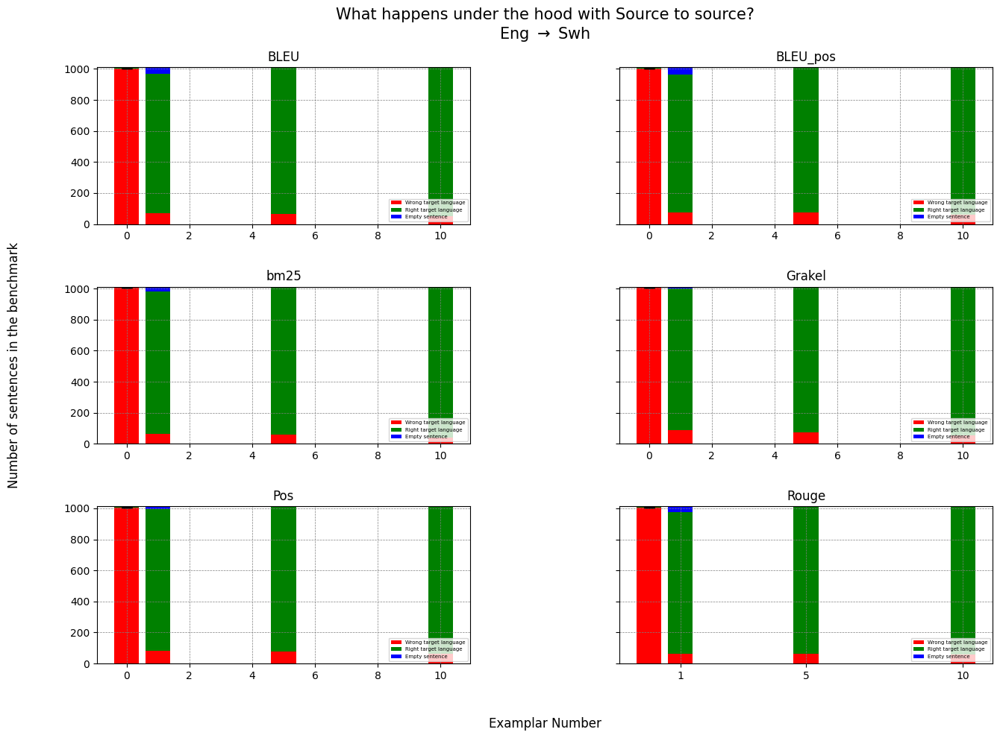

In [60]:
get_analysis(
    direction = direction,
    dico = d_f_3,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

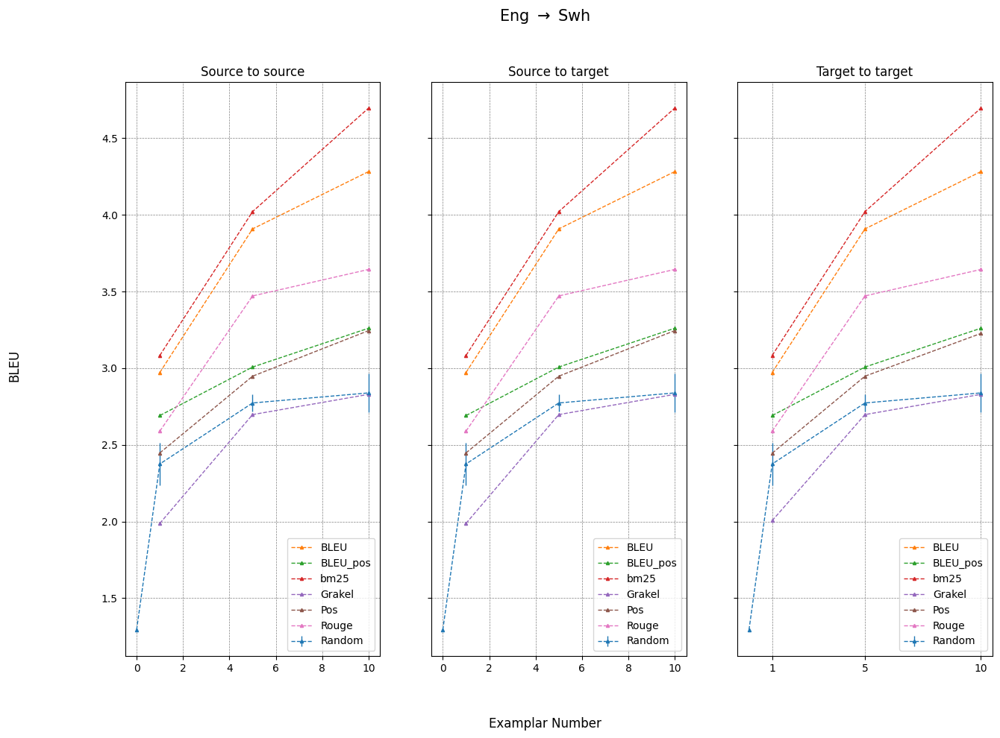

In [71]:
get_plots(
    direction, 
    d_b_3,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [165]:
for method in ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]  :
    for s in ["s2s", "s2t", "t2t"] :
        if method == "Random" and s != "s2s" :
            continue
        for k in [1, 2, 5, 10, 20] :
            if method != "Random" :
                d_bleu_3[method][s][k]

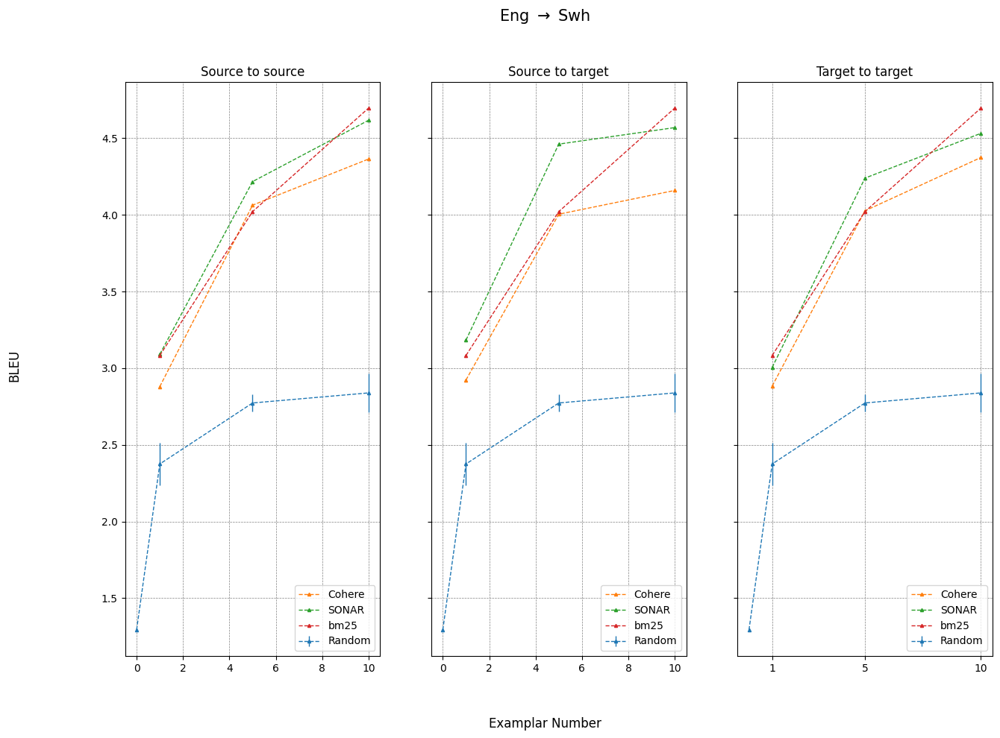

In [167]:
get_plots(
    direction, 
    {**d_bleu_3, **d_b_3},
    "BLEU", 
    [1, 5, 10],
    #methods = ["Laser2", "Cohere","LaBSE", "SONAR", "E5"] + ABLATIONS,
    methods = ["Cohere", "SONAR", "bm25"],
    with_zero_shot=True
)

### Ngram

In [43]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-7b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-7b/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-7b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/llama-2-7b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [44]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_3['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [3.050728776536905, 3.499053729342233, 4.035927825156404, 4.663250754789336, 4.66778791954384]
BLEU: [2.9738656180254854, 3.369326310597724, 3.8921541391192096, 4.29121020901215, 4.581490889985384]
BLEU_pos: [2.6784724598403153, 3.0743929030365766, 3.0342153522497632, 3.2848091914714366, 3.39169816576112]
Rouge: [2.5851437509736446, 2.9687110531412317, 3.4201784638154753, 3.6146403884403804, 3.861215242067658]
Pos: [2.446170189876506, 2.9853300082558416, 2.946956720823491, 3.2252565816542966, 3.439253654267977]
Grakel: [1.999571344118301, 2.605173119051098, 2.6488157429182295, 2.786401194520701, 2.859905267932968]
SONAR: [3.0907253409152373, 3.6236978598947363, 4.216700668172663, 4.616551828828095, 4.859236659527553]
Random: [2.3751473825178846, 2.5402700824486804, 2.7730760711631284, 2.8386552664165574, 2.979246515652546]


## English to Wolof

### Regular

In [77]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [ ]:
direction = "Eng_to_Wol"
try :
    d_b_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ablations/bleu_scores",
        methods=ABLATIONS
    )
    d_c_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ablations/chrf_scores",
        methods=ABLATIONS
    )
except :
    d_b_4, d_c_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ablations",
        methods=ABLATIONS
    )
    with open(f"./generations/llama-2-7b/ablations/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_b_4, fout)
    with open(f"./generations/llama-2-7b/ablations/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_c_4, fout)

In [ ]:
d_b_4["Random"] = d_bleu_4["Random"]
d_c_4["Random"] = d_chrf_4["Random"]

In [ ]:
d_f_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b/ablations",
    methods = ABLATIONS
)

In [ ]:
d_f_4["Random"] = d_full_4["Random"]

In [ ]:
get_analysis(
    direction = direction,
    dico = d_f_4,
    K = [1, 5, 10],
    methods = ABLATIONS,
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_b_4,
    "BLEU", 
    [1, 5, 10],
    methods = ABLATIONS,
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    {**d_b_4, **d_bleu_4},
    "BLEU", 
    [1, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"] + ABLATIONS,
    with_zero_shot=True
)

### Ngram

In [76]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-7b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-7b/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-7b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/llama-2-7b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [78]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_4['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [1.7785718982174317, 2.376025185121665, 2.982186229892612, 3.0349857103477444, 3.267144164406913]
BLEU: [1.690799574242369, 2.3260883945698163, 2.720510703360756, 3.0627951124265027, 3.4722183838014513]
BLEU_pos: [1.6924875005092912, 2.382003281329263, 2.8847105212494597, 2.8880764115674036, 3.0022413933949728]
Rouge: [1.191174382271776, 1.96371440091867, 2.7467132881494853, 3.116399513248734, 3.2698066177018617]
Pos: [1.8895661467319294, 2.5682318828436044, 2.8350786533586905, 3.085480907523793, 2.952426561201137]
Grakel: [1.2795609377393742, 2.023770815759175, 2.271941692273809, 2.3665322144278944, 2.5902179841051263]
SONAR: [2.115928944781027, 2.8175173806141807, 3.400849614799754, 3.663247921156632, 3.806572068686402]
Random: [1.2635848935236031, 1.8208148702250995, 2.099512277823565, 2.3385441739484194, 2.4514670309949396]


## French to English

In [39]:
direction = "Fra_to_Eng"
try :
    d_bleu_5 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_5 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_5, d_chrf_5 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_5, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_5, fout)

In [40]:
d_comet_5 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_5 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [41]:
d_full_5 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

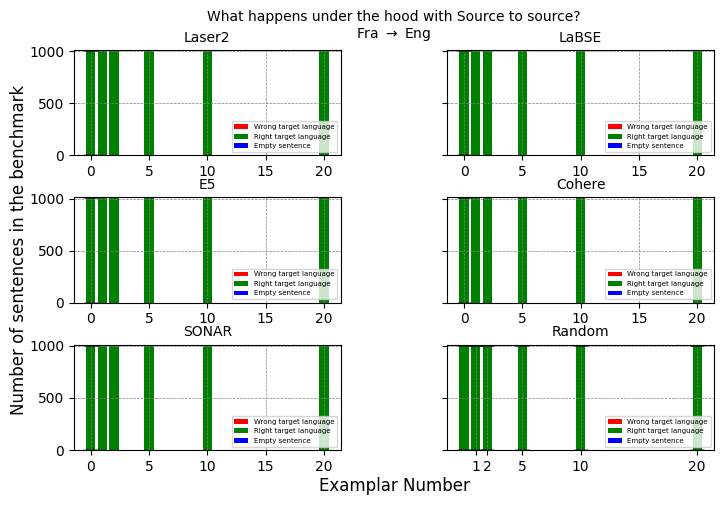

In [42]:
get_analysis(
    direction = direction,
    dico = d_full_5,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

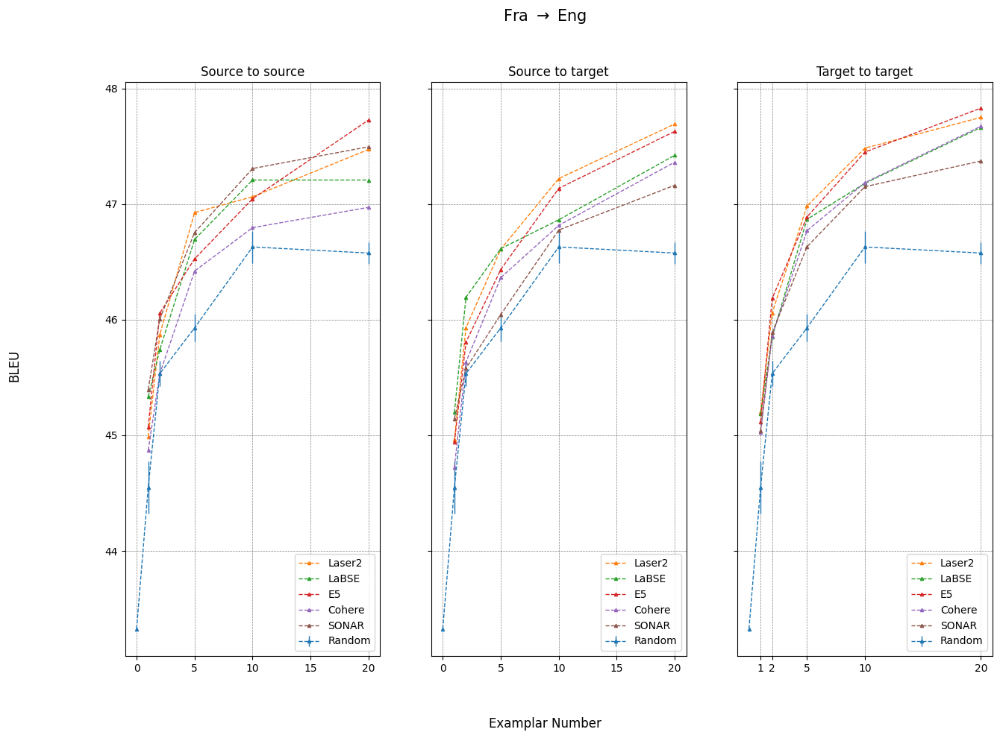

In [43]:
get_plots(
    direction, 
    d_bleu_5,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## German to English

In [44]:
direction = "Deu_to_Eng"
try :
    d_bleu_6 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_6 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_6, d_chrf_6 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_6, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_6, fout)

In [45]:
d_comet_6 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_6 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [46]:
d_full_6 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

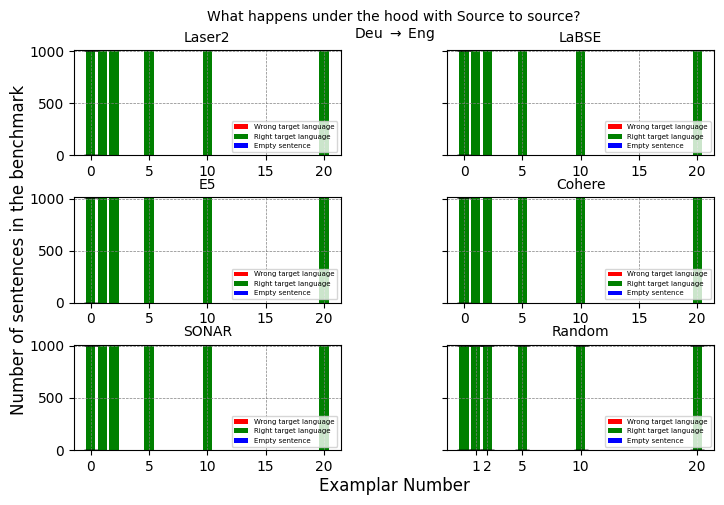

In [47]:
get_analysis(
    direction = direction,
    dico = d_full_6,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

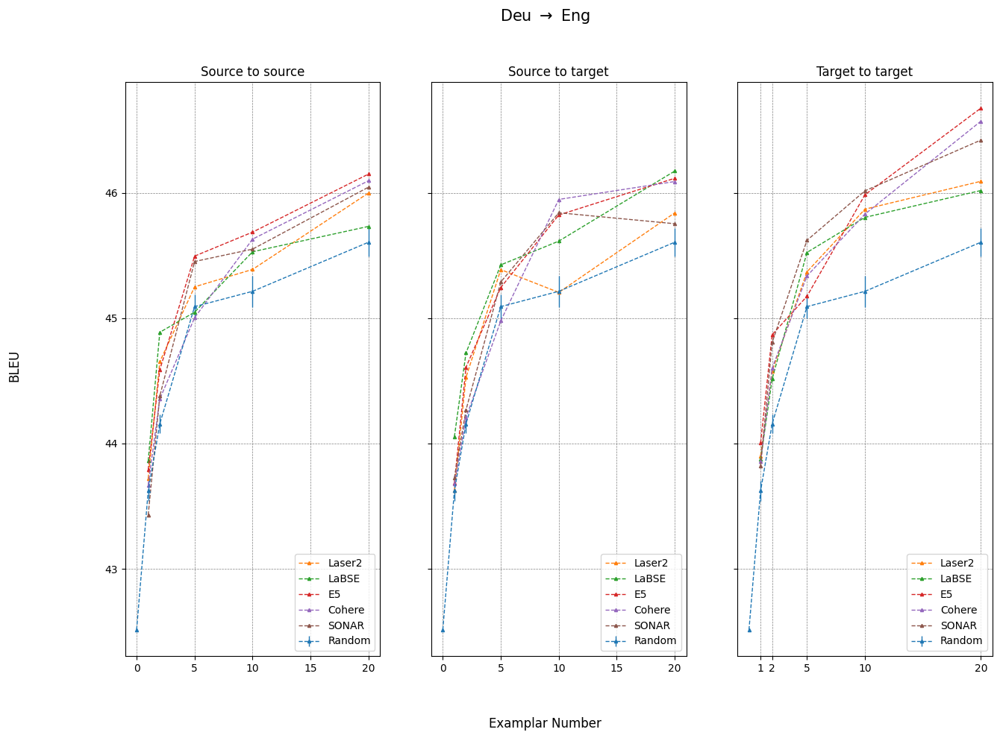

In [48]:
get_plots(
    direction, 
    d_bleu_6,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

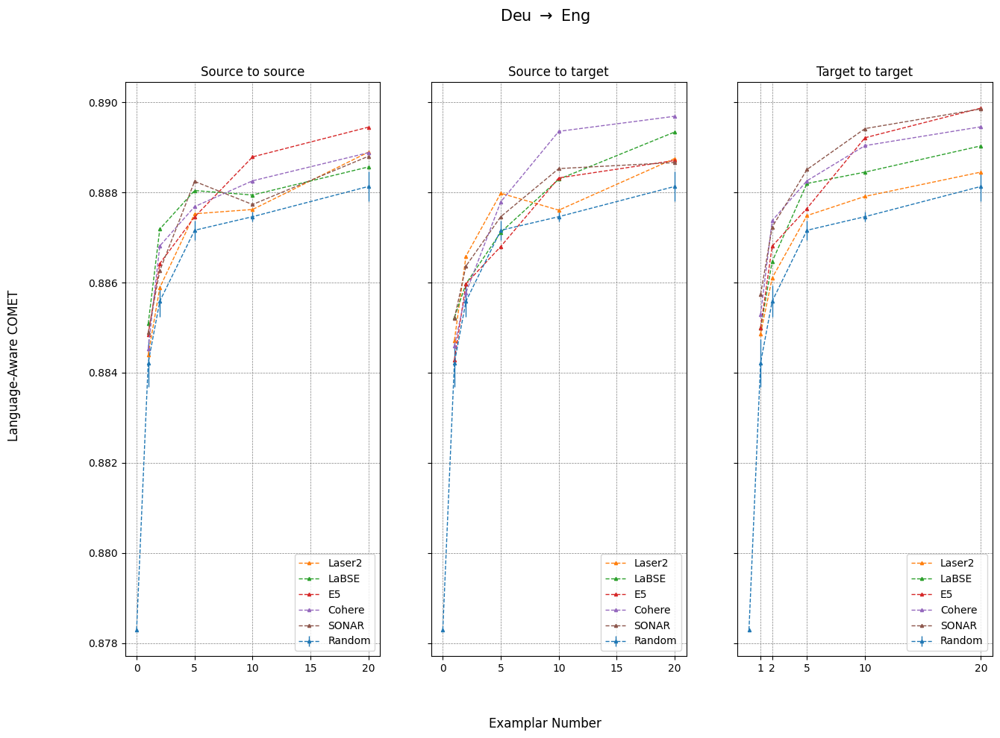

In [49]:
get_plots(
    direction, 
    d_lacomet_6,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Swahili to English

In [50]:
direction = "Swh_to_Eng"
try :
    d_bleu_7 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_7 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_7, d_chrf_7 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_7, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_7, fout)

In [51]:
d_comet_7 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_7 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [52]:
d_full_7 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

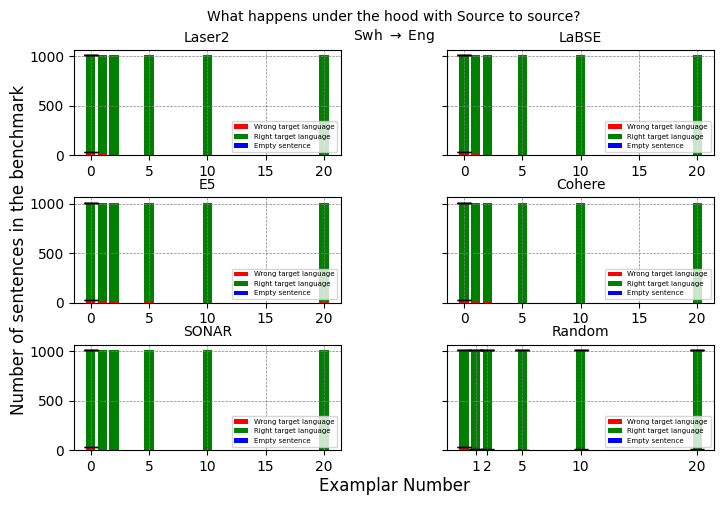

In [53]:
get_analysis(
    direction = direction,
    dico = d_full_7,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

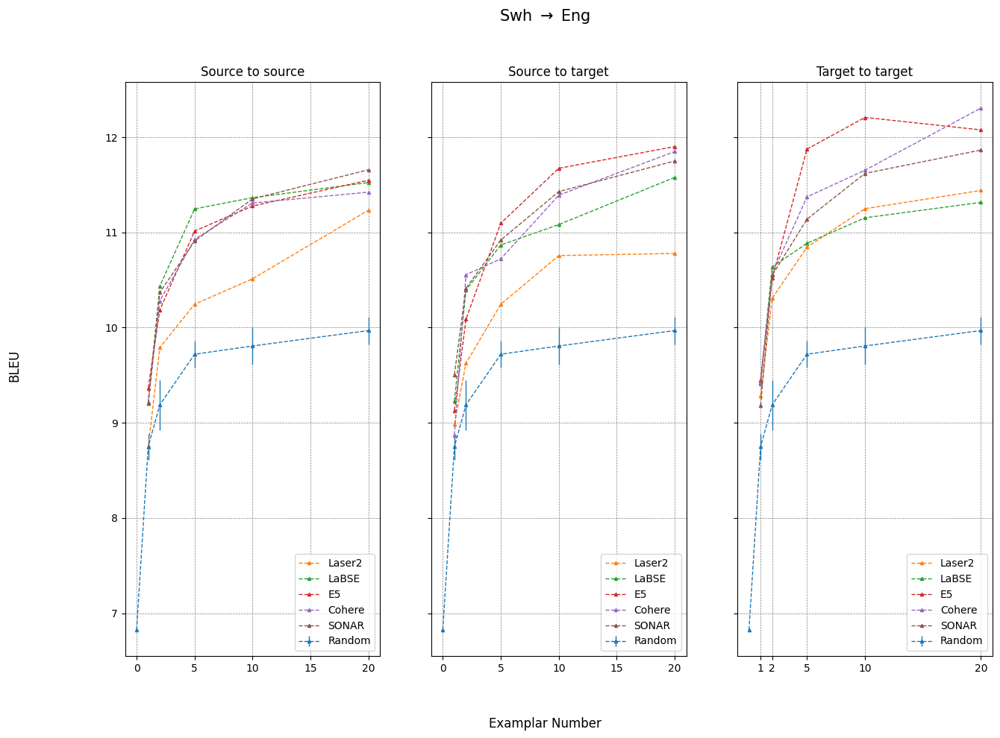

In [54]:
get_plots(
    direction, 
    d_bleu_7,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

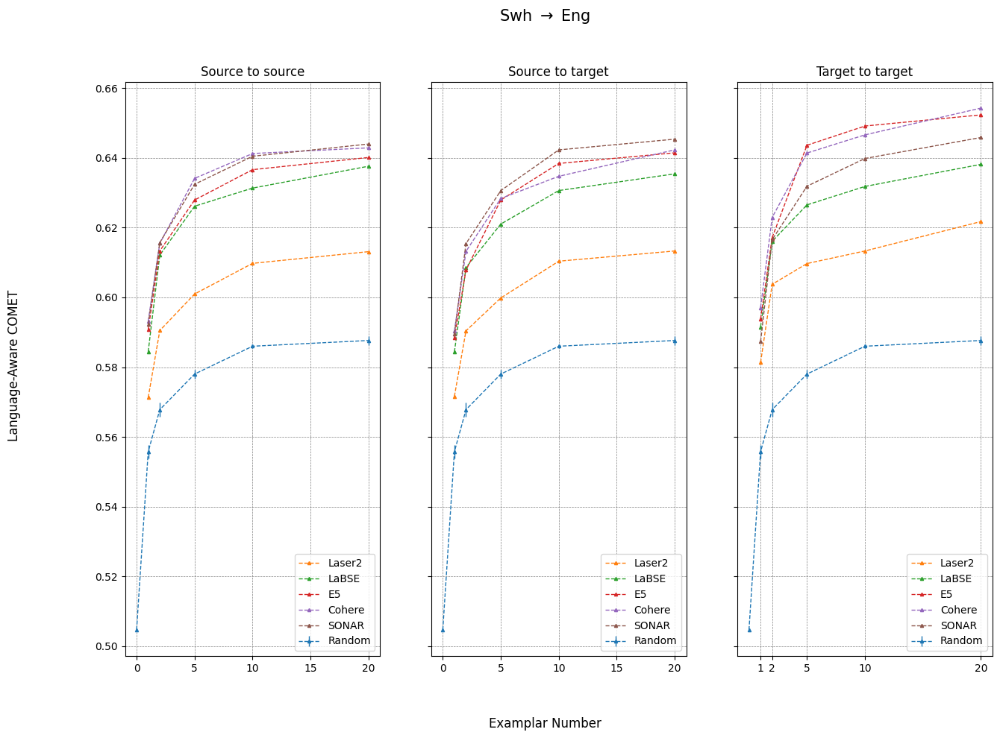

In [55]:
get_plots(
    direction, 
    d_lacomet_7,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

## Wolof to English

In [56]:
direction = "Wol_to_Eng"
try :
    d_bleu_8 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-7b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_8 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-7b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_8, d_chrf_8 = get_scores(
        direction,
        data_dir="./generations/llama-2-7b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-7b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_8, fout)
    with open(f"./generations/llama-2-7b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_8, fout)

In [57]:
d_comet_8 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_8 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-7b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [58]:
d_full_8 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-7b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

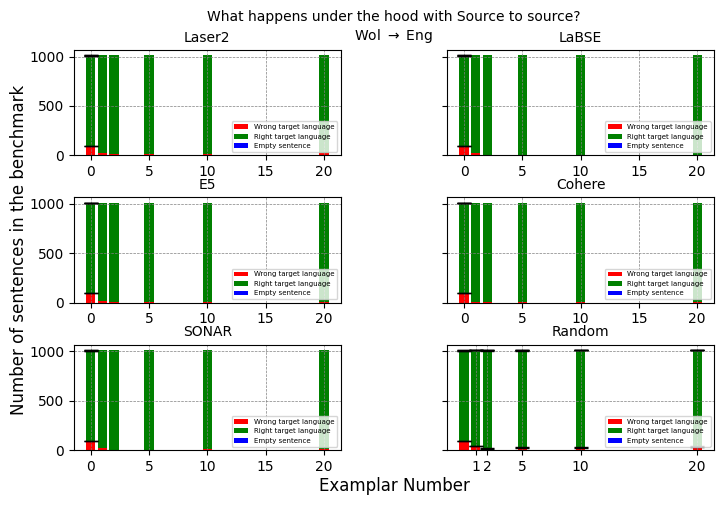

In [59]:
get_analysis(
    direction = direction,
    dico = d_full_8,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

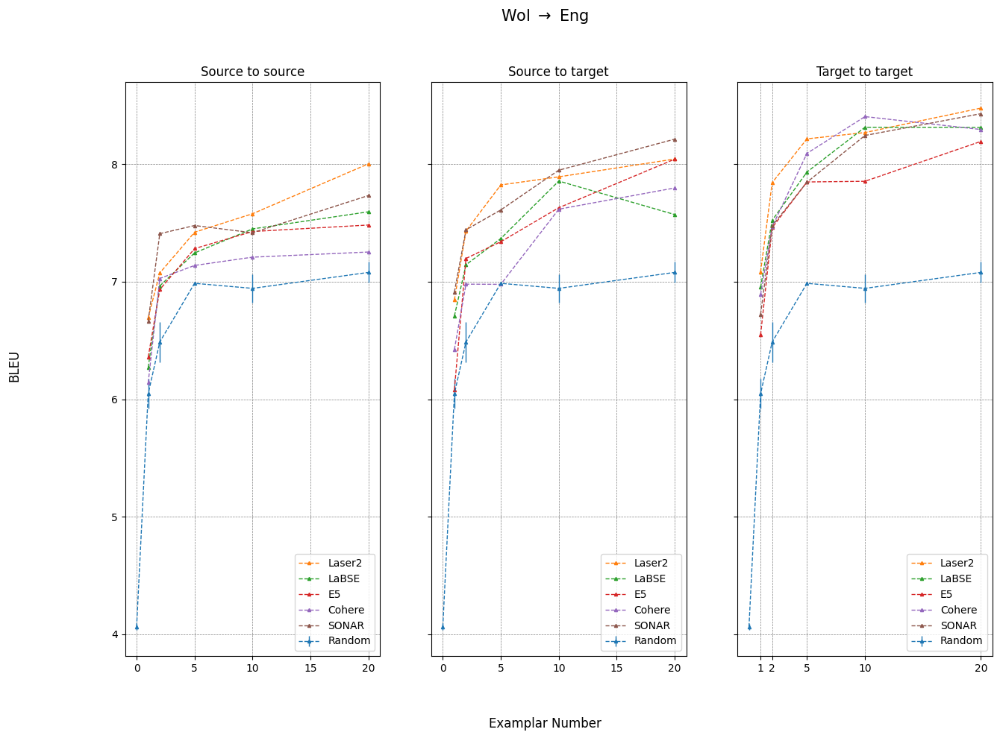

In [60]:
get_plots(
    direction, 
    d_bleu_8,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

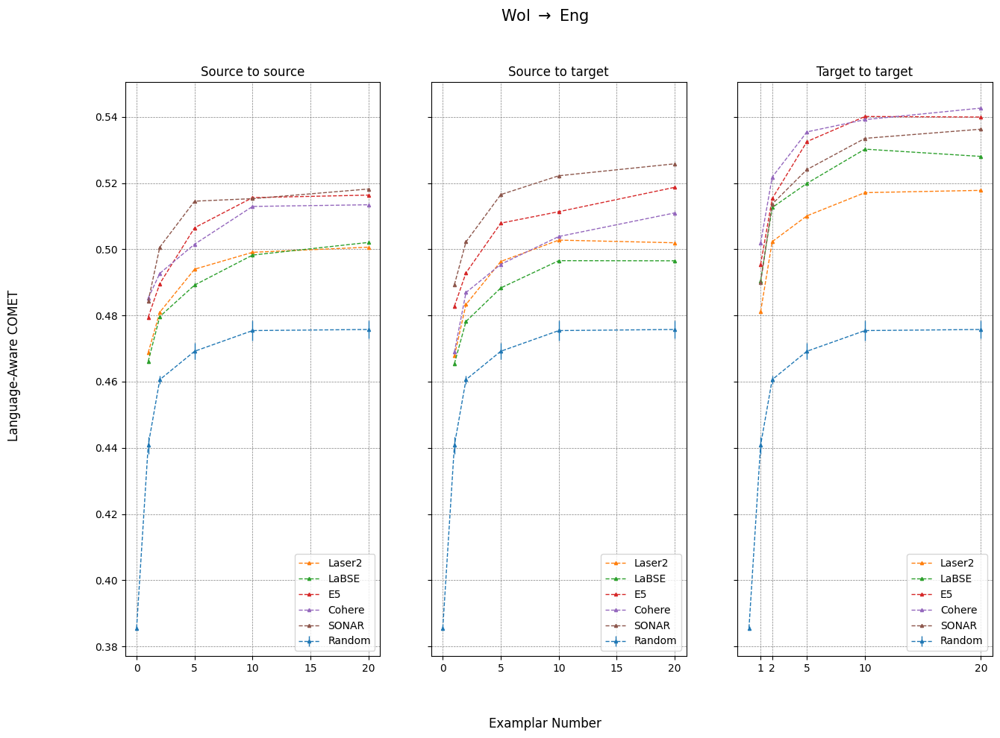

In [61]:
get_plots(
    direction, 
    d_lacomet_8,
    "Language-Aware COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

# Llama 2 13b

## English to French

### regular

In [92]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-13b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/llama-2-13b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [48]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [46]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-13b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

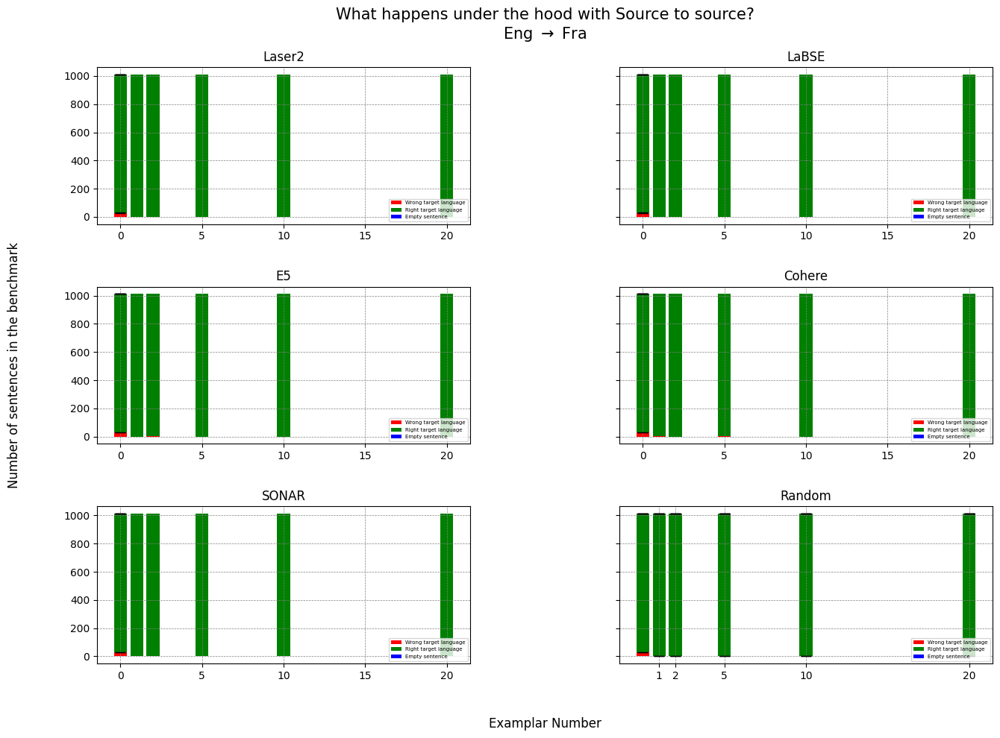

In [47]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

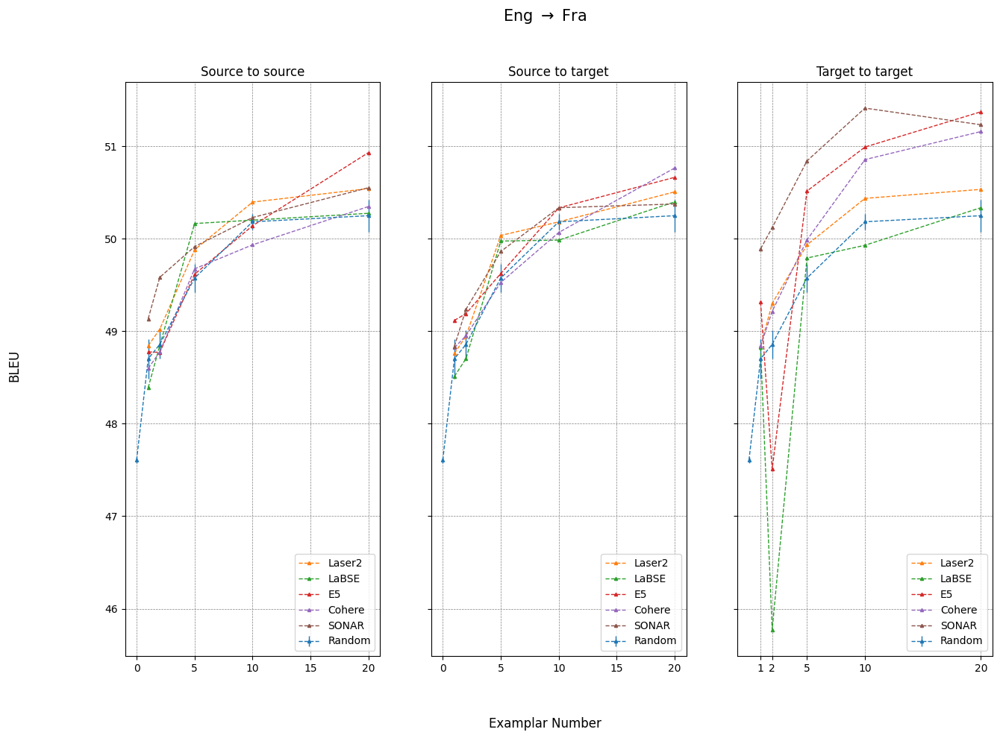

In [93]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

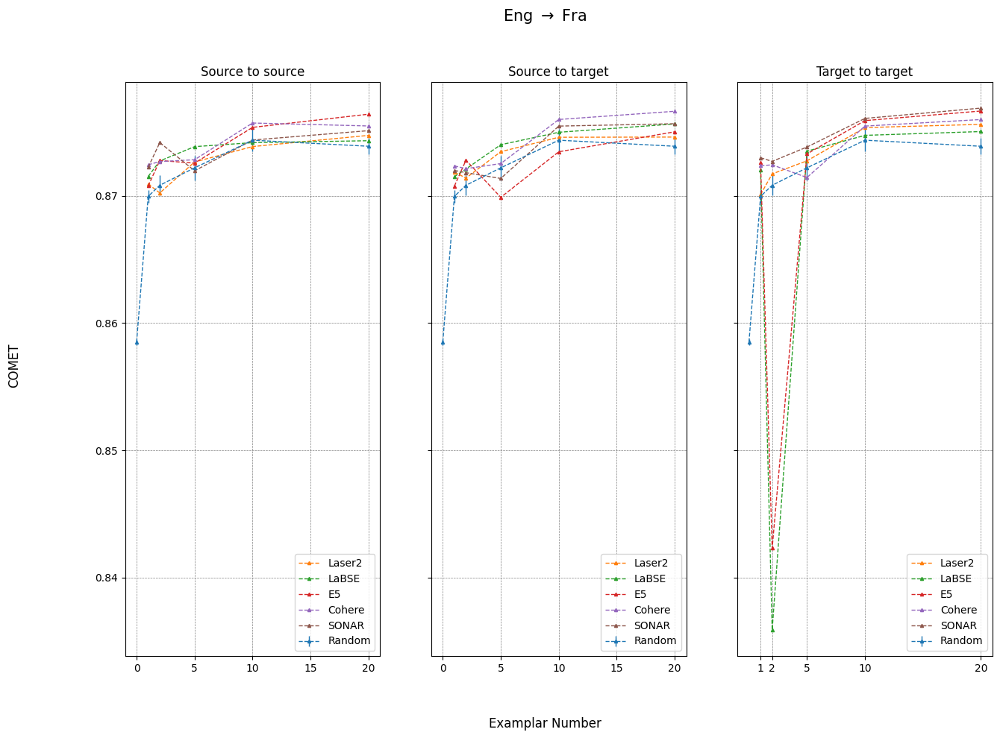

In [50]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

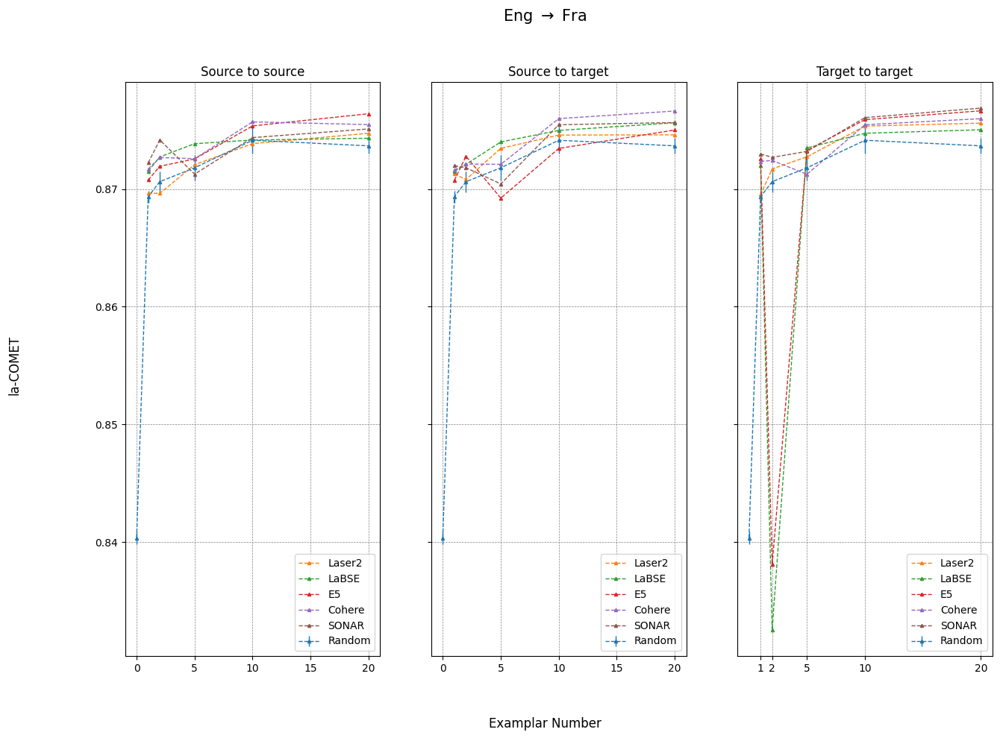

In [51]:
get_plots(
    direction, 
    d_lacomet_1,
    "la-COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [52]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-13b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-13b/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-13b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/llama-2-13b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [53]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_1['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [48.835174147525954, 46.08529147228817, 49.37273653067618, 50.174743856503575, 50.66618004925706]
BLEU: [49.06919548049904, 49.365430247910325, 49.715011402190555, 50.38271793989757, 50.48557911961848]
BLEU_pos: [48.61001089856875, 48.84970408694401, 49.853153371463364, 50.14443707626315, 50.670653078491924]
Rouge: [48.38825039043282, 48.84933462499228, 49.19255648362618, 49.82509195840021, 50.4408415403218]
Pos: [48.834007836798044, 49.11159485230838, 50.043839632902, 50.47821648008202, 50.5645477552275]
Grakel: [49.68478149736144, 49.49614265144294, 50.27291734694505, 50.343646203934235, 50.58678946828784]
SONAR: [49.135729278714514, 49.58328774275787, 49.91494110067698, 50.2297666857437, 50.5521383997527]
Random: [48.70199544821555, 48.85843902186671, 49.57516046247763, 50.18354106364063, 50.24932645872378]


## English to German

### Regular

In [54]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-13b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/llama-2-13b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [55]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-13b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [56]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-13b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-13b/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-13b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/llama-2-13b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [57]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_2['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [38.57030582240877, 38.35556609948479, 39.28162025838319, 39.90415716055994, 39.85449282765312]
BLEU: [38.33504755257537, 39.042228815844425, 39.07291260282501, 39.681298740681015, 40.219702746404344]
BLEU_pos: [38.14295778490277, 38.685560205242375, 39.204170022336704, 39.60414320924009, 39.48409726944821]
Rouge: [38.61419738424434, 38.94378445006669, 39.12160166381693, 39.60687433498545, 39.97590559426301]
Pos: [38.604188947336425, 38.59815050904276, 39.678329320851674, 39.599934608795, 39.91582911407365]
Grakel: [38.542906401853045, 37.93088190325713, 39.63238294505418, 39.87068961963705, 39.67396538697142]
SONAR: [38.49351747556187, 38.8591249217974, 38.955281000968625, 39.58308664395061, 40.075544769021256]
Random: [38.02533347323388, 38.78052952363199, 38.98520338890503, 39.440125683388054, 39.56707876405107]


In [58]:
d_nb_2["Random"] = d_bleu_2["Random"]

In [ ]:
get_plots(
    direction, 
    d_nb_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"],
    with_zero_shot=True
)

## English to Swahili

### Regular

In [45]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-13b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/llama-2-13b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [ ]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/africomet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-13b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

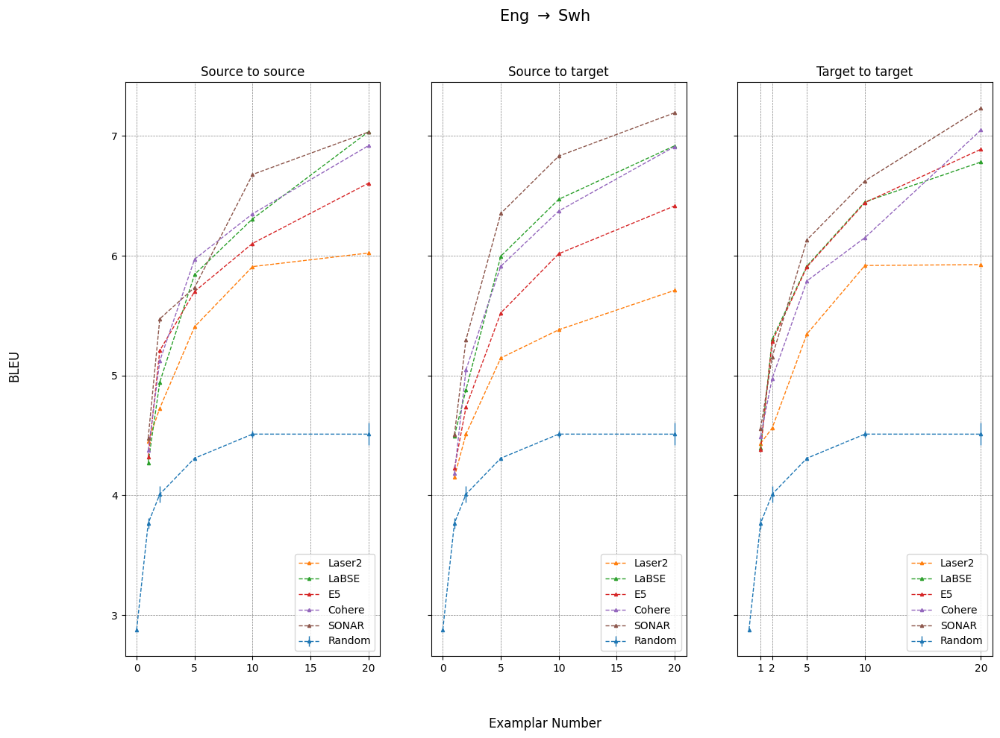

In [91]:
get_plots(
    direction,
    d_bleu_3,
    "BLEU",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction,
    d_comet_3,
    "AFRICOMET",
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [46]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-13b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-13b/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-13b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/llama-2-13b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [47]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_3['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [4.522487439539972, 5.309069685849508, 5.99540832406526, 6.631972655307956, 7.0491489271575345]
BLEU: [4.61685987650202, 5.234742140385526, 5.691100118097923, 6.35211768800017, 6.477421449985773]
BLEU_pos: [3.933758109725796, 4.19740129023725, 4.588171367664152, 4.9168370439017215, 4.906295029333113]
Rouge: [4.109063322155875, 4.3675865929159565, 5.177758141978344, 5.602757589242534, 6.050846019600462]
Pos: [3.830940530144057, 4.313206539296785, 4.487238923650409, 4.759503505257342, 4.972514136037531]
Grakel: [3.6545892086828218, 3.870572793835134, 4.1768590693941485, 4.56117778957739, 4.673101009790885]
SONAR: [4.478459214319849, 5.473967643638674, 5.735525030662596, 6.67917694657813, 7.033344379894413]
Random: [3.766601445973439, 4.009423144270893, 4.309943706364983, 4.511148412520875, 4.510857099568007]


## English to Wolof

### Regular

In [63]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/llama-2-13b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/llama-2-13b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/llama-2-13b/africomet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/llama-2-13b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [64]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/llama-2-13b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/llama-2-13b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/llama-2-13b/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/llama-2-13b/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/llama-2-13b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/llama-2-13b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/llama-2-13b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [65]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_4['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [2.170246827507821, 2.5880783973729162, 2.8707602880509233, 3.1769655141024202, 3.251321175715602]
BLEU: [2.0929421831937858, 2.540630022945696, 2.726176042758441, 2.982325125342734, 3.2263416592720646]
BLEU_pos: [2.1698812033130377, 2.5171400424762687, 2.4721355047907783, 2.626491037509283, 2.8166892678155007]
Rouge: [1.7849992739186422, 2.237717289789407, 2.8644640919533404, 2.8998442632077044, 3.026346593080757]
Pos: [2.213010088525813, 2.2214131035275515, 2.44438249889713, 2.9350774204401366, 2.996210146985087]
Grakel: [1.695632833070334, 1.9915766809362465, 2.2613772643529315, 2.43375596460471, 2.551336264830703]
SONAR: [2.575189868910786, 3.0114848377141317, 3.217647823548431, 3.282880880227645, 3.5718563509579013]
Random: [1.6855415073731284, 1.872412918246357, 1.974659029950521, 2.179762752625401, 2.459860421390467]


## French to English

# Gemma 7B

## English to French

### Regular

In [81]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/gemma",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/gemma/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [ ]:
print_dico(d_bleu_1)

In [126]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

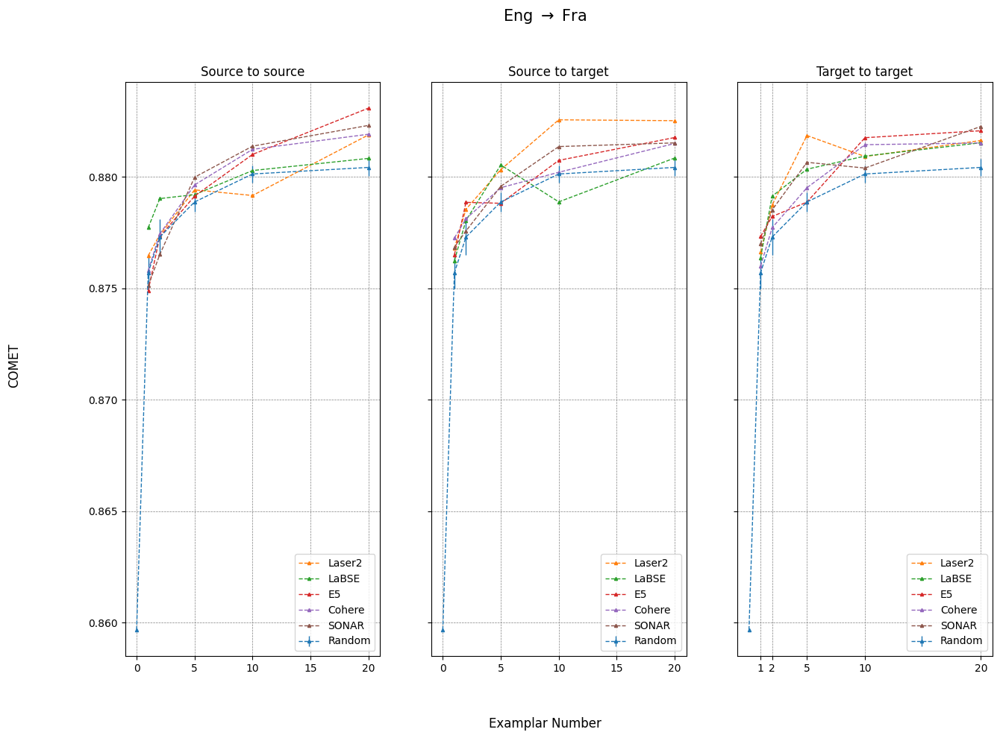

In [127]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

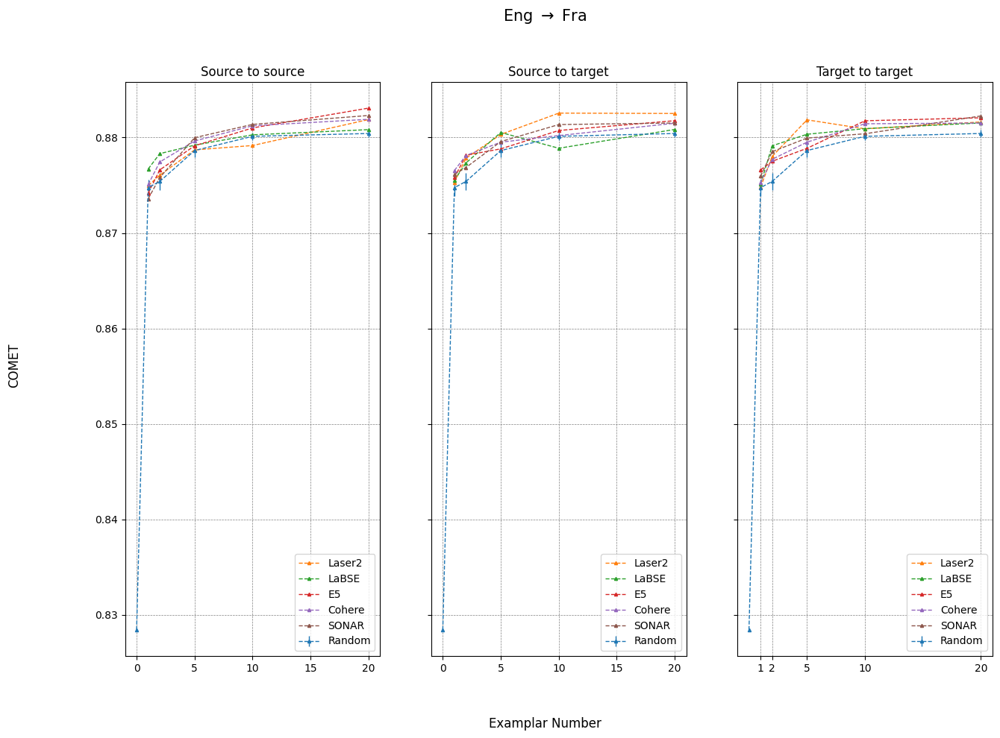

In [128]:
get_plots(
    direction, 
    d_lacomet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [121]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [122]:
direction = "Eng_to_Fra"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/gemma/ablations/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [123]:
K = [1, 5, 10]
#K = [1]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
for k in K :
    for d in L :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]

In [124]:
dico = full

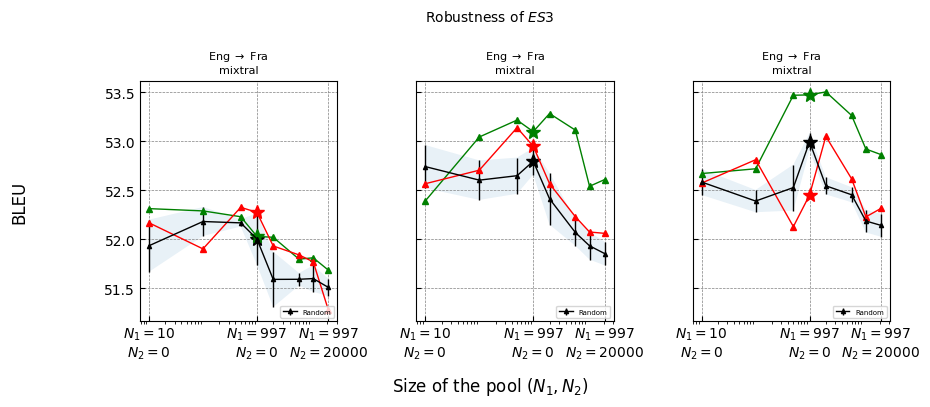

In [125]:
metric = "BLEU"
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["green", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    figsize=(10, 4)
)

plt.subplots_adjust(
    left=0.15,
    bottom=0.2, 
    #right=0.9, 
    top=0.8, 
    wspace=0.4, 
    #hspace=0.4
)

f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supylabel(f"{metric}")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        [dico[k]["Random"][3]['mean']],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            dico[k][method_of_interest], 
            linewidth=1.0, 
            marker="^", 
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            [dico[k][method_of_interest][3]],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"{source} $\\rightarrow$ {target}\n{name}", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        #rotation = 90
    )
    ax[i].tick_params(direction = "in")

f.suptitle(f"Robustness of $ES3$", fontsize=10)
plt.show()

### ngram

In [30]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/gemma/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/gemma/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/gemma/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/gemma/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [33]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_1['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [52.29570143747623, 52.830779424485726, 52.94752215507827, 52.54416258399424, 53.48656013557105]
BLEU: [52.73699395295664, 52.7955390695111, 53.333380666220556, 53.184186948839596, 53.61903508225575]
BLEU_pos: [52.023430433906555, 52.362949673709466, 53.00639591352683, 53.23375595155836, 53.211195480123884]
Rouge: [52.32207061142493, 52.56141592299142, 52.98167910898564, 52.94203175623821, 53.27940515629806]
Pos: [51.761051208984476, 52.311277809039275, 52.807698691806685, 53.030588691897975, 53.40653354532216]
Grakel: [52.71213641698783, 53.13410948260475, 53.20242960713182, 53.2087285389056, 53.280117179763366]
SONAR: [52.23576596696338, 52.423110453465306, 53.09626600133604, 53.470977847348315, 53.504064573060546]
Random: [52.001492760772955, 52.10120698920602, 52.7940862216309, 53.044320859959804, 53.10667211653651]


## English to German

### Regular

In [83]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/gemma",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/gemma/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
print_dico(d_bleu_2)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/africomet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_2,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [34]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/gemma/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/gemma/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/gemma/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/gemma/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [36]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_2['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [41.55507353050015, 42.400495826946646, 42.673636331424454, 42.58367073130105, 42.744460385624144]
BLEU: [42.27355568317541, 42.031351397169736, 42.64128376736109, 42.93917634231685, 42.89815093364945]
BLEU_pos: [42.06181106490672, 42.06044720425125, 42.57030004233702, 42.77854449013354, 42.68472843736884]
Rouge: [41.494478758509246, 41.78791893256312, 42.629152750692135, 42.5004573283667, 42.834249860362824]
Pos: [42.00742728201521, 42.40459537420116, 42.683806335639964, 42.60942506353368, 43.130796650746]
Grakel: [42.2435226211506, 42.441234301017474, 42.611047139753616, 42.520614219523985, 42.64133667919953]
SONAR: [41.842838125069385, 42.48528286005482, 42.79278370825511, 43.275105688177895, 43.03062325062497]
Random: [41.80329434609573, 42.486971928848995, 42.352743534999206, 42.45148782882395, 42.88278949649384]


## English to Swahili

### Regular

In [39]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/gemma",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/gemma/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [ ]:
print_dico(d_bleu_3)

In [130]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

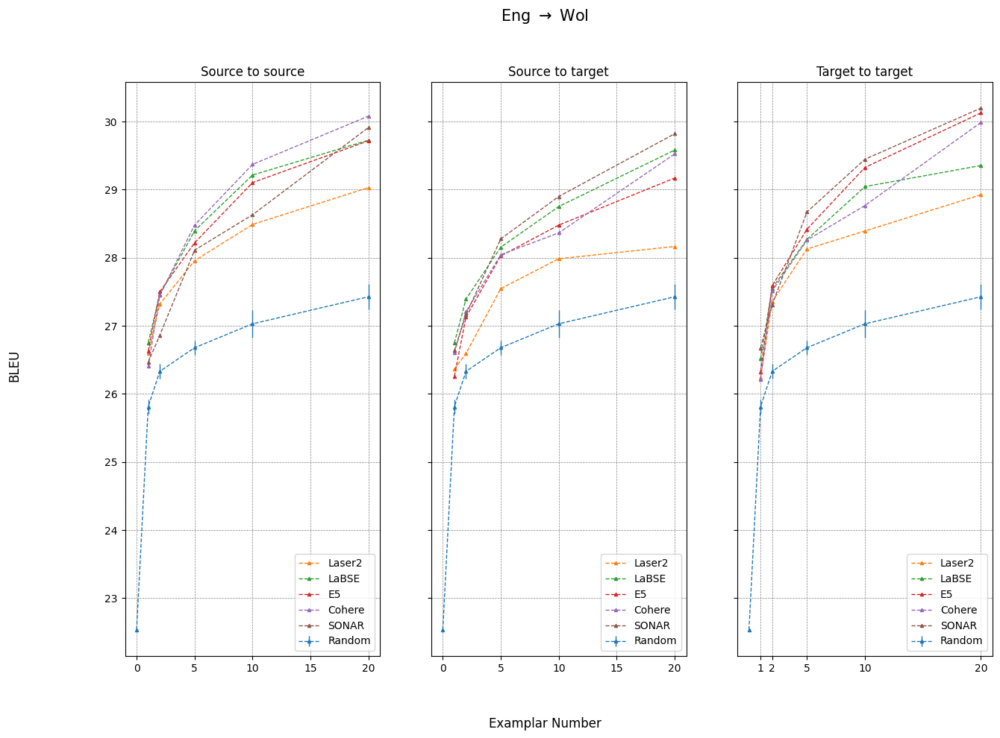

In [89]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

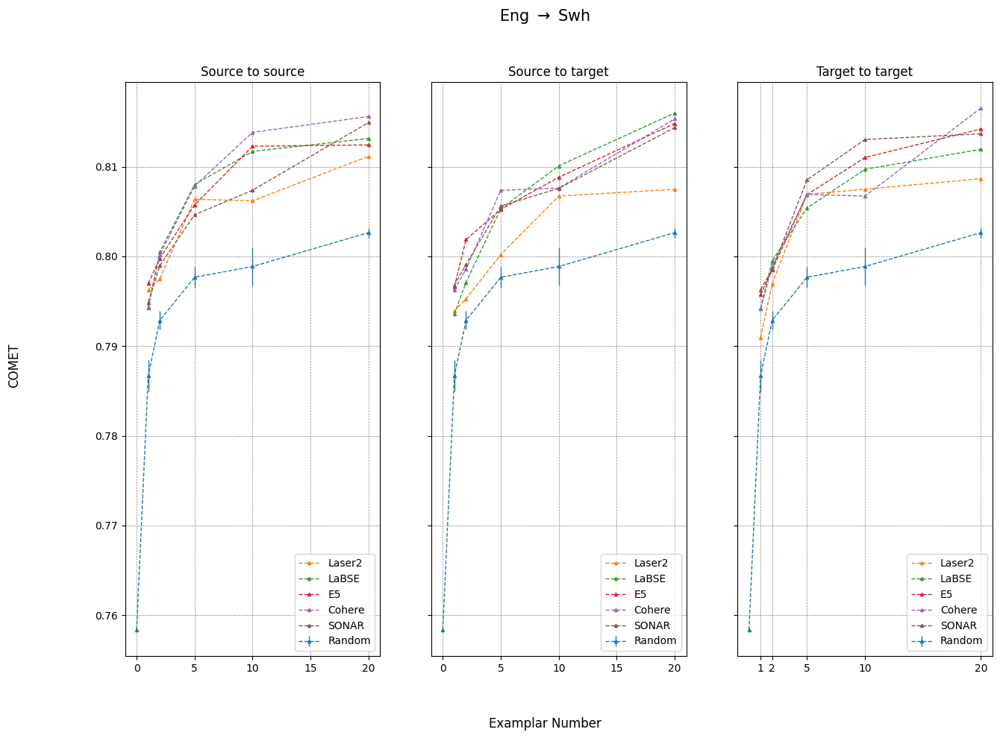

In [131]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

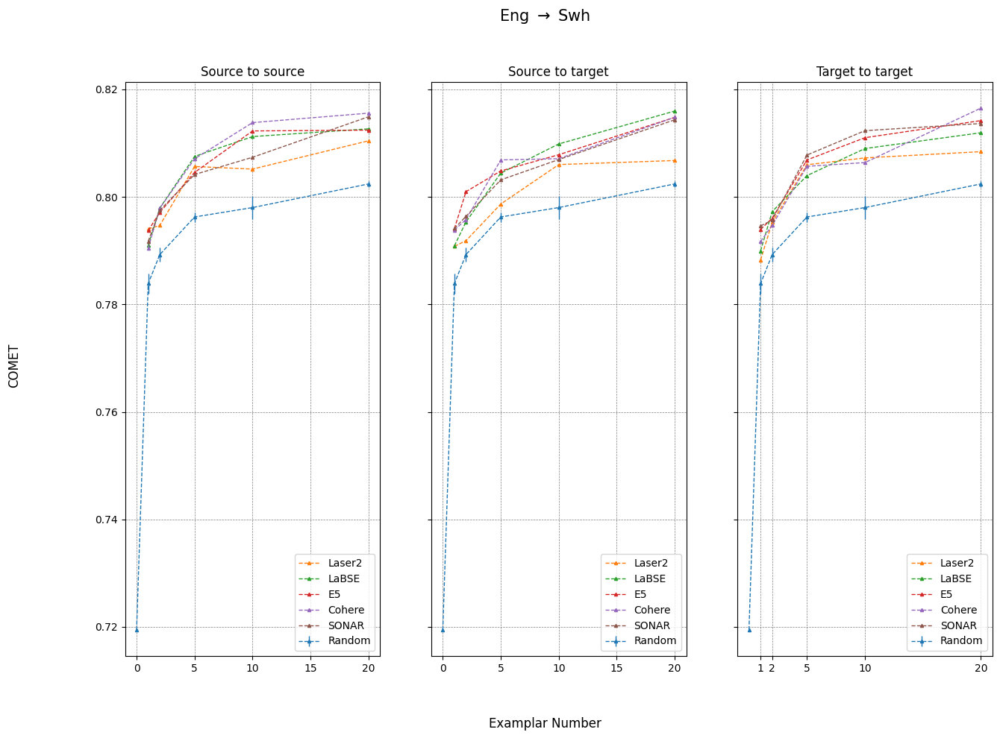

In [132]:
get_plots(
    direction, 
    d_lacomet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [41]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [42]:
direction = "Eng_to_Swh"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/gemma/ablations/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [43]:
L2 = []
for size in S :
    d = load_scores(
        direction = direction,
        score = "COMET",
        data_dir=f"./generations/gemma/ablations/{size}/comet_scores",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L2.append(d)

In [26]:
zs = load_scores(
    direction = direction,
    score = "BLEU",
    data_dir = f"./generations/gemma/bleu_scores",
    methods=["Random"]
)
zs_mean, zs_std = zs["Random"]["s2s"][0]["mean"], zs["Random"]["s2s"][0]["std"]

In [45]:
K = [1, 5, 10]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
full2 = {k : {} for k in K}
for k in K :
    for i, d in enumerate(L) :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
                full2[k][method].append(L2[i][method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]
                full2[k][method] = [L2[i][method]["s2s"][k]]

In [51]:
dico, metric = full2, "COMET"

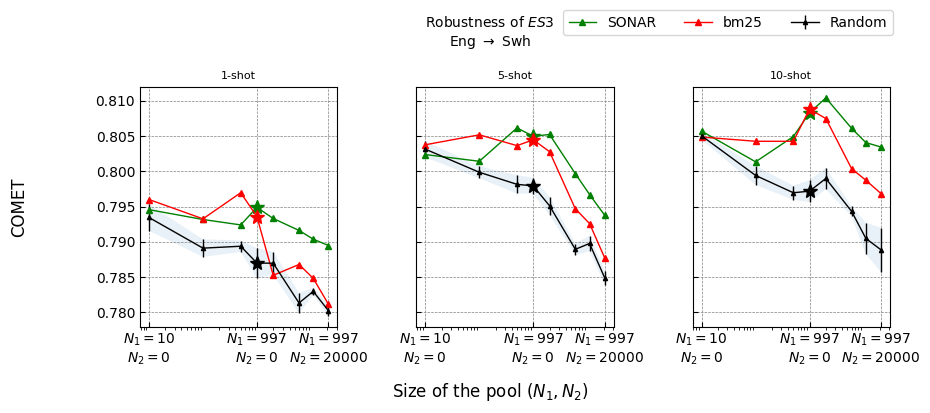

In [65]:
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["green", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    figsize=(10, 4)
)

plt.subplots_adjust(
    left=0.15,
    bottom=0.2, 
    #right=0.9, 
    top=0.8, 
    wspace=0.4, 
    #hspace=0.4
)

f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supylabel(f"{metric}")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        [dico[k]["Random"][3]['mean']],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            dico[k][method_of_interest], 
            linewidth=1.0, 
            marker="^",
            label=method_of_interest,
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            [dico[k][method_of_interest][3]],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"{k}-shot", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    #ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        #rotation = 90
    )

    ax[i].tick_params(direction = "in")

lines, labels = ax[0].get_legend_handles_labels()
plt.legend(handles=lines, labels=labels, bbox_to_anchor=[1.05, 1.35], ncol=len(K))

f.suptitle(f"Robustness of $ES3$\n{source} $\\rightarrow$ {target}", fontsize=10)
plt.show()

### ngram

In [40]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/gemma/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/gemma/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/gemma/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/gemma/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [41]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_3['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [26.83167673591794, 27.114546013722645, 28.36192667689069, 29.184655219657174, 29.917578246769025]
BLEU: [26.638957272047808, 27.18172771580609, 28.08348130250071, 28.597900196874132, 29.28819014673256]
BLEU_pos: [25.830043347846267, 26.37448396177499, 26.939735146793502, 27.270489539503583, 28.29325748799026]
Rouge: [26.07587619708146, 26.854660541216887, 27.78150016541487, 27.84967720371123, 28.447058347181066]
Pos: [26.089186662462087, 26.59181804961165, 27.045202122827668, 27.195764863154018, 27.918075065158593]
Grakel: [25.9750725330239, 26.52613591332477, 26.693367541368904, 27.31108717864175, 27.807298112819392]
SONAR: [26.46415612937985, 26.86210152519379, 28.11114118240194, 28.631178024518203, 29.913690433066233]
Random: [25.812062789770945, 26.330932513479798, 26.678498819950892, 27.029517146523006, 27.42670496749224]


## English to Wolof

### Regular

In [87]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/gemma",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/gemma/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
print_dico(d_bleu_4)

In [136]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)
d_lacomet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [137]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

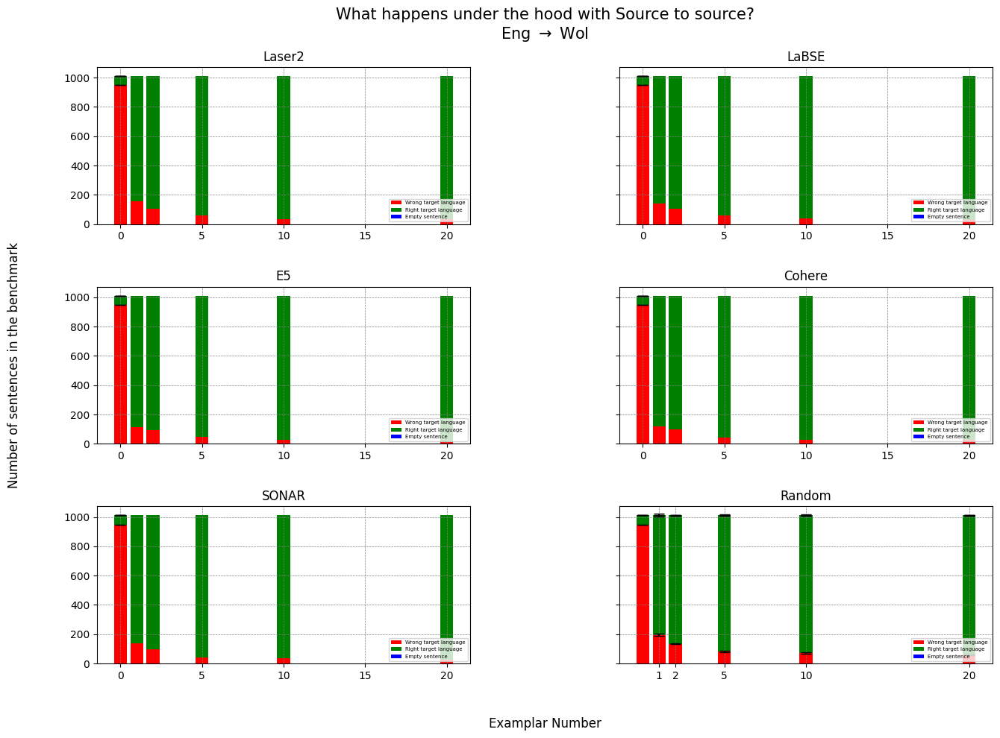

In [138]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

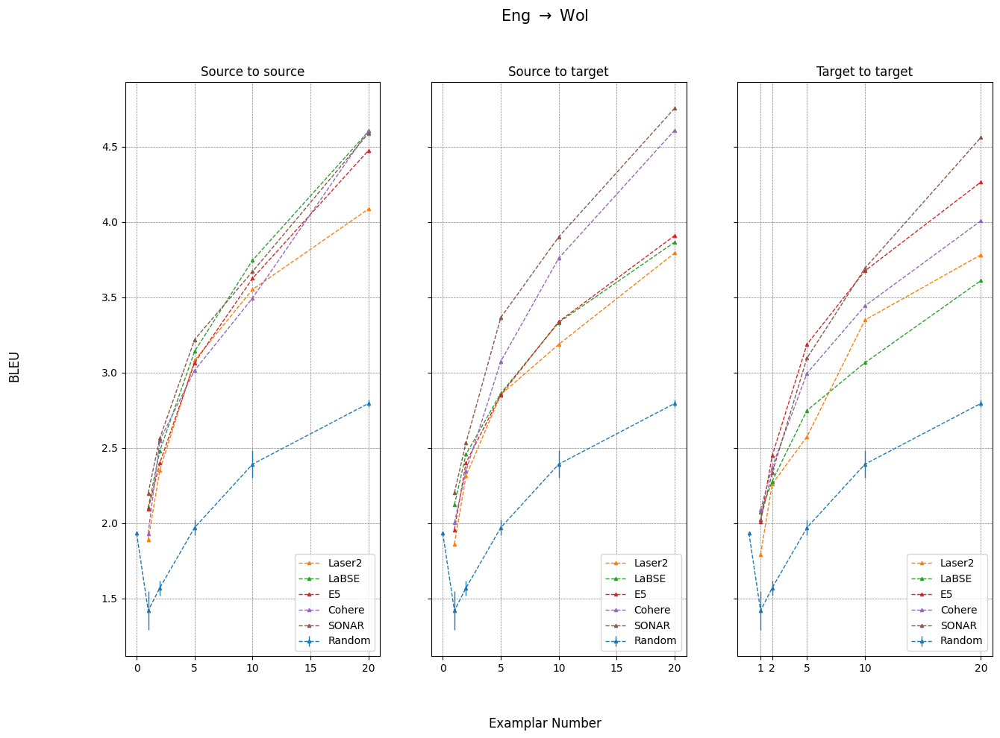

In [139]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

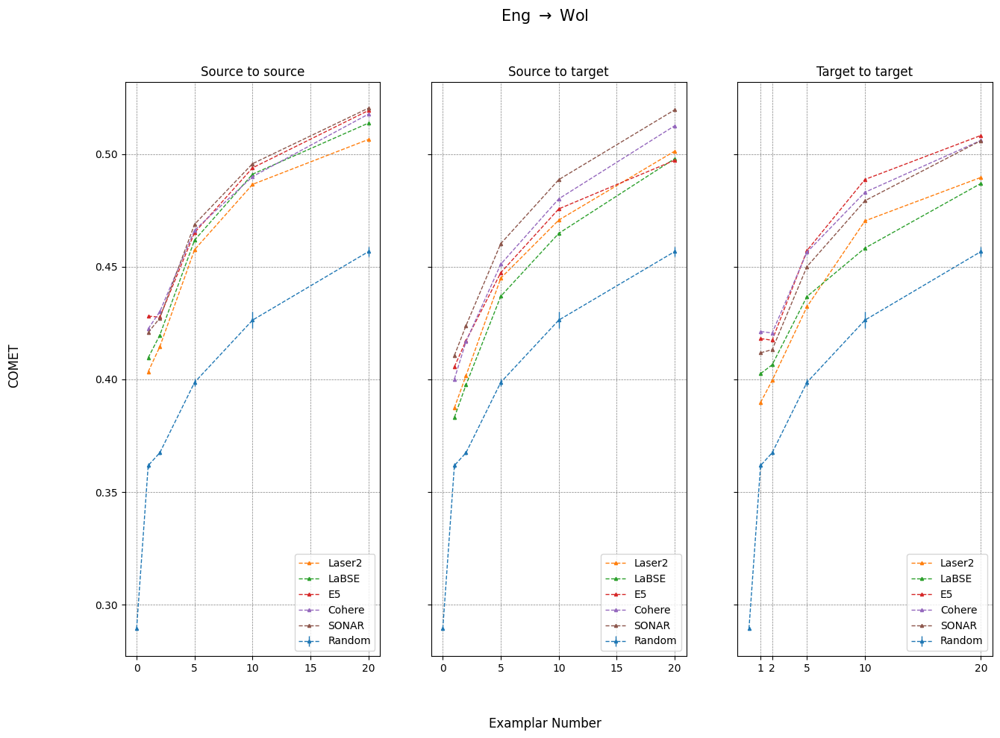

In [141]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

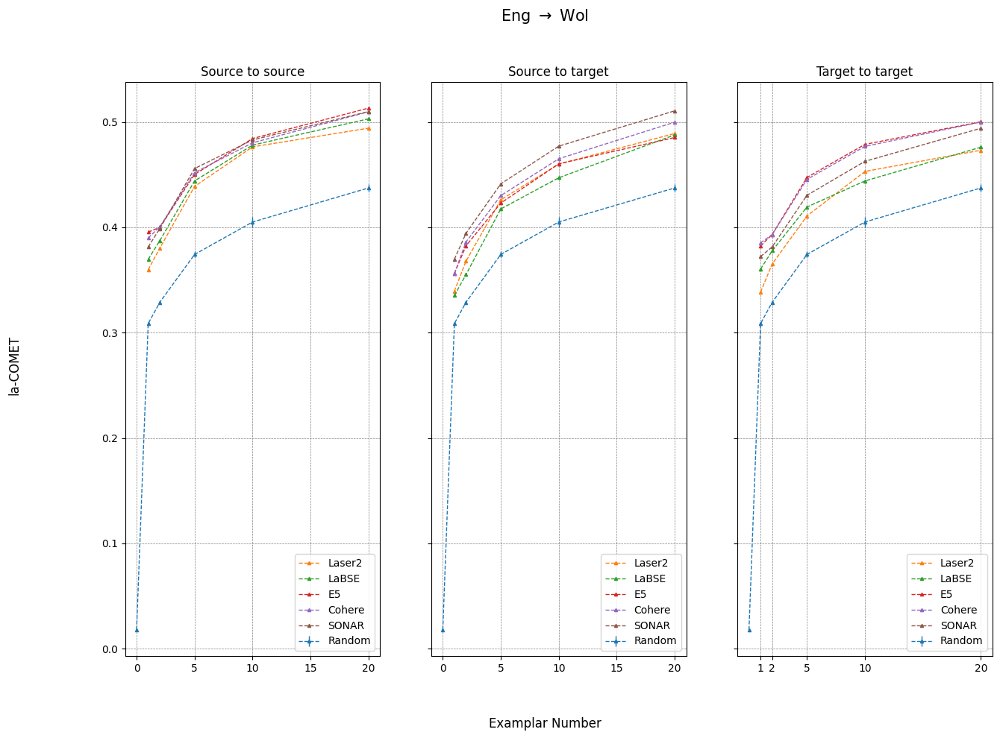

In [142]:
get_plots(
    direction, 
    d_lacomet_4,
    "la-COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [41]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/gemma/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/gemma/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/gemma/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/gemma/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [42]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
print(f"Random: {[d_bleu_4['Random']['s2s'][k]['mean'] for k in [1, 2, 5, 10, 20]]}")

bm25: [1.8058323234609364, 2.2038377516209082, 2.9392956168017492, 3.517143890993935, 4.470593615058917]
BLEU: [1.831596829478313, 2.0974180681487318, 2.7048409296183658, 3.1964067497403312, 4.04934193455273]
BLEU_pos: [1.6514785831423422, 1.9707759939912748, 2.2166089853951356, 2.6073240118795344, 3.2325534000514793]
Rouge: [1.7226516208450582, 2.066574734922298, 2.4024539556549707, 3.081629237751558, 3.8700241844982957]
Pos: [1.9053959970396135, 1.9305742749550536, 2.55042667397388, 2.8910064506006736, 3.369650957537661]
Grakel: [1.539159980723682, 1.9973161491494182, 2.3784592206130934, 2.6728433491680206, 3.095177994785959]
SONAR: [2.199763426091087, 2.5645765125640922, 3.2198310384348243, 3.6717986838799206, 4.590415384949309]
Random: [1.419664502275569, 1.5703333461491986, 1.9711146528146548, 2.3923801057028506, 2.795993791846635]


# Gemma 2B

## English to French

### Regular

In [157]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/gemma-2b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma-2b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/gemma-2b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [ ]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma-2b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [44]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma-2b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

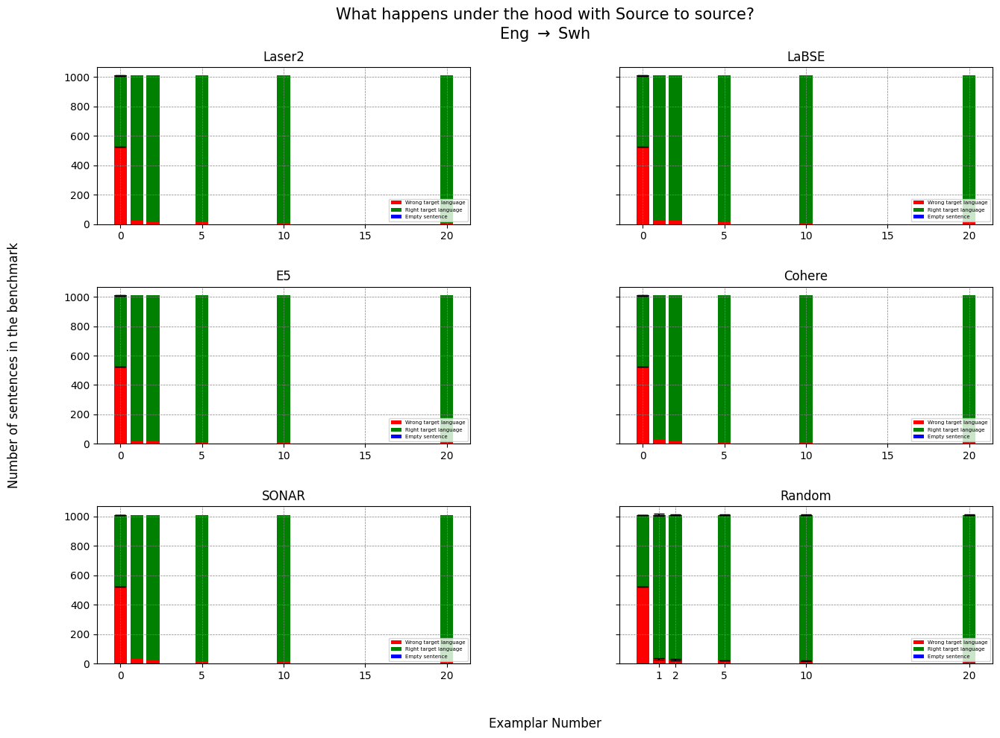

In [45]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

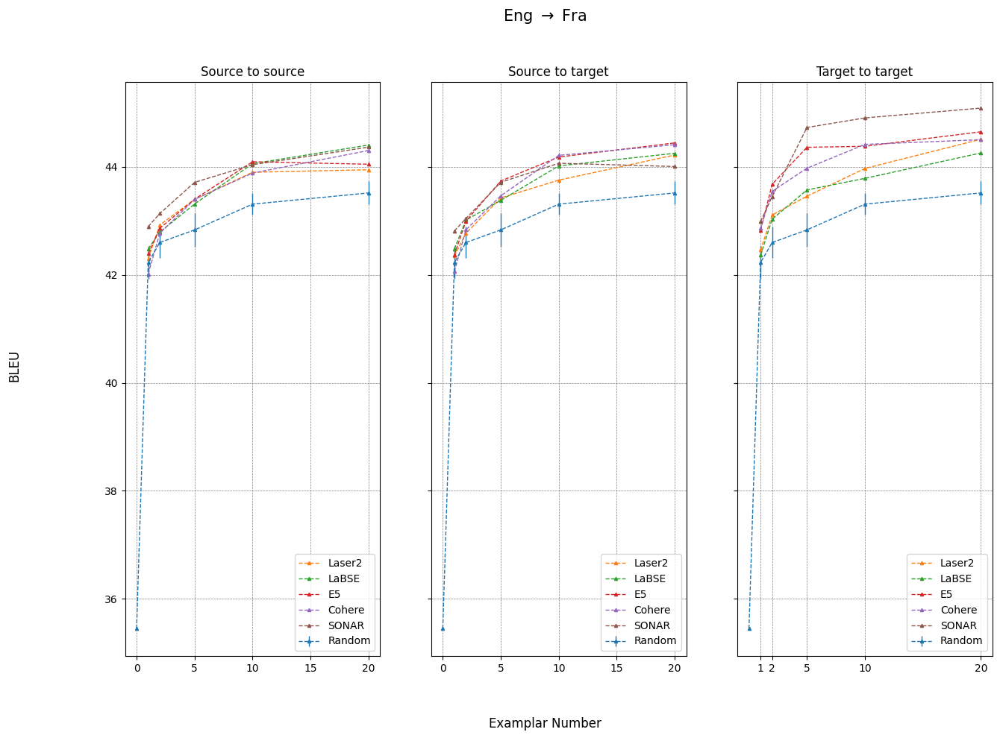

In [97]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

In [1]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [15]:
direction = "Eng_to_Fra"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/gemma-2b/ablations/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [16]:
K = [1, 5, 10]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
for k in K :
    for d in L :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]

In [17]:
dico = full

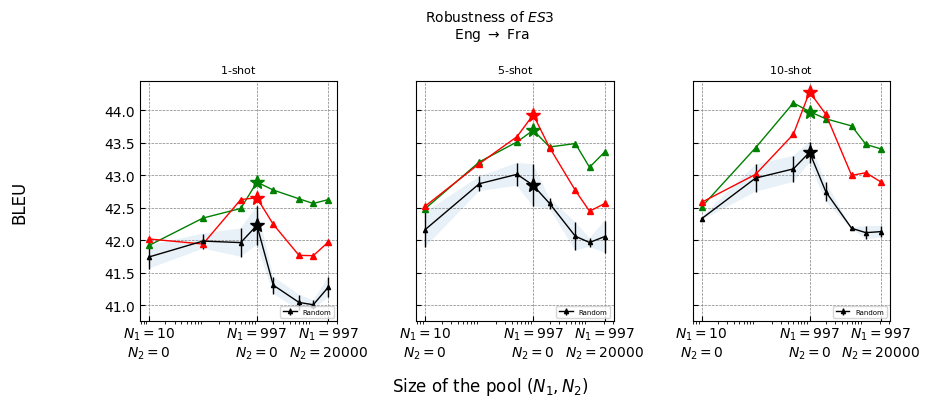

In [23]:
metric = "BLEU"
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["green", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    figsize=(10, 4)
)

plt.subplots_adjust(
    left=0.15,
    bottom=0.2, 
    #right=0.9, 
    top=0.8, 
    wspace=0.4, 
    #hspace=0.4
)

f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supylabel(f"{metric}")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        [dico[k]["Random"][3]['mean']],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            dico[k][method_of_interest], 
            linewidth=1.0, 
            marker="^", 
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            [dico[k][method_of_interest][3]],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"${k}$-shot", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        #rotation = 90
    )
    ax[i].tick_params(direction = "in")

f.suptitle(f"Robustness of $ES3$\n {source} $\\rightarrow$ {target}", fontsize=10)
plt.show()

### ngram

In [48]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/gemma-2b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma-2b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/gemma-2b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [49]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [42.65386807130826, 43.273967319606065, 43.93276726631639, 44.28320126775745, 44.425709935557535]
BLEU: [42.69606794622717, 42.97273176139924, 43.49250076914586, 43.91630104095644, 43.94467216684516]
BLEU_pos: [42.13514082266586, 42.761494984846955, 43.185102293958664, 43.46782953014825, 43.72375156764454]
Rouge: [41.72609274422745, 42.265111398207345, 43.33440071875652, 43.513412570374236, 44.163944918618355]
Pos: [41.97187535736057, 42.52139664645283, 43.11577416672142, 43.67658560339166, 44.000052845573514]
Grakel: [42.35701889652307, 43.35962413185782, 43.66437469891994, 43.82275721207784, 43.7865683157968]
SONAR: [42.89523788348068, 43.13655774113904, 43.71436397072389, 44.04123224755283, 44.36645669889416]


## English to German

### Regular

In [32]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/gemma-2b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma-2b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/gemma-2b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma-2b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [99]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma-2b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

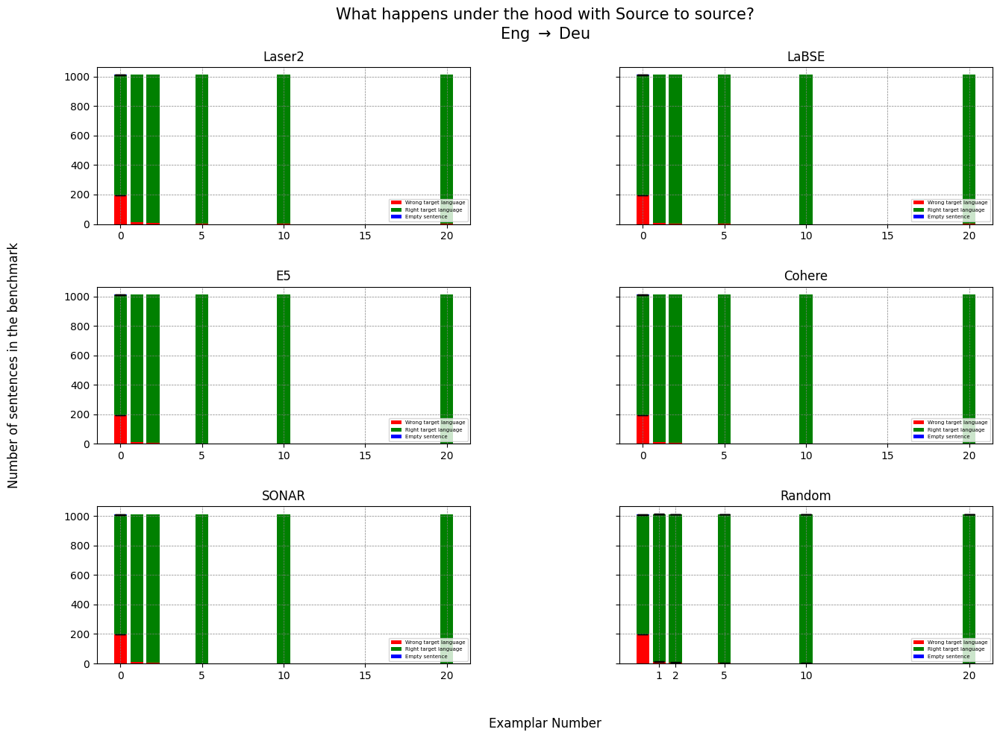

In [100]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

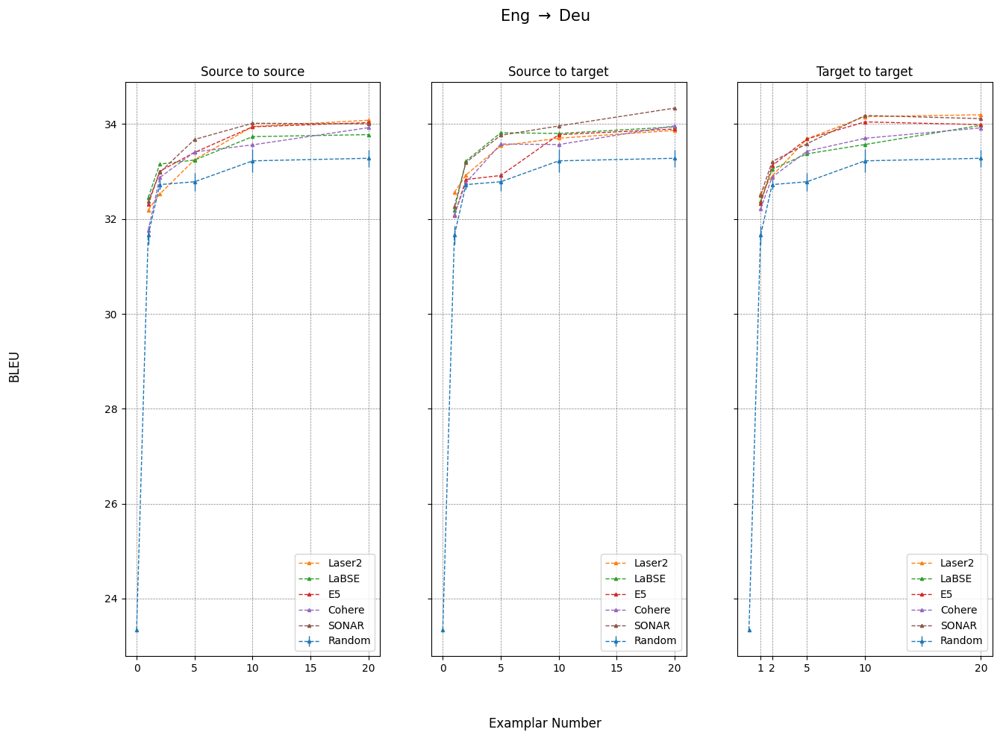

In [101]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ablations

### ngram

In [51]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/gemma-2b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma-2b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/gemma-2b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

In [52]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [31.94899140885162, 32.44759097090617, 33.4502489243097, 33.378288908013374, 33.493770844201784]
BLEU: [31.967783961655794, 32.70761071133971, 33.489136724590004, 33.602348595629294, 34.041196771373585]
BLEU_pos: [32.38955557039315, 32.41905684408858, 32.91106067776153, 32.95708702195426, 33.40761763327107]
Rouge: [32.26749143979814, 32.740224422317866, 33.45641772480388, 33.551268879602766, 33.79372343969346]
Pos: [31.99590798370105, 32.60879217963963, 33.56012519623627, 33.49508297491522, 33.7020778489616]
Grakel: [32.285274018907586, 32.83914773407036, 33.23223268086225, 33.28096725389089, 33.40684065329808]
SONAR: [32.36877147381222, 32.98196135043679, 33.6768414233812, 34.017740700061424, 34.00448472023309]


## English to Swahili

### Regular

In [36]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/gemma-2b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma-2b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/gemma-2b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [ ]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma-2b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [103]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma-2b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

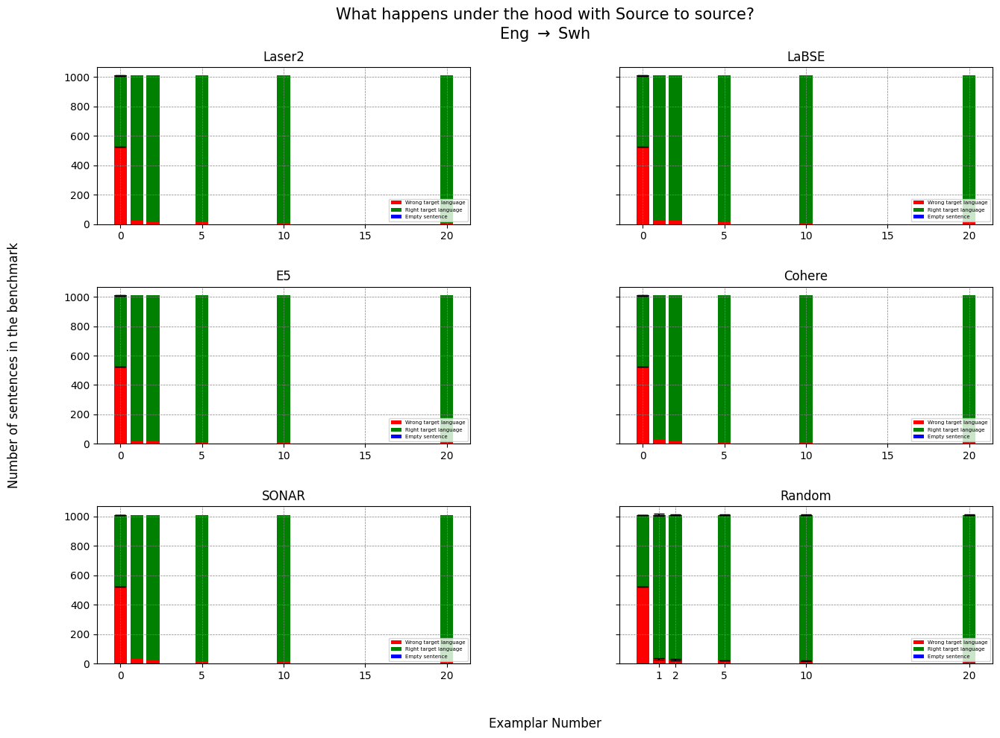

In [104]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

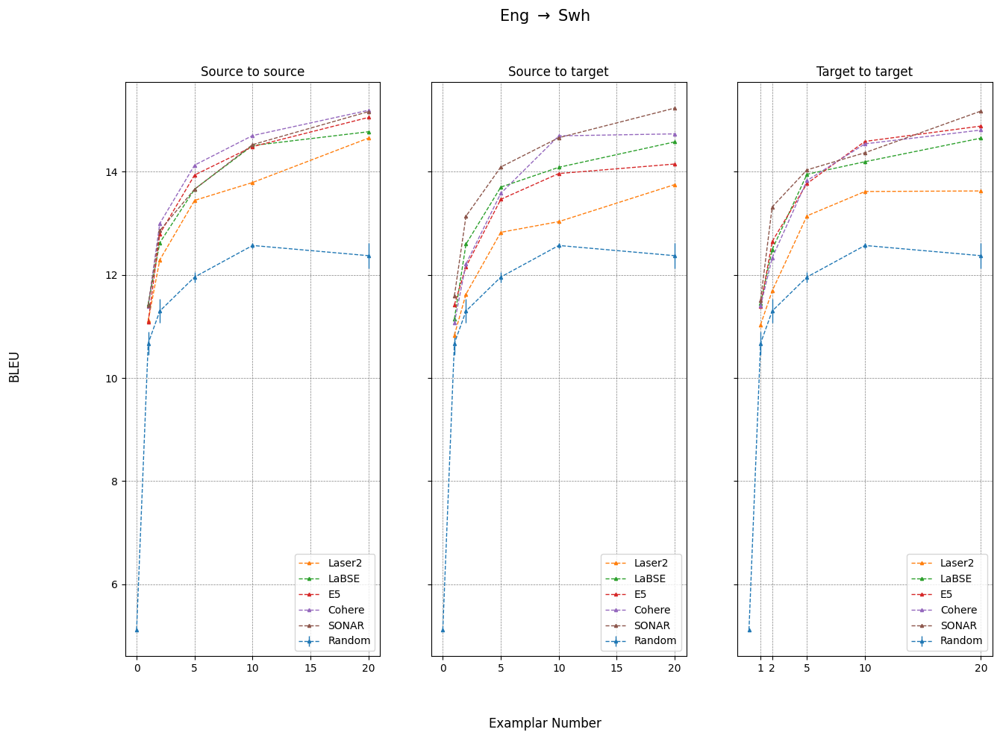

In [105]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_3,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [37]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/gemma-2b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma-2b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/gemma-2b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [38]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [11.85871498038342, 12.883512343681705, 14.270787369897233, 15.1184496309687, 15.371798445341232]
BLEU: [12.120059366809999, 12.580628266162545, 14.070403571468312, 14.300311512022304, 14.519025573492325]
BLEU_pos: [11.010283605561996, 12.01898451090078, 12.088676823544422, 12.502738354495609, 12.801907593853414]
Rouge: [11.269059472828712, 11.959664526772489, 13.091899112930442, 13.50633944687953, 14.048805222840492]
Pos: [10.79887713464197, 11.748181232767621, 12.3232194292847, 12.3954312337262, 12.493669535606616]
Grakel: [9.84497758729889, 10.624136639772324, 11.774571937073901, 12.010004240224914, 12.516133590109032]
SONAR: [11.407749274051756, 12.858068739566827, 13.660379322907257, 14.525556721850027, 15.165796734712973]


### Ablations

In [24]:
S = [10, 100, 500, 997, 1997, 5997, 10997, 20997]

In [25]:
direction = "Eng_to_Swh"
L = []
for size in S :
    d, c = get_scores(
        direction,
        data_dir=f"./generations/gemma-2b/ablations/{size}",
        methods=["SONAR", "Random"] + ["bm25"]
    )
    L.append(d)

In [29]:
K = [1, 5, 10]
methods = ["SONAR", "Random"] + ["bm25"]
full = {k : {} for k in K}
for k in K :
    for d in L :
        for method in methods :
            if method in full[k] :
                full[k][method].append(d[method]["s2s"][k])
            else :
                full[k][method] = [d[method]["s2s"][k]]

In [30]:
dico = full

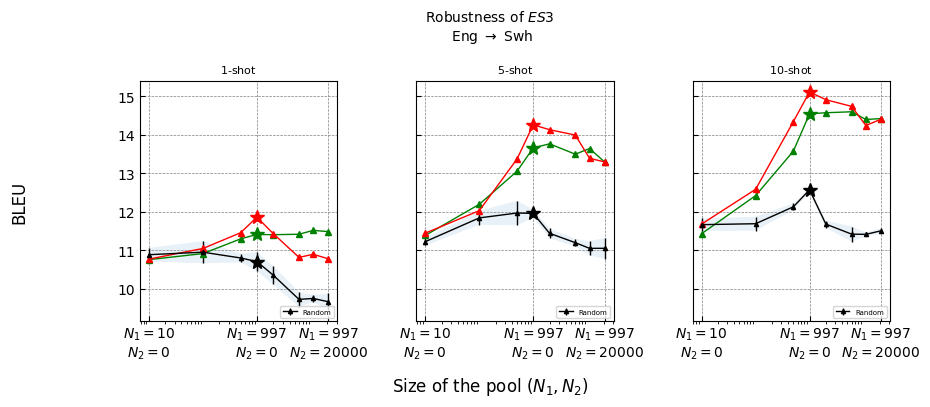

In [31]:
metric = "BLEU"
source, _, target = direction.split("_")
K = [1, 5, 10]
colors = ["green", "red"]
f, ax = plt.subplots(
    1,
    len(K),
    sharey=True,
    figsize=(10, 4)
)

plt.subplots_adjust(
    left=0.15,
    bottom=0.2, 
    #right=0.9, 
    top=0.8, 
    wspace=0.4, 
    #hspace=0.4
)

f.supxlabel("Size of the pool $(N_1, N_2)$")
f.supylabel(f"{metric}")

for i, k in enumerate(K) :
    random_mean = [element["mean"] for element in dico[k]["Random"]]
    random_std = [element["std"] for element in dico[k]["Random"]]
    ax[i].errorbar(
        S,
        random_mean,
        random_std,
        label=f"Random", 
        linewidth=1.0,
        marker="^",
        markersize=3,
        color="black"
    )
    ax[i].plot(
        [997],
        [dico[k]["Random"][3]['mean']],
        marker = "*",
        markersize = 10,
        color = 'black'
    )
    ax[i].fill_between(
        S, 
        [a - b for (a, b) in zip(random_mean, random_std)], 
        [a + b for (a, b) in zip(random_mean, random_std)],
        linewidth=0.0,
        alpha=0.1,
    )
    for j, method_of_interest in enumerate(["SONAR", "bm25"]) :
        ax[i].plot(
            S,
            dico[k][method_of_interest], 
            linewidth=1.0, 
            marker="^", 
            markersize=4,
            color=colors[j]
        )
        ax[i].plot(
            [997],
            [dico[k][method_of_interest][3]],
            marker = "*",
            markersize = 10,
            color = colors[j]
        )
    ax[i].set_title(f"${k}$-shot", fontsize=8)
    ax[i].grid(color="grey", linestyle="--", linewidth=0.5)
    ax[i].legend(loc=4, prop = {"size" : 5})
    ax[i].set_xscale('log')
    ax[i].set_xticks([S[0], S[3], S[-1]])
    ax[i].set_xticklabels(
        ["$N_1=10$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=0$", "$N_1=997$"+"\n"+"$N_2=20000$"],
        #rotation = 90
    )
    ax[i].tick_params(direction = "in")

f.suptitle(f"Robustness of $ES3$\n {source} $\\rightarrow$ {target}", fontsize=10)
plt.show()

## English to Wolof

### Regular

In [56]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/gemma-2b",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/gemma-2b/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/gemma-2b/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/gemma-2b/comet_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [111]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/gemma-2b",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

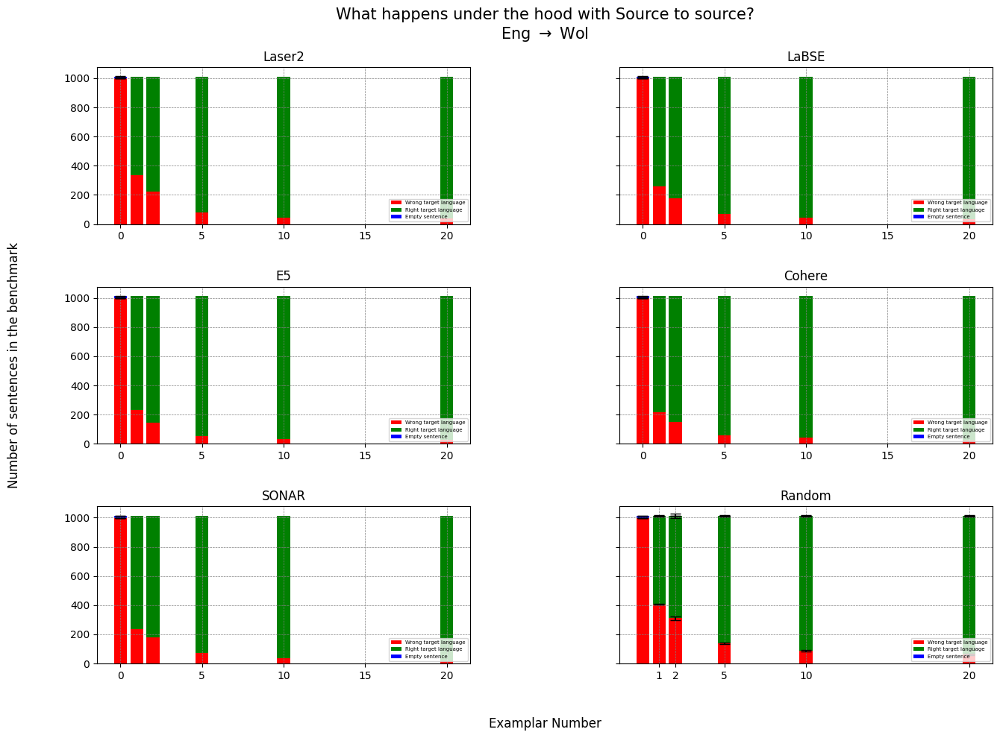

In [112]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

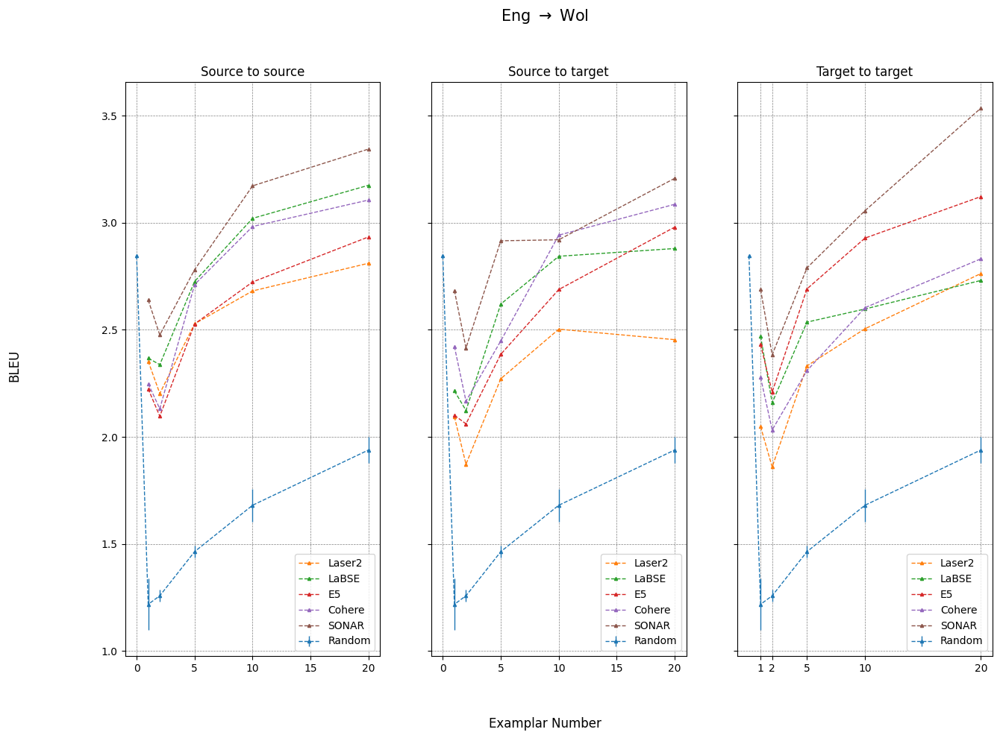

In [113]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### ngram

In [55]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/gemma-2b/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/gemma-2b/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/gemma-2b/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/gemma-2b/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/gemma-2b/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [57]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [1.8491575420062956, 1.828079242026501, 2.3059276891593505, 2.5749029087505626, 2.887540568368014]
BLEU: [1.9678294288806926, 1.6704643190787098, 2.103502041244904, 2.5584324351162655, 2.6791623758307015]
BLEU_pos: [1.959783783425691, 1.6086428133937107, 1.9742603587983458, 2.0803634908376045, 2.3130577196060917]
Rouge: [1.7053758793344207, 1.6414233623040329, 2.0103406635051817, 2.324652543052359, 2.5105133469768033]
Pos: [1.9295524739466108, 1.8662597719670975, 2.2167782167436743, 2.3115642319294407, 2.602931101692038]
Grakel: [1.4934299495949053, 1.5025245038665251, 1.8190726076731596, 1.8486033351842348, 2.1236107118850356]
SONAR: [2.639151009657073, 2.475933291441749, 2.7807380598106337, 3.1722468538174247, 3.344209505625631]


# OLMo

## English to French

### Regular

In [85]:
direction = "Eng_to_Fra"
try :
    d_bleu_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_1, d_chrf_1 = get_scores(
        direction,
        data_dir="./generations/olmo",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/olmo/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_1, fout)
    with open(f"./generations/olmo/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_1, fout)

In [87]:
d_comet_1 = load_scores(
    direction = direction,
    data_dir = "./generations/olmo/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [88]:
d_full_1 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/olmo",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

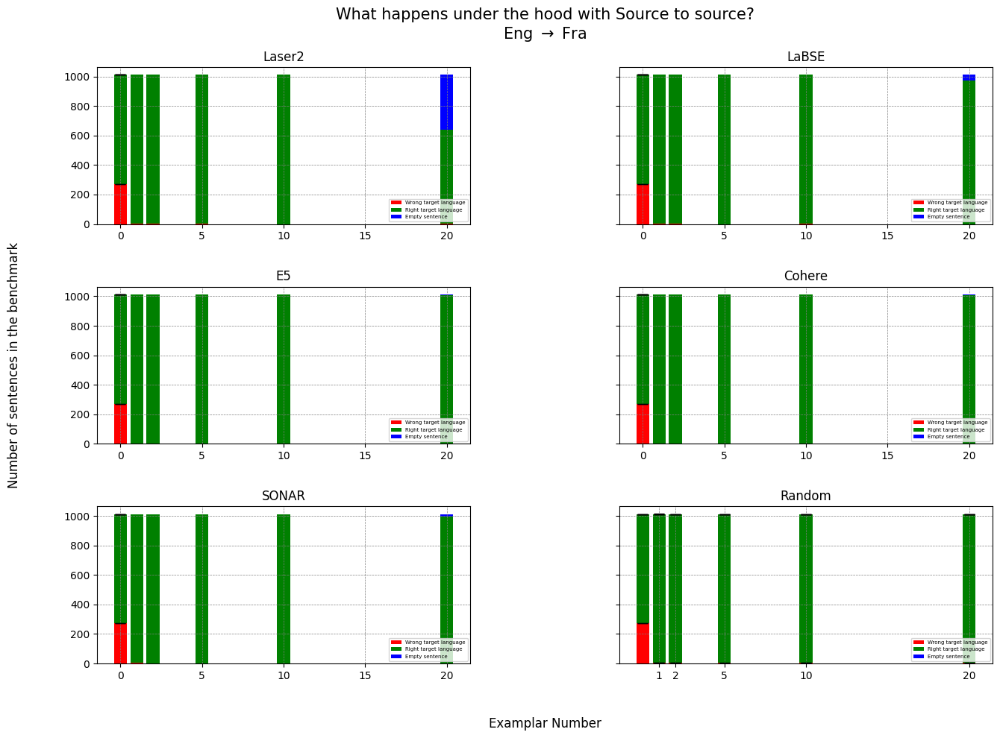

In [89]:
get_analysis(
    direction = direction,
    dico = d_full_1,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_1,
    "BLEU", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_1,
    "COMET", 
    [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    with_zero_shot=True
)

### Ngram

In [31]:
direction = "Eng_to_Fra"
try :
    d_nb_1 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_1 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/olmo/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/olmo/ngram/chrf_scores", exist_ok=True)
    d_nb_1, d_nc_1 = get_scores(
        direction,
        data_dir="./generations/olmo/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/olmo/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_1, fout)
    with open(f"./generations/olmo/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_1, fout)

In [32]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_1[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_1['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [35.08836472122551, 35.63853073372471, 35.97198978147264, 36.0932838986066, 35.89436615045601]
BLEU: [35.49452464868177, 35.402834811094145, 35.958855907056474, 36.06563505332738, 34.19895355658087]
BLEU_pos: [34.726971462242766, 34.99189656732389, 35.2186717258345, 35.35188402580936, 28.513175469792714]
Rouge: [34.79168013322224, 35.27788390102938, 35.335643879707945, 35.72728171601305, 35.679793341449994]
Pos: [34.94959306552394, 35.34597808150577, 35.3594454339545, 35.25662074818509, 3.424717349277264]
Grakel: [35.09546755331887, 35.7119661714098, 35.68704433679852, 35.75538159616878, 0.0]
SONAR: [34.948777172734694, 35.71370862924055, 35.921532445194664, 36.17939492864069, 34.84667472192624]


## English to German

### Regular

In [37]:
direction = "Eng_to_Deu"
try :
    d_bleu_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_2, d_chrf_2 = get_scores(
        direction,
        data_dir="./generations/olmo",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/olmo/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_2, fout)
    with open(f"./generations/olmo/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_2, fout)

In [ ]:
d_comet_2 = load_scores(
    direction = direction,
    data_dir = "./generations/olmo/africomet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_2 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/olmo",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_2,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_2,
    "BLEU", 
    [1, 2, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    #with_zero_shot=True
)

### Ngram

In [36]:
direction = "Eng_to_Deu"
try :
    d_nb_2 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_2 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/olmo/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/olmo/ngram/chrf_scores", exist_ok=True)
    d_nb_2, d_nc_2 = get_scores(
        direction,
        data_dir="./generations/olmo/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/olmo/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_2, fout)
    with open(f"./generations/olmo/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_2, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [38]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_2[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_2['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [23.017607449844842, 23.296801873124316, 23.411340676419854, 23.485512144253864, 22.88166812965352]
BLEU: [23.014716715390083, 23.352450001290574, 23.68974229944275, 23.56387432272092, 21.551327254853714]
BLEU_pos: [22.937567402102335, 23.267731779896643, 23.218860741470998, 23.501523627572013, 17.590479868738065]
Rouge: [23.14912475854642, 22.9513321273578, 22.940363338243365, 23.39068988840011, 23.076609379716107]
Pos: [23.253704610172406, 23.030004689506207, 23.5388371913134, 23.605538517929602, 1.0806510569190768]
Grakel: [23.079089328380352, 23.161676323488276, 22.99303789695731, 23.696921197618224, 0.0]
SONAR: [23.764613041878402, 23.36090093286033, 23.311562173689108, 23.107208648720995, 22.55072955644773]


## English to Swahili

### Regular

In [90]:
direction = "Eng_to_Swh"
try :
    d_bleu_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_3, d_chrf_3 = get_scores(
        direction,
        data_dir="./generations/olmo",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/olmo/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_3, fout)
    with open(f"./generations/olmo/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_3, fout)

In [92]:
d_comet_3 = load_scores(
    direction = direction,
    data_dir = "./generations/olmo/comet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [93]:
d_full_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/olmo",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

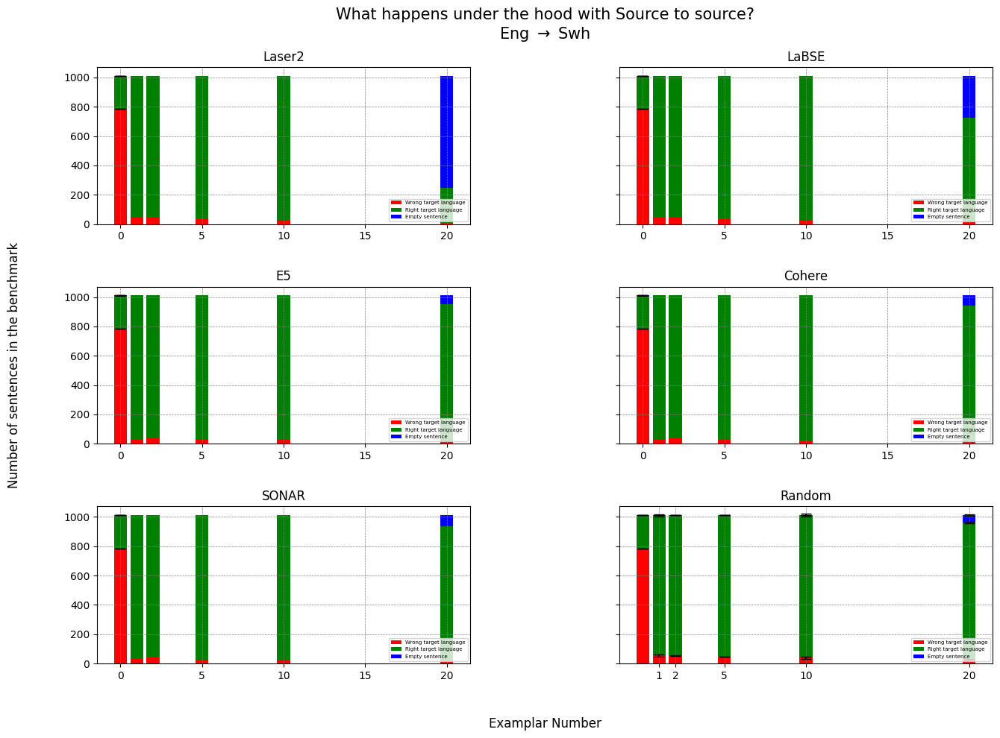

In [94]:
get_analysis(
    direction = direction,
    dico = d_full_3,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

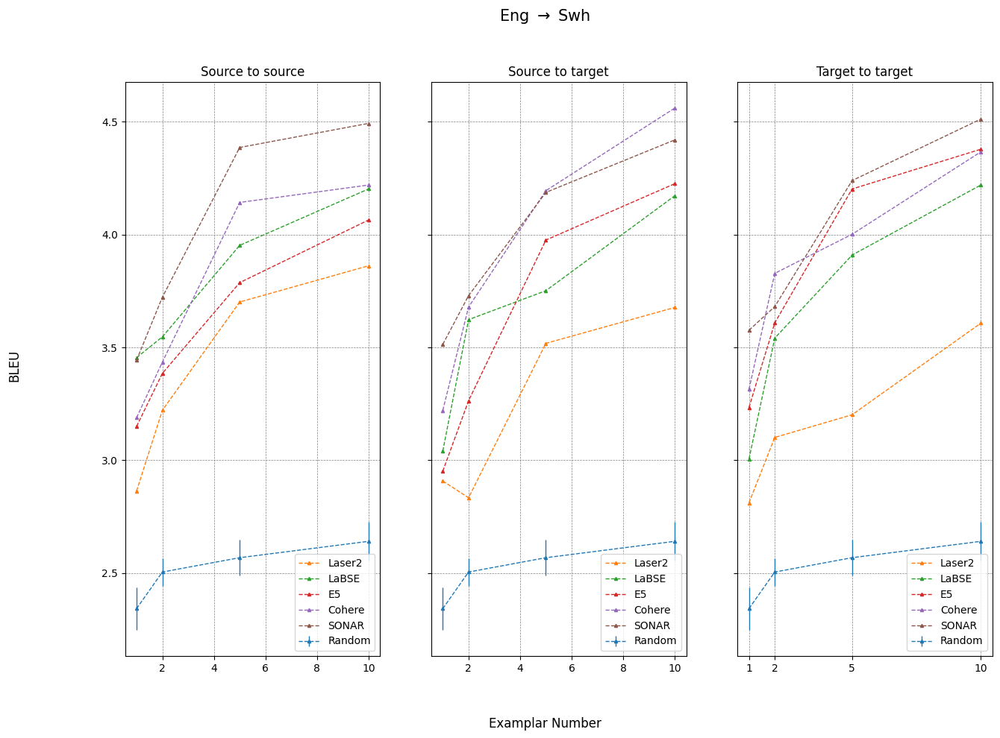

In [97]:
get_plots(
    direction, 
    d_bleu_3,
    "BLEU", 
    [1, 2, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    #with_zero_shot=True
)

### Ngram

In [98]:
direction = "Eng_to_Swh"
try :
    d_nb_3 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_3 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/olmo/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/olmo/ngram/chrf_scores", exist_ok=True)
    d_nb_3, d_nc_3 = get_scores(
        direction,
        data_dir="./generations/olmo/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/olmo/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_3, fout)
    with open(f"./generations/olmo/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_3, fout)

In [99]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_3[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_3['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")

bm25: [3.383678181092539, 3.508064687547895, 4.030735169664147, 4.32088116893191, 3.8097248808183886]
BLEU: [3.2369105553746107, 3.23869291449618, 3.828810202924509, 4.283485394017976, 3.6097986152297694]
BLEU_pos: [2.5301066361862037, 2.80733017096984, 2.7078107179097652, 2.9224113403697527, 2.112339588515182]
Rouge: [2.8927567612716723, 3.0044048487290542, 3.4096834836868877, 3.7121138859085896, 3.8679464756102306]
Pos: [2.5791676362287235, 2.8364987613258474, 2.9193785500574227, 3.020356928270464, 0.0025582243583547977]
Grakel: [2.361663151985658, 2.4926807530220003, 2.491653568723251, 2.6728194390090407, 0.0]
SONAR: [3.44375729592105, 3.7228047151834045, 4.385863426890064, 4.492706618138403, 3.9643927683815745]


In [101]:
d_f_3 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/olmo/ngram",
    methods = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"]
)

The method 'Random' is not part of ['bm25', 'BLEU', 'BLEU_pos', 'Rouge', 'Pos', 'Grakel'].


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


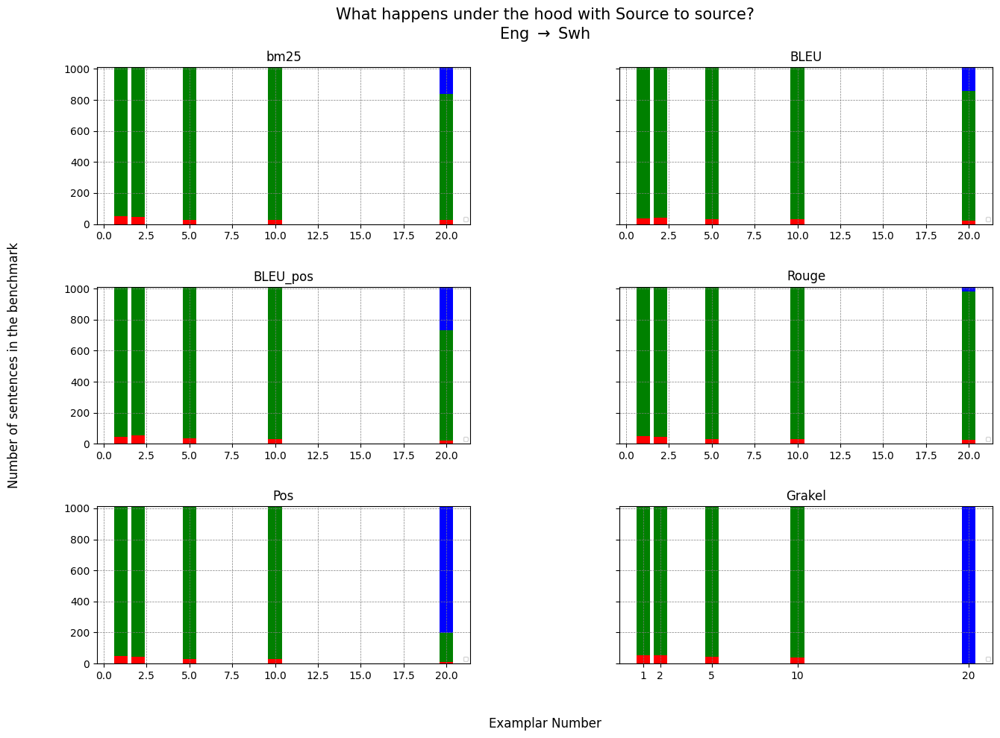

In [103]:
get_analysis(
    direction = direction,
    dico = d_f_3,
    K = [1, 2, 5, 10, 20],
    methods = ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

## English to Wolof

### Regular

In [43]:
direction = "Eng_to_Wol"
try :
    d_bleu_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/bleu_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    d_chrf_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/chrf_scores",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
except :
    d_bleu_4, d_chrf_4 = get_scores(
        direction,
        data_dir="./generations/olmo",
        methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
    )
    with open(f"./generations/olmo/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_bleu_4, fout)
    with open(f"./generations/olmo/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_chrf_4, fout)

In [ ]:
d_comet_4 = load_scores(
    direction = direction,
    data_dir = "./generations/olmo/africomet_la_scores/",
    methods=["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
d_full_4 = get_full_metadata(
    direction = direction,
    data_dir = "./generations/olmo",
    methods = ["Laser2", "Cohere","LaBSE", "SONAR", "Random", "E5"]
)

In [ ]:
get_analysis(
    direction = direction,
    dico = d_full_4,
    K = [1, 2, 5, 10, 20],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR", "Random"],
    rows = 3, cols = 2,
    with_zero_shot = True
)

In [ ]:
get_plots(
    direction, 
    d_bleu_4,
    "BLEU", 
    [1, 2, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    #with_zero_shot=True
)

In [ ]:
get_plots(
    direction, 
    d_comet_4,
    "COMET", 
    [1, 2, 5, 10],
    methods = ["Laser2", "LaBSE", "E5", "Cohere", "SONAR"],
    #with_zero_shot=True
)

### Ngram

In [42]:
direction = "Eng_to_Wol"
try :
    d_nb_4 = load_scores(
        direction = direction,
        score = "BLEU",
        data_dir = "./generations/olmo/ngram/bleu_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    d_nc_4 = load_scores(
        direction = direction,
        score = "chrF++",
        data_dir = "./generations/olmo/ngram/chrf_scores",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
except :
    import os
    os.makedirs("./generations/olmo/ngram/bleu_scores", exist_ok=True)
    os.makedirs("./generations/olmo/ngram/chrf_scores", exist_ok=True)
    d_nb_4, d_nc_4 = get_scores(
        direction,
        data_dir="./generations/olmo/ngram",
        methods=["bm25", "Rouge", "Pos", "Grakel", "BLEU_pos", "BLEU"]
    )
    with open(f"./generations/olmo/ngram/bleu_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nb_4, fout)
    with open(f"./generations/olmo/ngram/chrf_scores/{direction}_scores.json", "w") as fout:
        json.dump(d_nc_4, fout)

The method 'Random' is not part of ['bm25', 'Rouge', 'Pos', 'Grakel', 'BLEU_pos', 'BLEU'].


In [ ]:
for key in  ["bm25", "BLEU", "BLEU_pos", "Rouge", "Pos", "Grakel"] :
    try :
        print(f"{key}: {[d_nb_4[key]['s2s'][k] for k in [1, 2, 5, 10, 20]]}")
    except :
        pass
print(f"SONAR: {[d_bleu_4['SONAR']['s2s'][k] for k in [1, 2, 5, 10, 20]]}")